# Dữ liệu

## Gọi bộ dữ liệu

In [1]:
import pandas as pd

In [2]:
# Gọi bộ dữ liệu đã lưu, trong folder /content, đã chia Train/Valid : Test theo tỉ lệ 8:2
path = "../data/merged_data"
train_valid_processed_comments = pd.read_csv(f"{path}/merged_data_0_enjoy.csv")
test_processed_comments = pd.read_csv("../data/preprocessed_data/preprocessed_test.csv")

In [3]:
train_valid_processed_comments.shape, test_processed_comments.shape

((7502, 4), (688, 3))

In [4]:
test_processed_comments.head(3)

,Sentence,Emotion,Tokenized_Sentence
0,người ta có bạn bè nhìn vui thật,Sadness,"['người', 'ta', 'bạn bè', 'nhìn', 'vui']"
1,cho nghỉ viêc mói đúng sao goi là kỷ luật,Surprise,"['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', ..."
2,kinh vãi phẫn_nộ,Disgust,"['kinh vãi', 'phẫn_nộ']"


## Chuyển đổi cột *Tokenized_Sentence* về danh sách từ

In [5]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'str'>
5 phần tử đầu tiên: ["['người', 'ta', 'bạn bè', 'nhìn', 'vui']", "['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật']", "['kinh vãi', 'phẫn_nộ']", "['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười']", "['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']"]


**Do dữ liệu đã được tiền xử lý và lưu dưới dạng chuỗi, ta cần chuyển đổi chúng trở lại thành danh sách từ**

In [6]:
import ast

# Sử dụng hàm literal_eval để chuyển chuỗi thành danh sách
train_valid_processed_comments['Tokenized_Sentence'] = train_valid_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)
test_processed_comments['Tokenized_Sentence'] = test_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)

In [7]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử sau khi chuyển đổi
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'list'>
5 phần tử đầu tiên: [['người', 'ta', 'bạn bè', 'nhìn', 'vui'], ['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật'], ['kinh vãi', 'phẫn_nộ'], ['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười'], ['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']]


# Tiền xử lý

## Tách các tập Train - Validation - Test và label

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
def split_train_valid_test(df_train_valid, df_test, train_size, valid_size, random_state=11):
    X_train, X_valid, y_train, y_valid = train_test_split(
        df_train_valid.drop('Emotion', axis=1),
        df_train_valid['Emotion'],
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=df_train_valid['Emotion']
    )

    X_test = df_test.drop('Emotion', axis=1)
    y_test = df_test['Emotion']

    return X_train, X_valid, X_test, y_train, y_valid, y_test

## TF-IDF
**TF-IDF = Term Frequency * Inverse Document Frequency**
- Từ xuất hiện nhiều trong câu nhưng ít trong toàn bộ corpus => trọng số cao
- Từ phổ biến (stop words) => trọng số thấp

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer

def tfidf_embedding(tokens, max_features=8000, min_df=2, max_df=0.95):
    # Chuyển đổi danh sách token thành TF-IDF representation
    # max_features : Số lượng từ vựng tối đa mà  (mặc định: 8000)
    # tokens: Danh sách các token

    # Chuyển danh sách token thành chuỗi văn bản
    texts = [' '.join(token_list) for token_list in tokens]

    # Khởi tạo TfidfVectorizer
    vectorizer = TfidfVectorizer(
        max_features=max_features,
        ngram_range=(1, 2), # Sử dụng unigram và bigram
        min_df=min_df,           # Bỏ qua từ xuất hiện < min_df lần
        max_df=max_df         # Bỏ qua từ xuất hiện > max_df documents
    )

    # fit_transform
    # ma trận TF-IDF (n_samples x n_features)
    tfidf_matrix = vectorizer.fit_transform(texts)

    print("TF-IDF hoàn thành!")
    print(f"Shape: {tfidf_matrix.shape} (số câu x số từ vựng)")
    print("Số từ vựng:", len(vectorizer.get_feature_names_out()))
    print("TF-IDF - Non-zero values:", tfidf_matrix.nnz)

    return tfidf_matrix, vectorizer

In [11]:
def tfidf_transform(tokens, tfidf_vectorizer):
    texts = [' '.join(token_list) for token_list in tokens]
    return tfidf_vectorizer.transform(texts)

## Chuyển sang mảng numpy

In [12]:
def convert_to_array(tfidf_matrix):
    return tfidf_matrix.toarray()

In [13]:
def convert_full_to_array(train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix):
    return convert_to_array(train_tfidf_matrix), convert_to_array(valid_tfidf_matrix), convert_to_array(test_tfidf_matrix)

# Giảm chiều

## PCA
Giữ lại 90% thông tin sau khi PCA

In [14]:
from sklearn.decomposition import PCA

In [15]:
def pca(X_train_arr, X_test_arr, X_valid_arr, n_components=0.9):
    pca_model = PCA(n_components=n_components)
    X_train_pca = pca_model.fit_transform(X_train_arr)
    X_test_pca = pca_model.transform(X_test_arr)
    X_valid_pca = pca_model.transform(X_valid_arr)

    return pca_model, X_train_pca, X_test_pca, X_valid_pca

## LDA

- Tìm ma trận W chiếu DL vào không gian LDA
- Sau khi học được W, tính các hàm phân biệt tuyến tính (linear discriminats) để dự đoán lớp
- Thay vì mỗi TPC giữ một phần thông tin như PCA, thì LDA sẽ giữ một phần thông tin giúp phân biệt giữa các lớp
- Vì thế, LDA có thể giảm còn số chiều max là (n-1) chiều (n là số nhãn)

In [16]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

### LDA còn 6 chiều

In [17]:
def lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components):
    lda = LDA(n_components=n_components)
    X_train_lda =lda.fit_transform(X_train_arr, y_train)
    X_test_lda = lda.transform(X_test_arr)
    X_valid_lda = lda.transform(X_valid_arr)

    return lda, X_train_lda, X_test_lda, X_valid_lda

- LDA tìm ra 6 hướng giúp phân biệt tâm của 7 label
- Các vector riêng của S_w^-1 * S_B mô tả toàn bộ thông tin phân biệt giữa các lớp, tức là TOÀN BỘ KHẢ NĂNG PHÂN BIỆT đã ở trong 6 chiều này

## Hàm lựa chọn giảm chiều theo cách nào

In [18]:
def use_discriminant(X_train_arr, y_train, X_test_arr, X_valid_arr, discriminant="none", n_components_pca=0.9, n_components_lda=6):
    if discriminant == "pca":
        return pca(X_train_arr, X_test_arr, X_valid_arr, n_components_pca)

    elif discriminant == "lda":
        return lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components_lda)

    return None, X_train_arr, X_test_arr, X_valid_arr

# Model phân loại

In [19]:
import time

## HOI QUY SOFTMAX - MULTINOMIAL LOGISTIC REGRESSION

In [20]:
from sklearn.linear_model import LogisticRegression

In [21]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [22]:
def log_reg(X_train, y_train, random_state=11, max_iter=1000):
    log_reg = LogisticRegression(
        multi_class='multinomial',
        class_weight='balanced',
        random_state=random_state,
        max_iter=max_iter)

    log_reg.fit(X_train, y_train)

    return log_reg

## K-NN

In [23]:
from sklearn.neighbors import KNeighborsClassifier

In [24]:
def knn(X_train, y_train, metric = 'cosine'):
    knn = KNeighborsClassifier(
    n_neighbors=83,
    metric=metric,
    n_jobs=-1)  # Dùng tất cả CPU cores để tăng tốc độ chạy

    knn.fit(X_train, y_train)

    return knn

## Hàm lựa chọn mô hình và dự đoán

In [25]:
def use_model(model_type, X_train_processed, y_train, metric='cosine', max_iter=1000,
              C=1.0, svm_kernel='rbf', svm_gamma='scale', svm_degree=3,
              tree_max_depth=None, nb_alpha=1.0,
              mlp_hidden=(128,), mlp_alpha=1e-4,
              random_state=11):
    if model_type == 'logistic_regression':
        model = LogisticRegression(
            C=C,
            multi_class='multinomial',
            class_weight='balanced',
            max_iter=max_iter,
            random_state=random_state
        )
    elif model_type == 'knn':
        model = knn(X_train_processed, y_train, metric)
    elif model_type == 'svm':
        if svm_kernel == 'linear':
            model = LinearSVC(C=C, class_weight='balanced', random_state=random_state, max_iter=max_iter)
        elif svm_kernel == 'poly':
            model = SVC(C=C, kernel='poly', degree=svm_degree, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size=1000)
        else:
            model = SVC(C=C, kernel=svm_kernel, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size=1000)
    elif model_type == 'naive_bayes':
        model = MultinomialNB(alpha=nb_alpha)
    elif model_type == 'decision_tree':
        model = DecisionTreeClassifier(
            max_depth=tree_max_depth,
            min_samples_leaf=2,
            random_state=random_state
        )
    elif model_type == 'mlp':
        model = MLPClassifier(
            hidden_layer_sizes=mlp_hidden,
            alpha=mlp_alpha,
            max_iter=max_iter,
            random_state=random_state
        )
    else:
        raise ValueError(f'Unknown model_type: {model_type}')

    if model_type in ['knn']:
        # KNN is trained inside knn()
        return model

    model.fit(X_train_processed, y_train)
    return model

In [26]:
def predict(model, X_train, X_valid, X_test):
    # model là log_reg, knn hoặc svm

    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)

    return y_pred_train, y_pred_valid, y_pred_test

## Đánh giá độ chính xác và trực quan

### Đánh giá độ chính xác

In [27]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [28]:
def get_metrics(y_true, y_pred):
    return accuracy_score(y_true, y_pred), precision_score(y_true, y_pred, average='weighted'), recall_score(y_true, y_pred, average='weighted'), f1_score(y_true, y_pred, average='weighted')

In [29]:
def get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test):
    accuracy_train, precision_train, recall_train, f1_train = get_metrics(y_train, y_pred_train)
    accuracy_valid, precision_valid, recall_valid, f1_valid = get_metrics(y_valid, y_pred_valid)
    accuracy_test, precision_test, recall_test, f1_test = get_metrics(y_test, y_pred_test)

    return [accuracy_train, precision_train, recall_train, f1_train], [accuracy_valid, precision_valid, recall_valid, f1_valid], [accuracy_test, precision_test, recall_test, f1_test]

In [30]:
def print_metrics(accuracy, precision, recall, f1):
    print("Accuracy:", accuracy)
    print("Recall:", recall)
    print("Precision:", precision)
    print("F1-score:", f1)

### Trực quan

In [31]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [32]:
# vẽ ma trận nhầm lẫn
def plot_normalized_confusion_matrix(y_true, y_pred, title='Normalized Confusion Matrix'):
    cm_normalized = confusion_matrix(y_true, y_pred, normalize='true')
    classes = np.unique(y_true)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [33]:
# hàm vẽ cả 3 ma trận nhầm lẫn cho cả 3 tập train - valid - test
def plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                          title='Normalized Confusion Matrix', discriminant="none", model_type="logistic_regression"):
    plot_normalized_confusion_matrix(y_train, y_pred_train, title=title + " Train " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_valid, y_pred_valid, title=title + " Valid " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_test, y_pred_test, title=title + " Test " + discriminant + " " + model_type)

# Pipeline cho bài toán phân loại

## Chuẩn bị dữ liệu 

In [34]:
def prepare_data_for_modeling(df_train_valid, df_test, train_size, valid_size, random_state=11,
                              min_df=2, max_df=0.95, max_features=8000,
                              discriminant="none", n_components_pca=0.9, n_components_lda=6):
    "TF-IDF, PCA/LDA trước khi vào pipeline modeling"
    
    # Chia train-valid
    X_train, X_valid, X_test, y_train, y_valid, y_test = split_train_valid_test(
        df_train_valid, df_test, train_size, valid_size, random_state
    )

    # TF-IDF Vectorization
    train_tfidf_matrix, tfidf_vectorizer = tfidf_embedding(
        X_train['Tokenized_Sentence'], 
        max_features=max_features, 
        min_df=min_df, 
        max_df=max_df
    )

    # Transform cho valid và test
    valid_tfidf_matrix = tfidf_transform(X_valid['Tokenized_Sentence'], tfidf_vectorizer)
    test_tfidf_matrix = tfidf_transform(X_test['Tokenized_Sentence'], tfidf_vectorizer)

    # Chuyển sang mảng numpy
    X_train_processed, X_valid_processed, X_test_processed = convert_full_to_array(
        train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix
    )

    # Giảm chiều (None / PCA / LDA)
    discriminant_model, X_train_processed, X_test_from_disc, X_valid_from_disc = use_discriminant(
        X_train_processed, y_train, X_test_processed, X_valid_processed,
        discriminant, n_components_pca, n_components_lda
    )
    X_valid_processed = X_valid_from_disc
    X_test_processed = X_test_from_disc

    # Trả về 
    # 1. DL đã processed (TF-IDF và có thể giảm chiều) 
    # 2. Nhãn của tập train - test - valid
    # 3. vectorize đã fit trên train
    # 4. Model giảm chiều đã fit trên train
    return (X_train_processed, X_valid_processed, X_test_processed, 
            y_train, y_valid, y_test, 
            tfidf_vectorizer, discriminant_model)

In [35]:
def pipeline_modeling(X_train, X_valid, X_test, y_train, y_valid, y_test,
                      model_type='logistic_regression', max_iter=1000, metric='cosine', model_params=None):

    if model_params is None:
        model_params = {}

    # Huấn luyện mô hình
    model = use_model(
        model_type, X_train, y_train, metric=metric, max_iter=max_iter, **model_params
    )

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict(model, X_train, X_valid, X_test)

    return model, [X_train, y_train], [X_valid, y_valid], [X_test, y_test], [y_pred_train, y_pred_valid, y_pred_test]


## Đánh giá độ chính xác và trực quan

In [36]:
# đánh giá độ chính xác và trực quan
def pipeline_evaluation(y_train, y_valid, y_test,
                        y_pred_train, y_pred_valid, y_pred_test,
                        train_size, valid_size, discriminant, model_type,
                        show_plot=True):

    metrics_train, metrics_valid, metrics_test = get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test)

    # train
    print(f"--- train --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_train[0], metrics_train[1], metrics_train[2], metrics_train[3])

    print()

    # valid
    print(f"--- valid --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_valid[0], metrics_valid[1], metrics_valid[2], metrics_valid[3])

    print()

    # test
    print(f"--- test --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_test[0], metrics_test[1], metrics_test[2], metrics_test[3])

    # trực quan
    if show_plot: plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                                        discriminant=discriminant, model_type=model_type)

# **Chạy pipeline**

# Train:Validation = 8:2

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [37]:
X_train_82, X_valid_82, X_test_82, y_train_82, y_valid_82, y_test_82, tfidf_vec_82, disc_model_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (6001, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 81525


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.8220296617230461
Recall: 0.8220296617230461
Precision: 0.8262793183975267
F1-score: 0.8213121054931911

--- valid --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5463024650233178
Recall: 0.5463024650233178
Precision: 0.5460693805134788
F1-score: 0.5439949903890978

--- test --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5261627906976745
Recall: 0.5261627906976745
Precision: 0.5538423041031351
F1-score: 0.5340500933320244


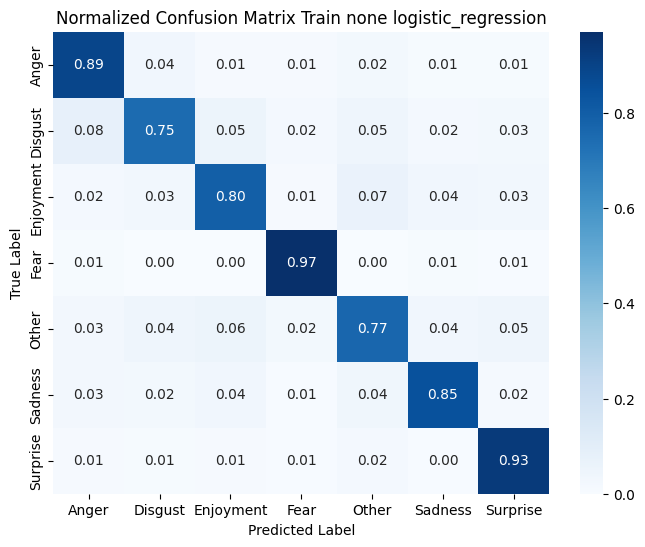

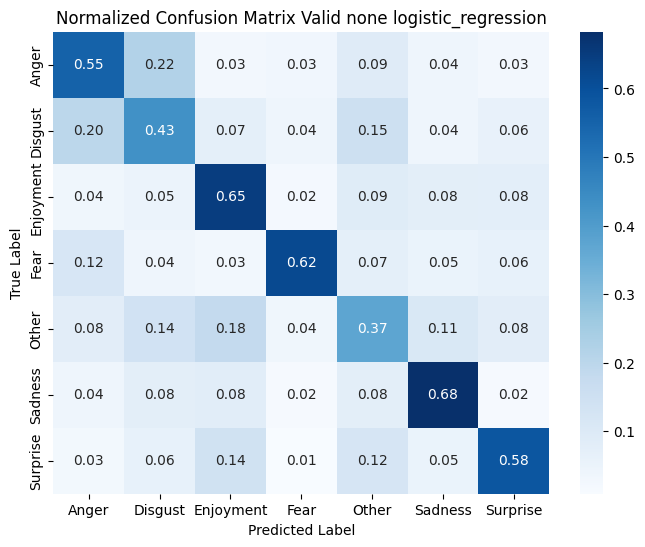

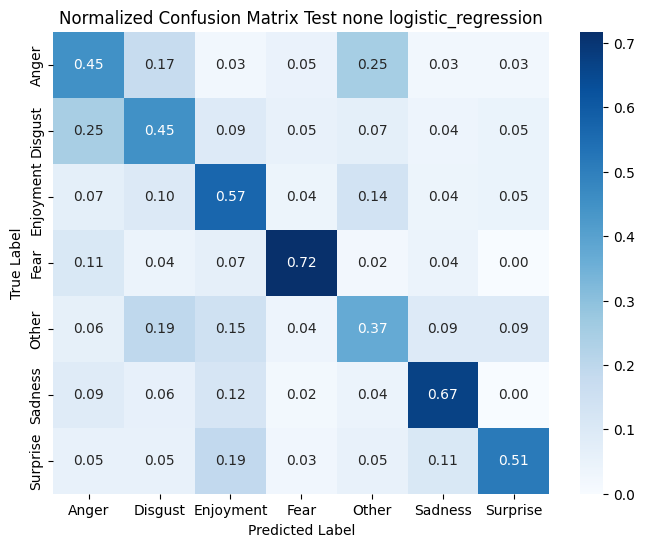

In [38]:
model_82, train_82, valid_82, test_82, pred_82 = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="logistic_regression",
    max_iter=1000
)

# Dự đoán từ pipeline_modeling
y_pred_train_82, y_pred_valid_82, y_pred_test_82 = pred_82

pipeline_evaluation(
    y_train_82, y_valid_82, y_test_82,
    y_pred_train_82, y_pred_valid_82, y_pred_test_82,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (6001, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 81525


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.7815364105982336
Recall: 0.7815364105982336
Precision: 0.7870663913721614
F1-score: 0.7808116688522115

--- valid --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5403064623584277
Recall: 0.5403064623584277
Precision: 0.5407077168118042
F1-score: 0.5381336408415204

--- test --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5116279069767442
Recall: 0.5116279069767442
Precision: 0.5386335174646728
F1-score: 0.5194457592917473


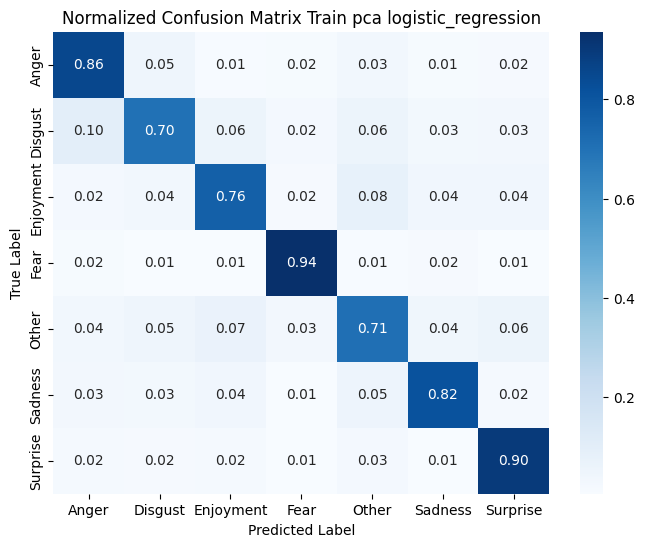

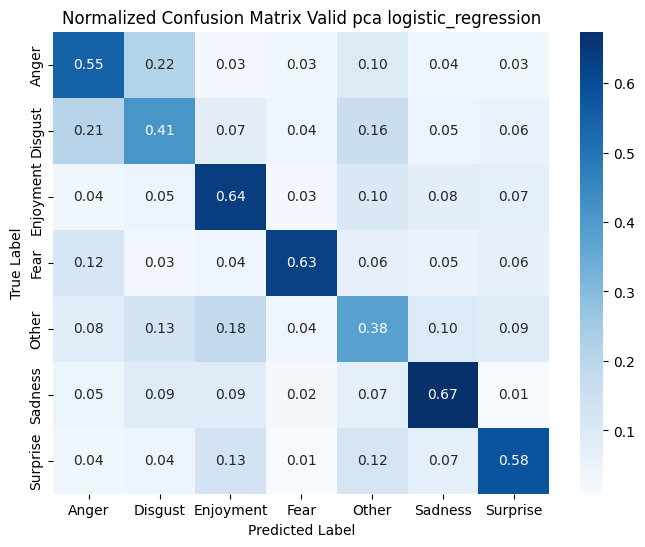

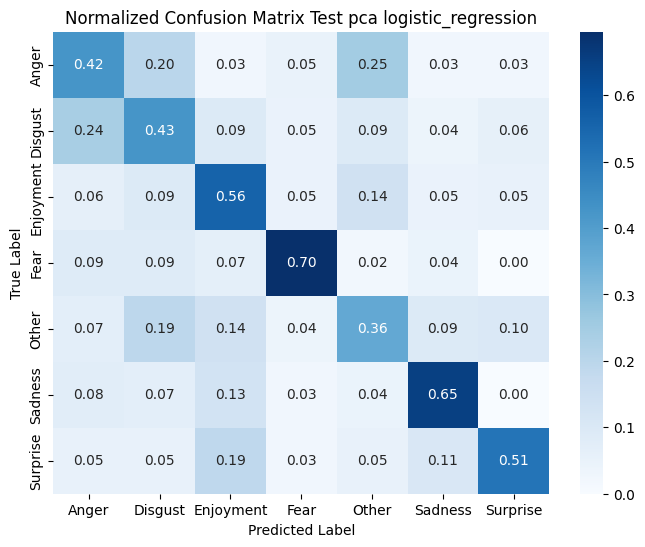

In [39]:
# Chuẩn bị dữ liệu với PCA
X_train_pca_82, X_valid_pca_82, X_test_pca_82, y_train_pca_82, y_valid_pca_82, y_test_pca_82, tfidf_vec_pca_82, disc_model_pca_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="pca"
)

# Chạy mô hình Logistic Regression trên dữ liệu PCA
model_pca_82, train_pca_82, valid_pca_82, test_pca_82, pred_pca_82 = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_pca_82, y_valid_pca_82, y_test_pca_82 = train_pca_82[1], valid_pca_82[1], test_pca_82[1]
y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82 = pred_pca_82

pipeline_evaluation(
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (6001, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 81525


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.9981669721713048
Recall: 0.9981669721713048
Precision: 0.9981731798383228
F1-score: 0.9981686128147902

--- valid --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.23984010659560293
Recall: 0.23984010659560293
Precision: 0.25453974131098606
F1-score: 0.24115872313930087

--- test --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.24563953488372092
Recall: 0.24563953488372092
Precision: 0.2701724695883318
F1-score: 0.24985764448873127


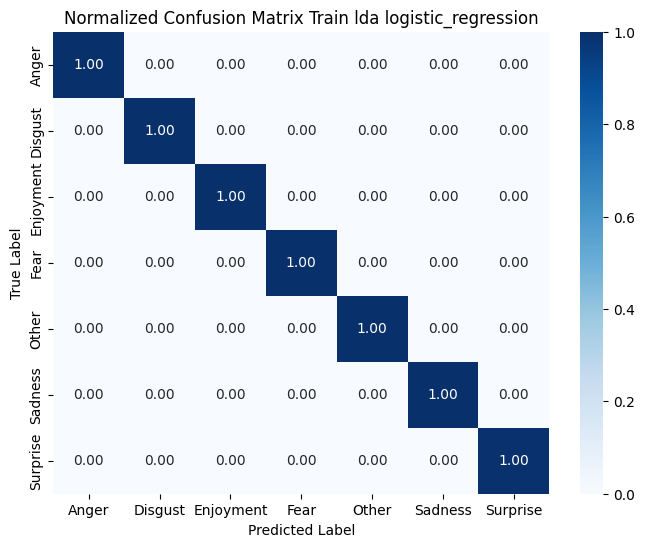

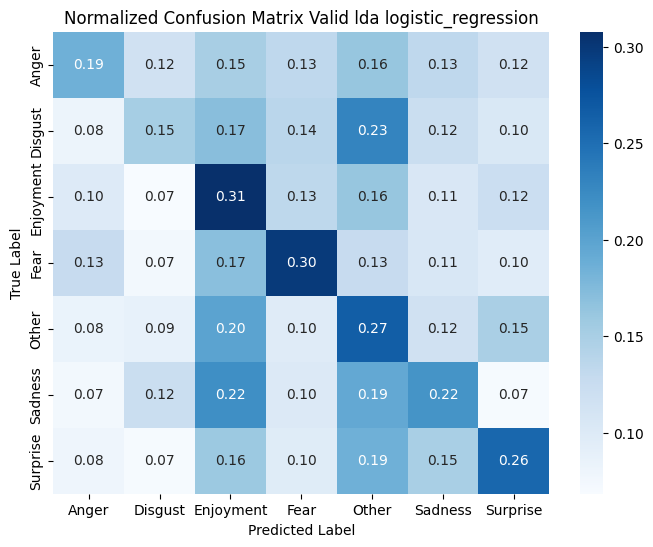

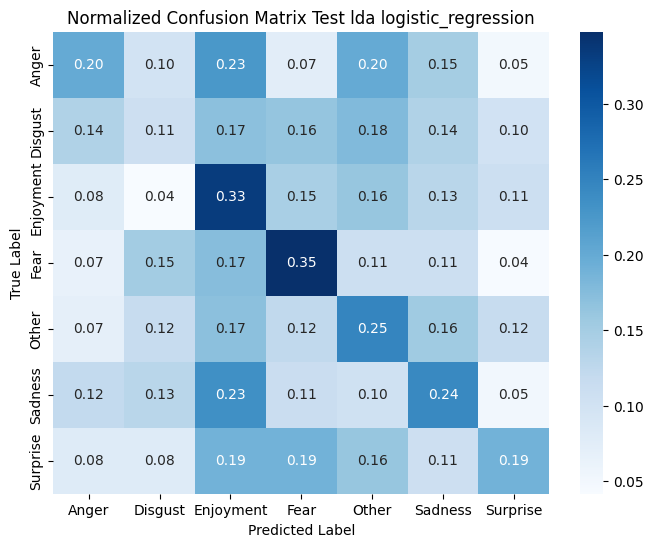

In [40]:
# Chuẩn bị dữ liệu với LDA
X_train_lda_82, X_valid_lda_82, X_test_lda_82, y_train_lda_82, y_valid_lda_82, y_test_lda_82, tfidf_vec_lda_82, disc_model_lda_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="lda"
)

# Chạy mô hình Logistic Regression trên dữ liệu LDA
model_lda_82, train_lda_82, valid_lda_82, test_lda_82, pred_lda_82 = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_lda_82, y_valid_lda_82, y_test_lda_82 = train_lda_82[1], valid_lda_82[1], test_lda_82[1]
y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82 = pred_lda_82

pipeline_evaluation(
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- knn --- none ---
Accuracy: 0.5115814030994834
Recall: 0.5115814030994834
Precision: 0.5397290603036703
F1-score: 0.4976203570895274

--- valid --- 8:2 --- knn --- none ---
Accuracy: 0.4643570952698201
Recall: 0.4643570952698201
Precision: 0.4863123224130884
F1-score: 0.44869445504729455

--- test --- 8:2 --- knn --- none ---
Accuracy: 0.47238372093023256
Recall: 0.47238372093023256
Precision: 0.49117487217143246
F1-score: 0.4581996795587783


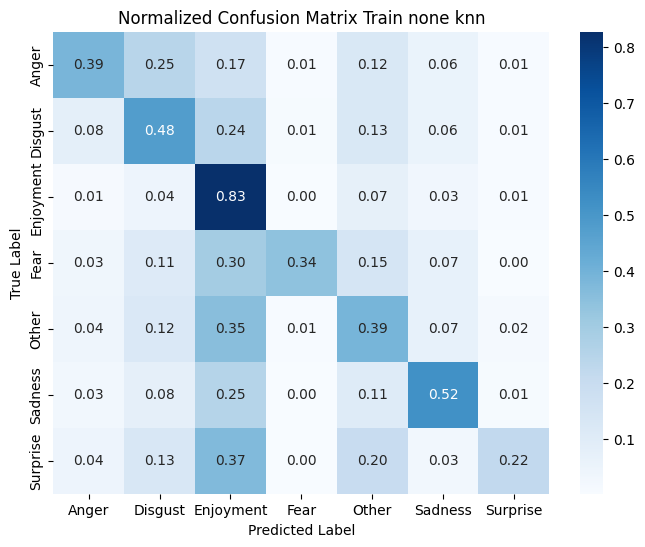

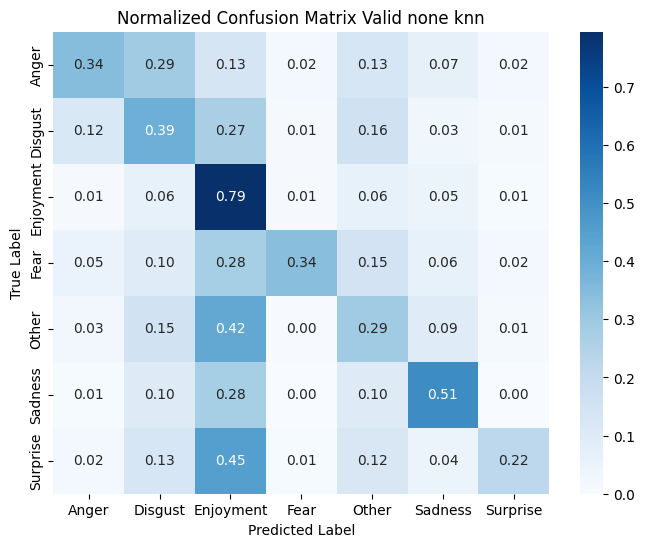

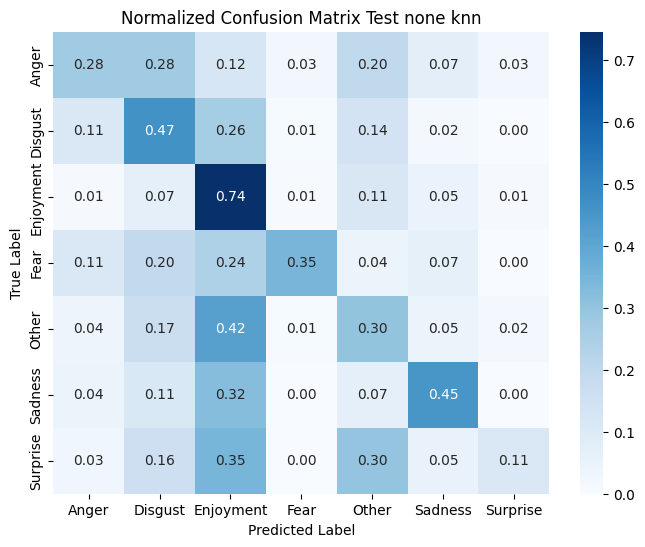

In [41]:
# Chạy KNN - cosine - None
model_82_knn, train_82_knn, valid_82_knn, test_82_knn, pred_82_knn = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn"
)

y_train_82_knn, y_valid_82_knn, y_test_82_knn = train_82_knn[1], valid_82_knn[1], test_82_knn[1]
y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn = pred_82_knn

pipeline_evaluation(
    y_train_82_knn, y_valid_82_knn, y_test_82_knn,
    y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

--- train --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.5127478753541076
Recall: 0.5127478753541076
Precision: 0.5413313290592108
F1-score: 0.5053545027989993

--- valid --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.46835443037974683
Recall: 0.46835443037974683
Precision: 0.4853540109951163
F1-score: 0.4573615487248234

--- test --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.4738372093023256
Recall: 0.4738372093023256
Precision: 0.49013345390616675
F1-score: 0.46592458732665687


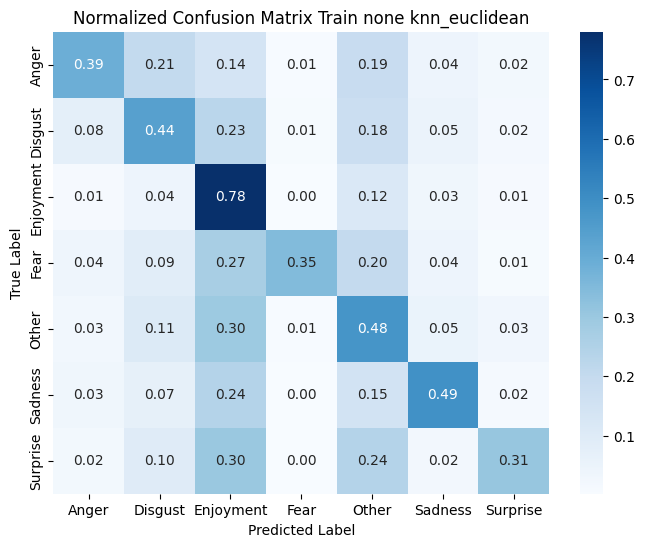

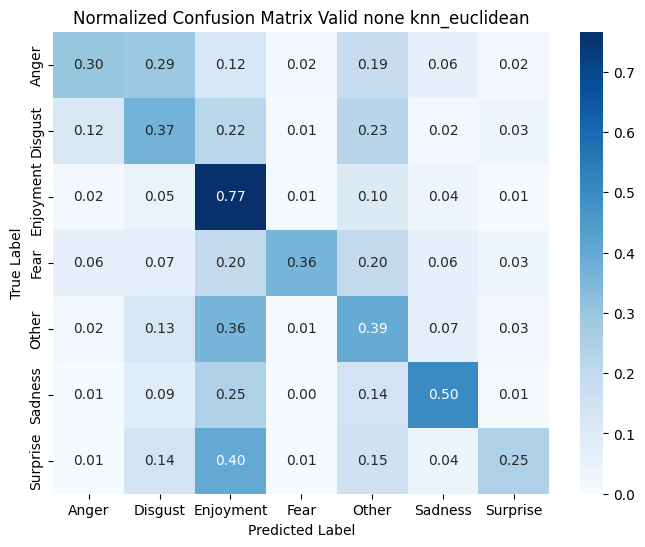

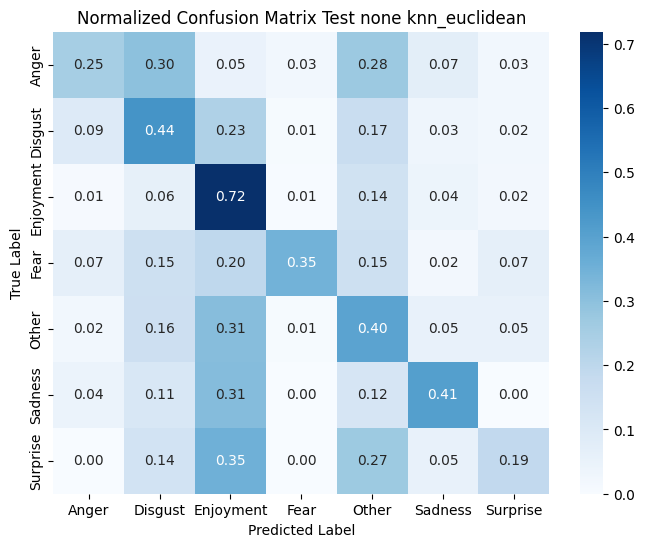

In [42]:
# KNN - euclidean - None
model_82_knn_euclidean, train_82_knn_euclidean, valid_82_knn_euclidean, test_82_knn_euclidean, pred_82_knn_euclidean = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn",
    metric="euclidean"
)

y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean = train_82_knn_euclidean[1], valid_82_knn_euclidean[1], test_82_knn_euclidean[1]
y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean = pred_82_knn_euclidean

pipeline_evaluation(
    y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean,
    y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- knn --- pca ---
Accuracy: 0.5149141809698383
Recall: 0.5149141809698383
Precision: 0.5440308095039474
F1-score: 0.5022360639968377

--- valid --- 8:2 --- knn --- pca ---
Accuracy: 0.46568954030646237
Recall: 0.46568954030646237
Precision: 0.49498863731772724
F1-score: 0.45034043544005736

--- test --- 8:2 --- knn --- pca ---
Accuracy: 0.47093023255813954
Recall: 0.47093023255813954
Precision: 0.48981885226818733
F1-score: 0.4587421322506354


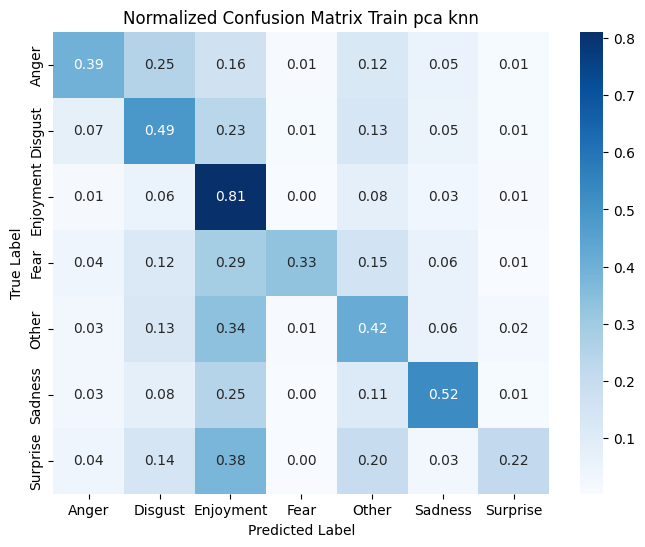

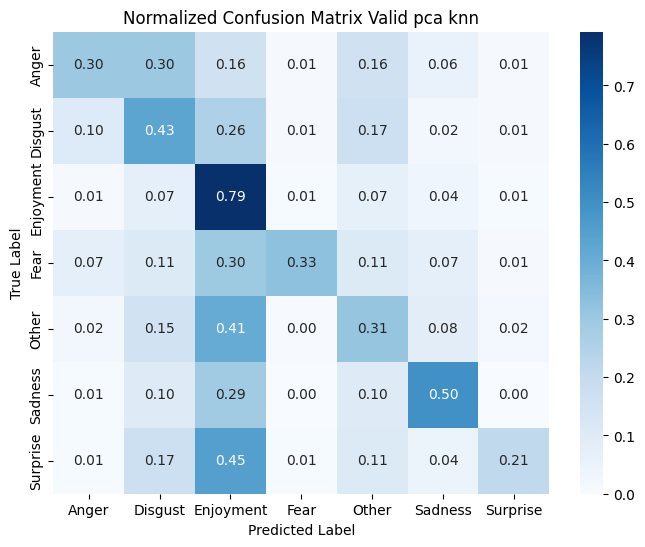

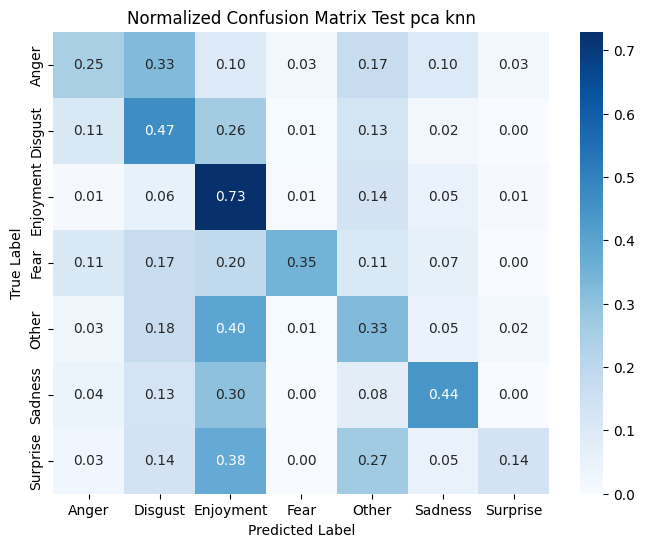

In [43]:
model_pca_82_knn, train_pca_82_knn, valid_pca_82_knn, test_pca_82_knn, pred_pca_82_knn = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    max_iter=1000
)

y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn = train_pca_82_knn[1], valid_pca_82_knn[1], test_pca_82_knn[1]
y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn = pred_pca_82_knn

pipeline_evaluation(
    y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn,
    y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

--- train --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.5204132644559241
Recall: 0.5204132644559241
Precision: 0.547904844139131
F1-score: 0.5115858312201014

--- valid --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.4776815456362425
Recall: 0.4776815456362425
Precision: 0.4974167598688618
F1-score: 0.4666716572575857

--- test --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.4883720930232558
Recall: 0.4883720930232558
Precision: 0.5098999484211298
F1-score: 0.4796188938371968


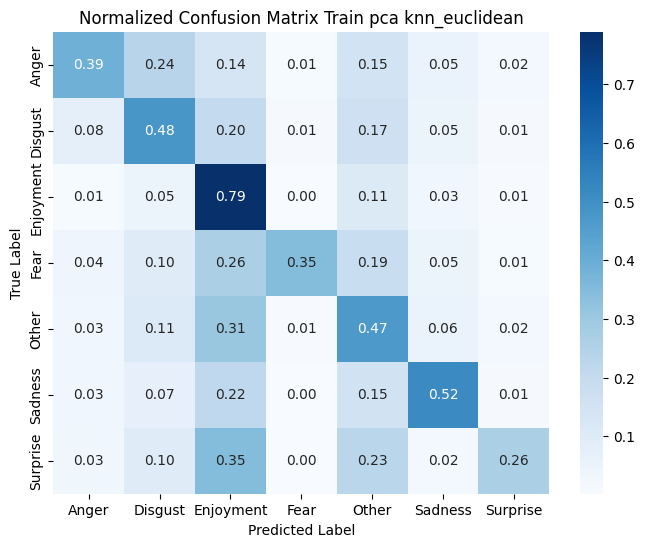

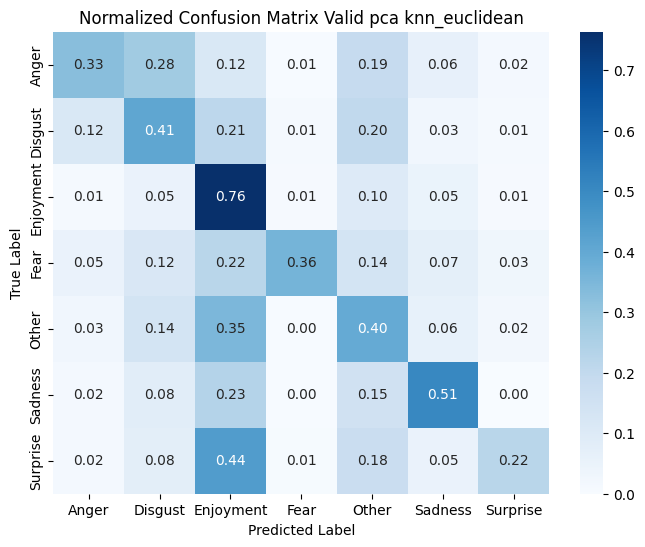

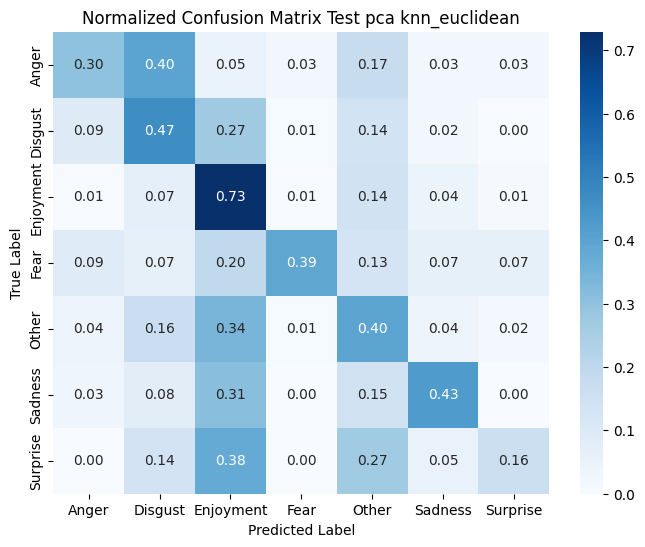

In [44]:
# KNN - euclidean - PCA
model_pca_82_knn_euclidean, train_pca_82_knn_euclidean, valid_pca_82_knn_euclidean, test_pca_82_knn_euclidean, pred_pca_82_knn_euclidean = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean = train_pca_82_knn_euclidean[1], valid_pca_82_knn_euclidean[1], test_pca_82_knn_euclidean[1]
y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean = pred_pca_82_knn_euclidean

pipeline_evaluation(
    y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean,
    y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.998000333277787
Recall: 0.998000333277787
Precision: 0.9980040529539146
F1-score: 0.9980014290383487

--- valid --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.2698201199200533
Recall: 0.2698201199200533
Precision: 0.2788445370767612
F1-score: 0.27160366554837523

--- test --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.33001350855561534
F1-score: 0.3079229052887933


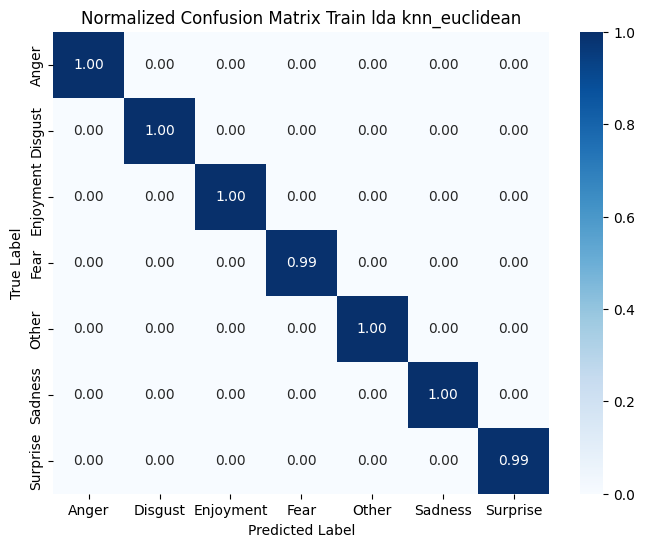

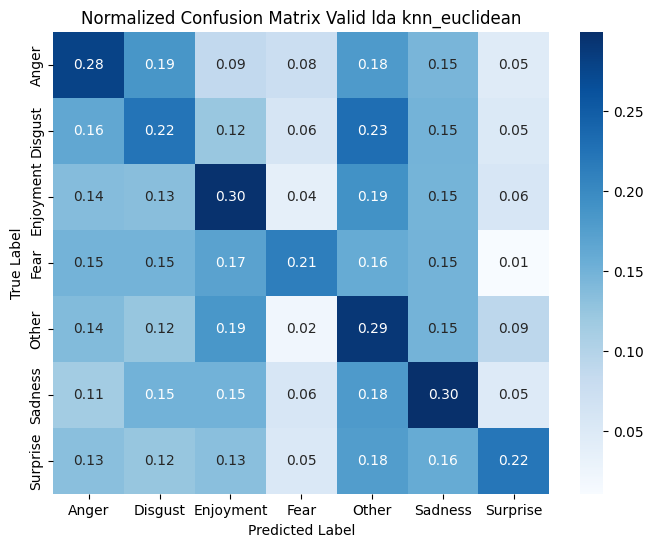

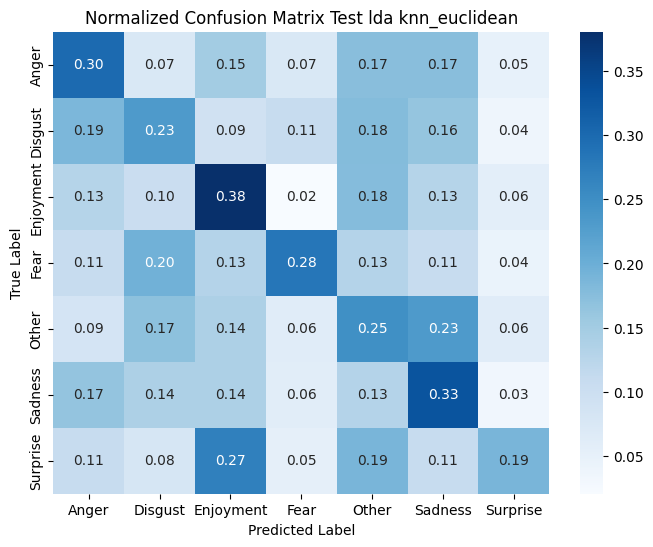

In [45]:
# KNN - euclidean - LDA
model_lda_82_knn_euclidean, train_lda_82_knn_euclidean, valid_lda_82_knn_euclidean, test_lda_82_knn_euclidean, pred_lda_82_knn_euclidean = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean = train_lda_82_knn_euclidean[1], valid_lda_82_knn_euclidean[1], test_lda_82_knn_euclidean[1]
y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean = pred_lda_82_knn_euclidean

pipeline_evaluation(
    y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean,
    y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 8:2 --- knn --- lda ---
Accuracy: 0.9975004165972338
Recall: 0.9975004165972338
Precision: 0.9975048757291939
F1-score: 0.9975011028732981

--- valid --- 8:2 --- knn --- lda ---
Accuracy: 0.27115256495669554
Recall: 0.27115256495669554
Precision: 0.27998762344725925
F1-score: 0.2727623350281462

--- test --- 8:2 --- knn --- lda ---
Accuracy: 0.2877906976744186
Recall: 0.2877906976744186
Precision: 0.3188603618440687
F1-score: 0.2976308787077604


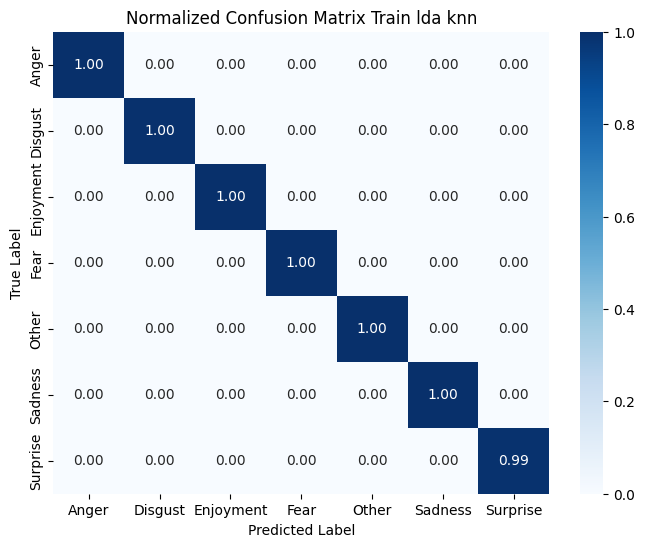

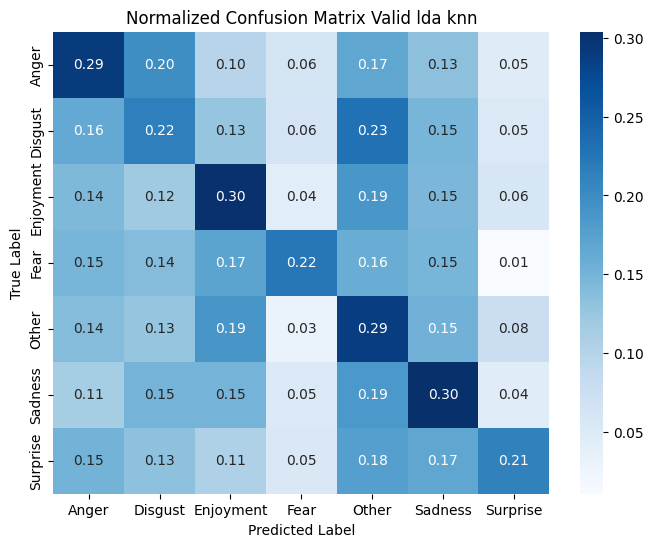

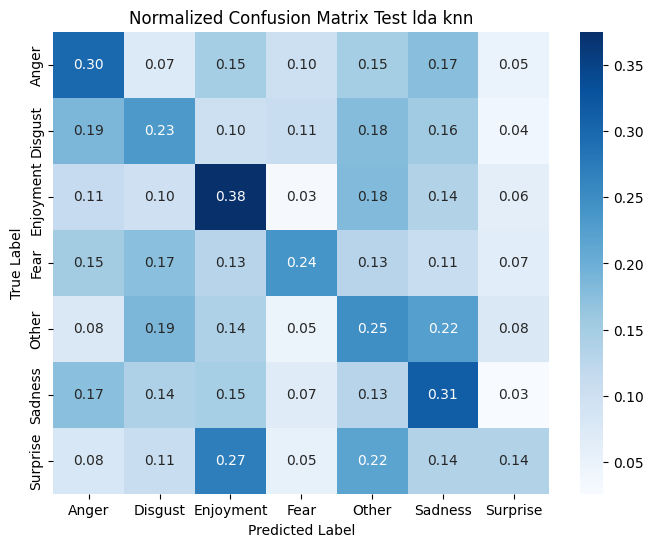

In [46]:
model_lda_82_knn, train_lda_82_knn, valid_lda_82_knn, test_lda_82_knn, pred_lda_82_knn = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    max_iter=1000
)

y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn = train_lda_82_knn[1], valid_lda_82_knn[1], test_lda_82_knn[1]
y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn = pred_lda_82_knn

pipeline_evaluation(
    y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn,
    y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- svm_linear --- none ---
Accuracy: 0.9538410264955841
Recall: 0.9538410264955841
Precision: 0.9543600432698236
F1-score: 0.9537918836910934

--- valid --- 8:2 --- svm_linear --- none ---
Accuracy: 0.536309127248501
Recall: 0.536309127248501
Precision: 0.531323902115218
F1-score: 0.5322406331317473

--- test --- 8:2 --- svm_linear --- none ---
Accuracy: 0.5450581395348837
Recall: 0.5450581395348837
Precision: 0.560979842259036
F1-score: 0.5482879715052996


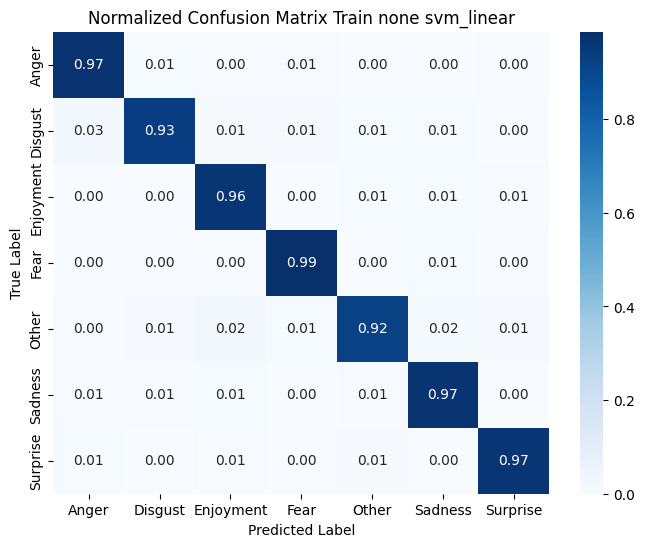

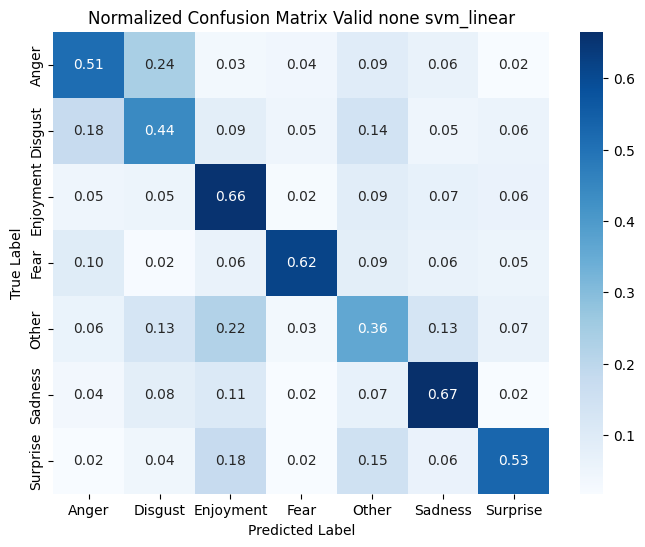

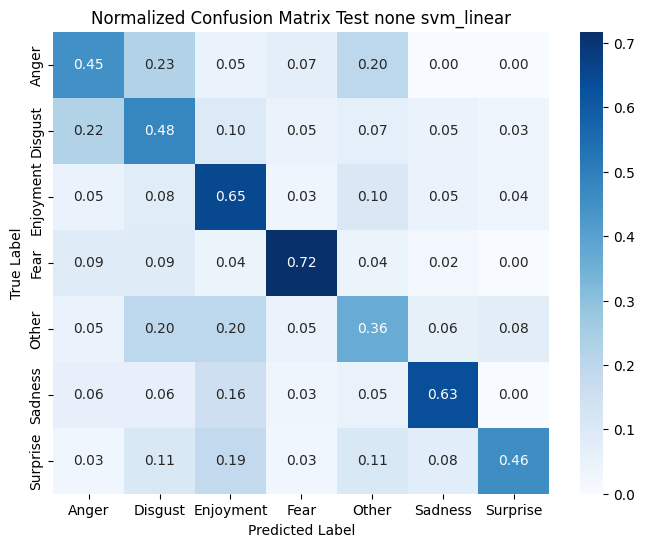

In [47]:
# SVM - linear - None (8:2)
model_82_svm_linear, train_82_svm_linear, valid_82_svm_linear, test_82_svm_linear, pred_82_svm_linear = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear = train_82_svm_linear[1], valid_82_svm_linear[1], test_82_svm_linear[1]
y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear = pred_82_svm_linear

pipeline_evaluation(
    y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear,
    y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 8:2 --- svm_poly --- none ---
Accuracy: 0.18430261623062824
Recall: 0.18430261623062824
Precision: 0.4340418004381895
F1-score: 0.10602329093687012

--- valid --- 8:2 --- svm_poly --- none ---
Accuracy: 0.1312458361092605
Recall: 0.1312458361092605
Precision: 0.2022794422799378
F1-score: 0.051572535199739984

--- test --- 8:2 --- svm_poly --- none ---
Accuracy: 0.06976744186046512
Recall: 0.06976744186046512
Precision: 0.20437989505685136
F1-score: 0.026535784259209758


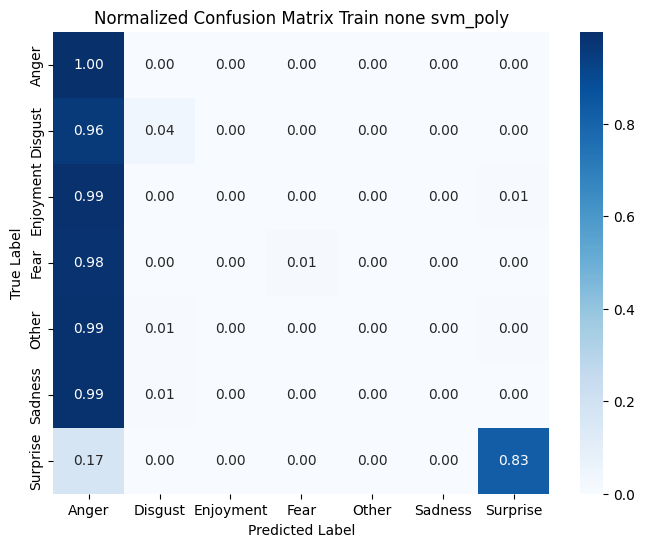

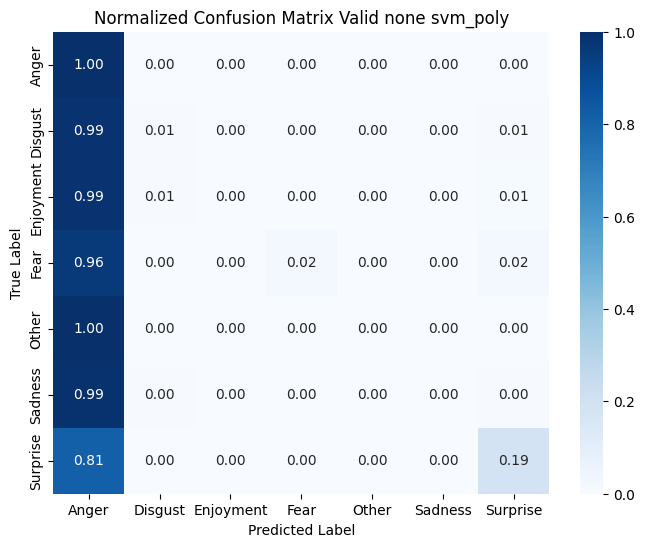

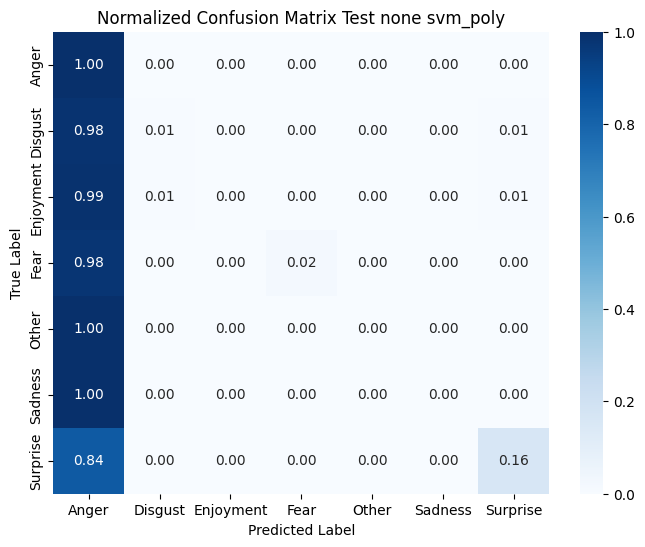

In [48]:
# SVM - poly - None (8:2)
model_82_svm_poly, train_82_svm_poly, valid_82_svm_poly, test_82_svm_poly, pred_82_svm_poly = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly = train_82_svm_poly[1], valid_82_svm_poly[1], test_82_svm_poly[1]
y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly = pred_82_svm_poly

pipeline_evaluation(
    y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly,
    y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_poly --- none ---
Accuracy: 0.9643392767872021
Recall: 0.9643392767872021
Precision: 0.9668082473292615
F1-score: 0.9640669325153968

--- valid --- 8:2 --- svm_poly --- none ---
Accuracy: 0.4330446369087275
Recall: 0.4330446369087275
Precision: 0.563591011729096
F1-score: 0.42924862511976164

--- test --- 8:2 --- svm_poly --- none ---
Accuracy: 0.40261627906976744
Recall: 0.40261627906976744
Precision: 0.5598977334853076
F1-score: 0.4001365737239996


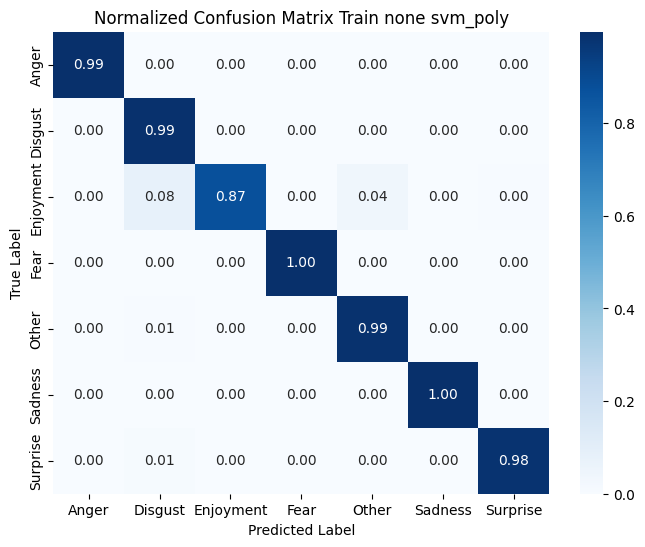

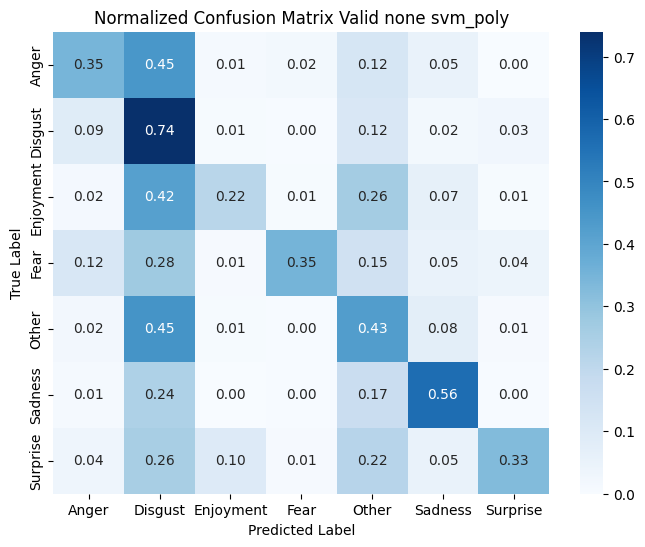

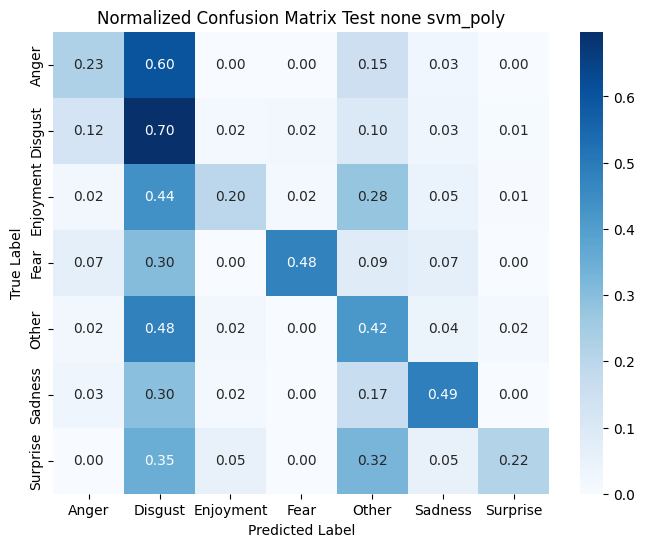

In [126]:
# SVM - poly - None (8:2)
model_82_svm_poly, train_82_svm_poly, valid_82_svm_poly, test_82_svm_poly, pred_82_svm_poly = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly = train_82_svm_poly[1], valid_82_svm_poly[1], test_82_svm_poly[1]
y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly = pred_82_svm_poly

pipeline_evaluation(
    y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly,
    y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.9615064155974005
Recall: 0.9615064155974005
Precision: 0.9625784585360772
F1-score: 0.9613652379061531

--- valid --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.5043304463690873
Recall: 0.5043304463690873
Precision: 0.5680906020989369
F1-score: 0.5126333206782422

--- test --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.4578488372093023
Recall: 0.4578488372093023
Precision: 0.5567321621312511
F1-score: 0.4663537924728788


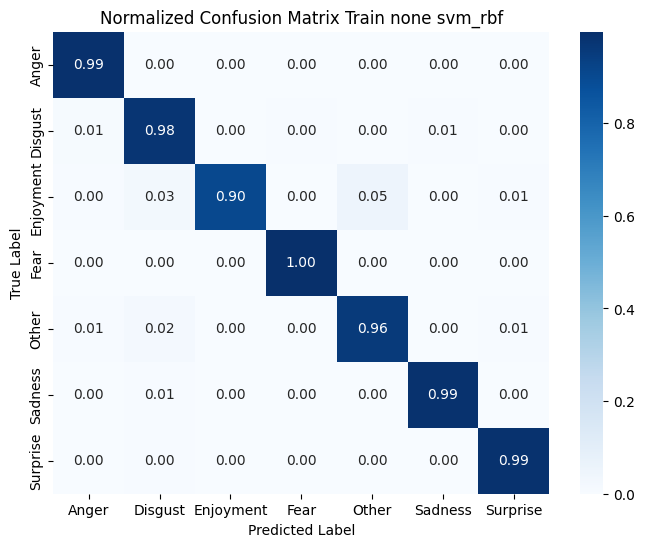

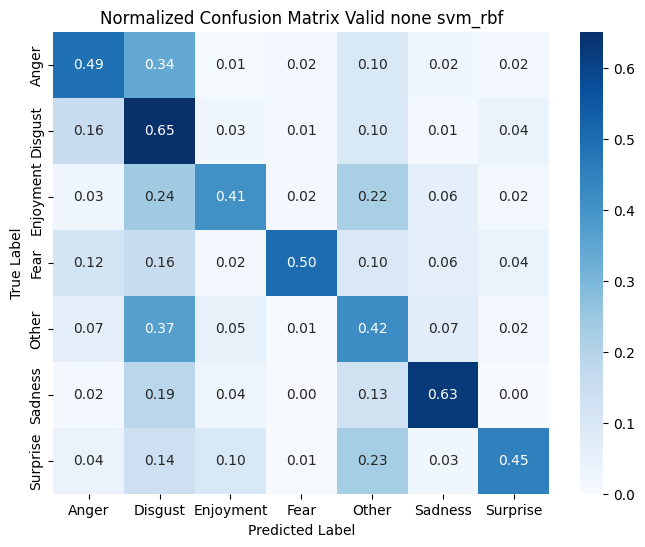

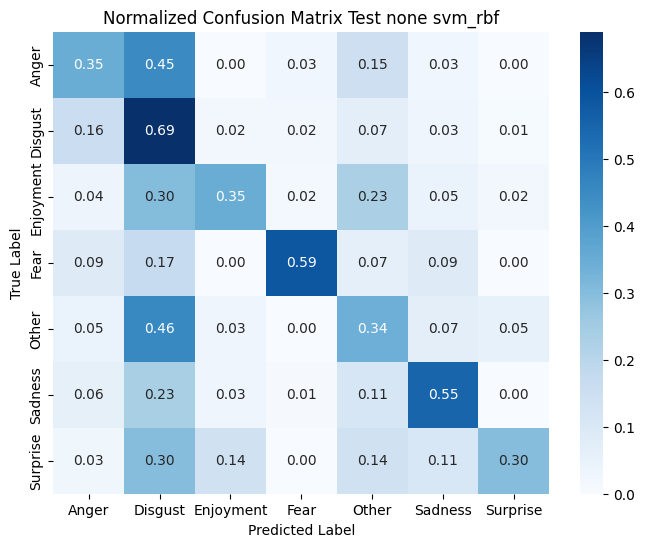

In [49]:
# SVM - rbf - None (8:2)
model_82_svm_rbf, train_82_svm_rbf, valid_82_svm_rbf, test_82_svm_rbf, pred_82_svm_rbf = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf = train_82_svm_rbf[1], valid_82_svm_rbf[1], test_82_svm_rbf[1]
y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf = pred_82_svm_rbf

pipeline_evaluation(
    y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf,
    y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.882019663389435
Recall: 0.882019663389435
Precision: 0.8833194840693642
F1-score: 0.8816149967592086

--- valid --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.5403064623584277
Recall: 0.5403064623584277
Precision: 0.5342186336612705
F1-score: 0.5350491365545577

--- test --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.5363372093023255
Recall: 0.5363372093023255
Precision: 0.5501133284802044
F1-score: 0.5388284655063191


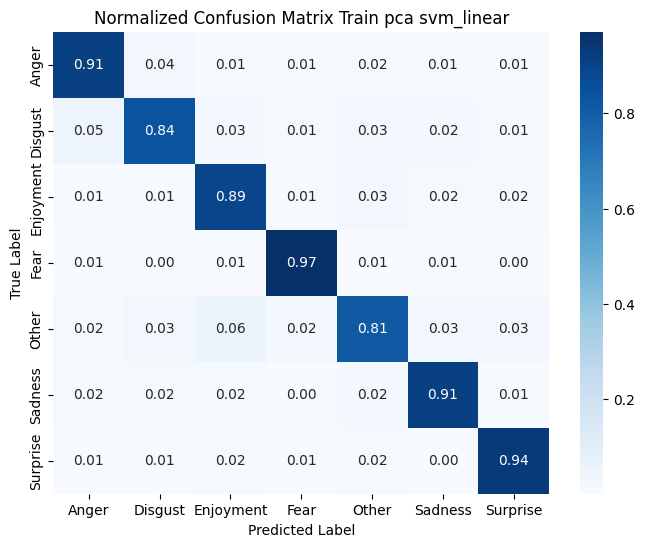

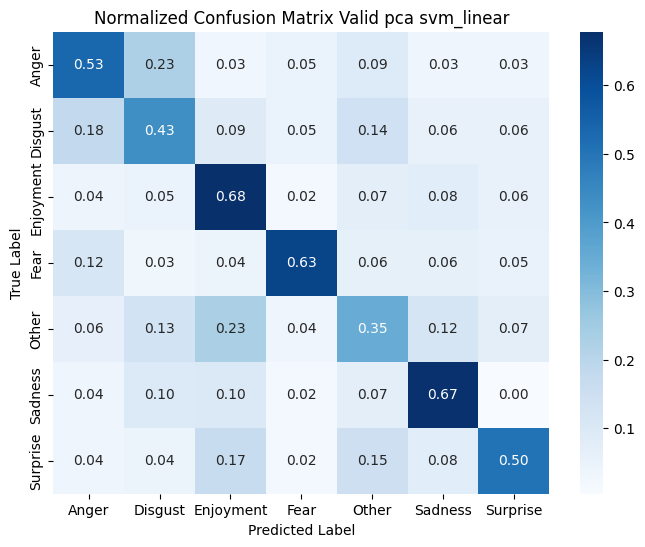

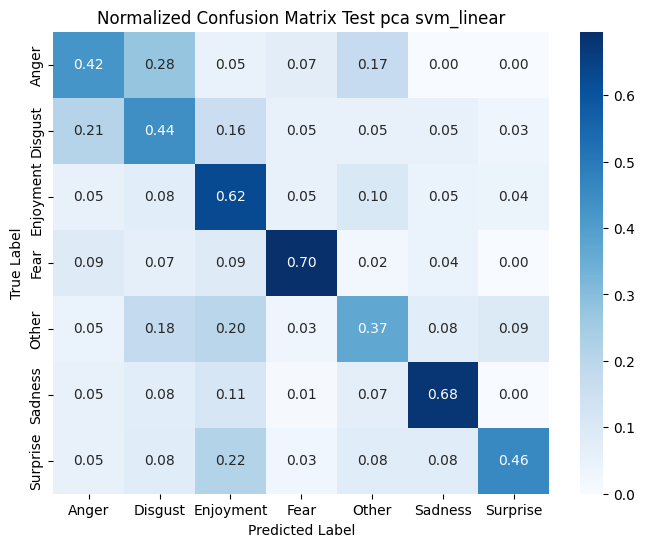

In [50]:
# SVM - linear - PCA (8:2)
model_pca_82_svm_linear, train_pca_82_svm_linear, valid_pca_82_svm_linear, test_pca_82_svm_linear, pred_pca_82_svm_linear = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear = train_pca_82_svm_linear[1], valid_pca_82_svm_linear[1], test_pca_82_svm_linear[1]
y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear = pred_pca_82_svm_linear

pipeline_evaluation(
    y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear,
    y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.16797200466588902
Recall: 0.16797200466588902
Precision: 0.1500195570872617
F1-score: 0.08810657401942946

--- valid --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.12724850099933377
Recall: 0.12724850099933377
Precision: 0.13934750117716854
F1-score: 0.04600003099301589

--- test --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.06395348837209303
Recall: 0.06395348837209303
Precision: 0.12403950768393854
F1-score: 0.017336244638478295


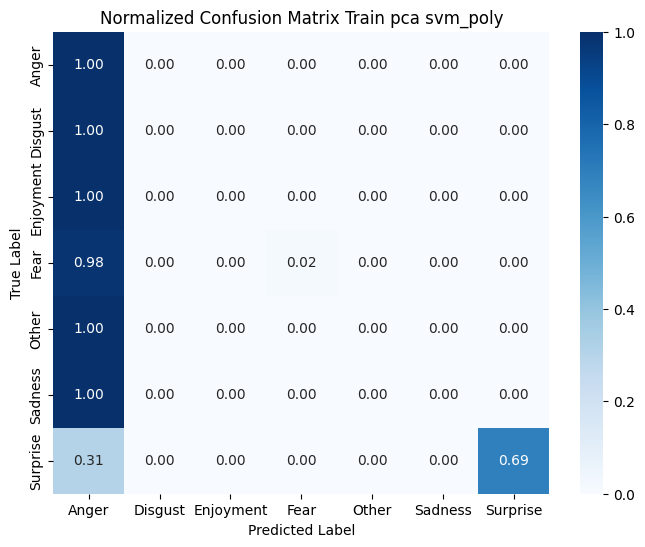

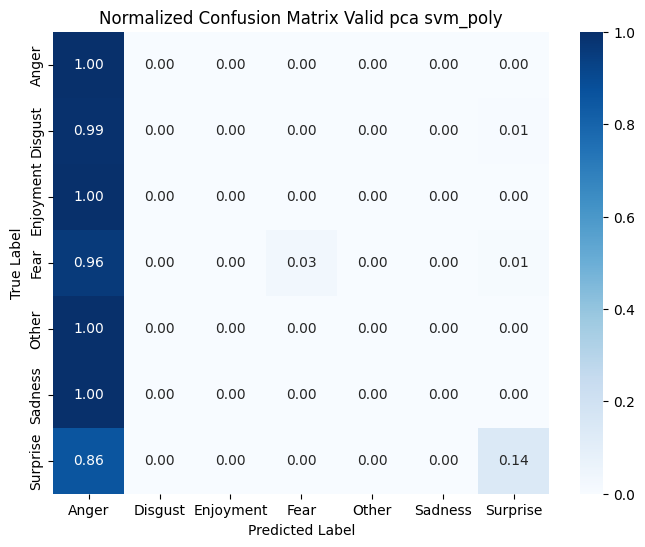

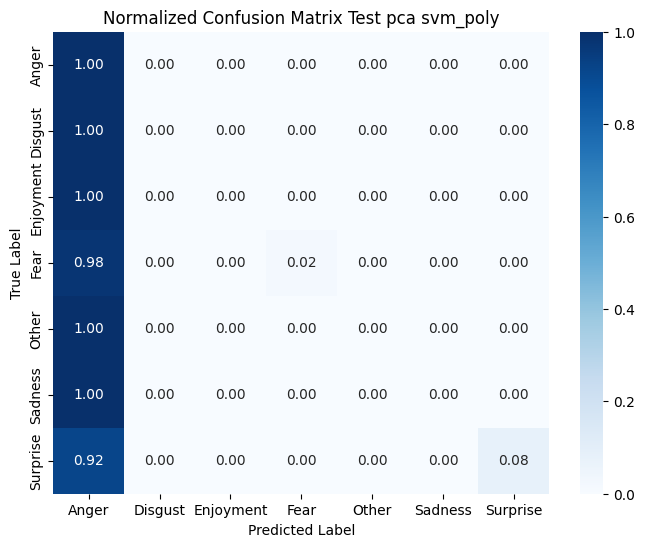

In [51]:
# SVM - poly - PCA (8:2)
model_pca_82_svm_poly, train_pca_82_svm_poly, valid_pca_82_svm_poly, test_pca_82_svm_poly, pred_pca_82_svm_poly = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly = train_pca_82_svm_poly[1], valid_pca_82_svm_poly[1], test_pca_82_svm_poly[1]
y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly = pred_pca_82_svm_poly

pipeline_evaluation(
    y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly,
    y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.9405099150141643
Recall: 0.9405099150141643
Precision: 0.9428546015221339
F1-score: 0.9402178971309211

--- valid --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.5103264490339774
Recall: 0.5103264490339774
Precision: 0.5452657111346862
F1-score: 0.5153252781140766

--- test --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.47238372093023256
Recall: 0.47238372093023256
Precision: 0.539182568204487
F1-score: 0.47874211132189526


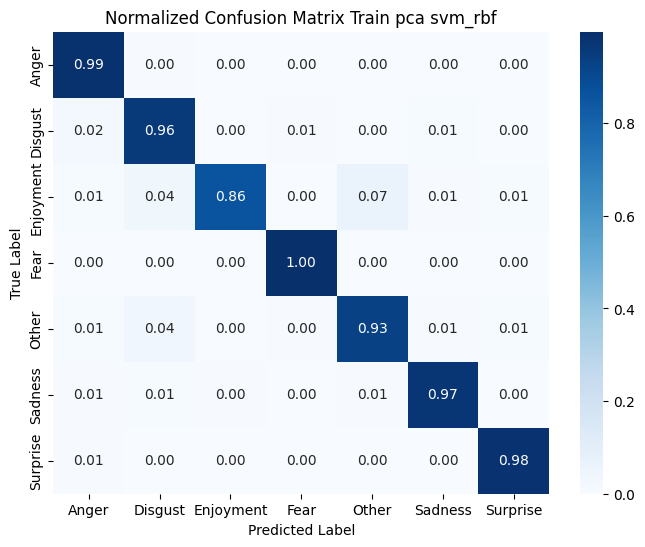

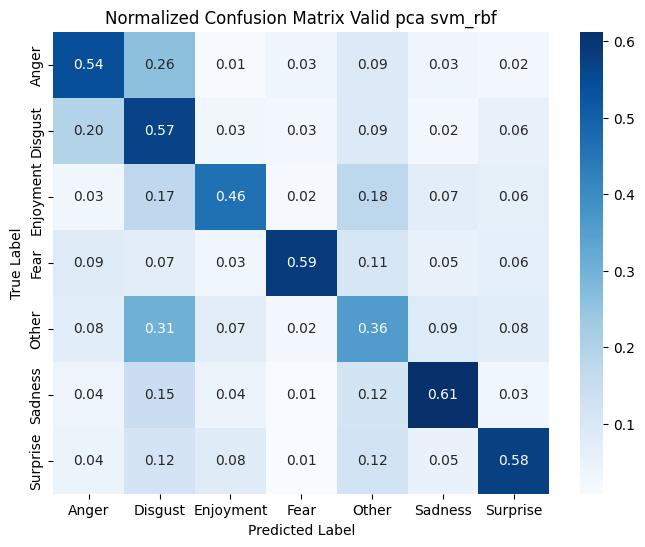

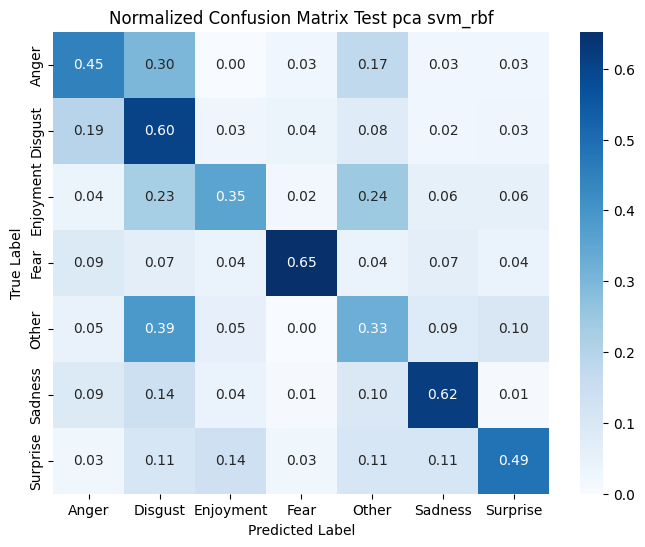

In [52]:
# SVM - rbf - PCA (8:2)
model_pca_82_svm_rbf, train_pca_82_svm_rbf, valid_pca_82_svm_rbf, test_pca_82_svm_rbf, pred_pca_82_svm_rbf = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf = train_pca_82_svm_rbf[1], valid_pca_82_svm_rbf[1], test_pca_82_svm_rbf[1]
y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf = pred_pca_82_svm_rbf

pipeline_evaluation(
    y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf,
    y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.998000333277787
Recall: 0.998000333277787
Precision: 0.9980097121892781
F1-score: 0.9980025494621766

--- valid --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.25716189207195206
Recall: 0.25716189207195206
Precision: 0.2717707526210099
F1-score: 0.25752687452423767

--- test --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.2877906976744186
Recall: 0.2877906976744186
Precision: 0.33412692027420265
F1-score: 0.299515000427014


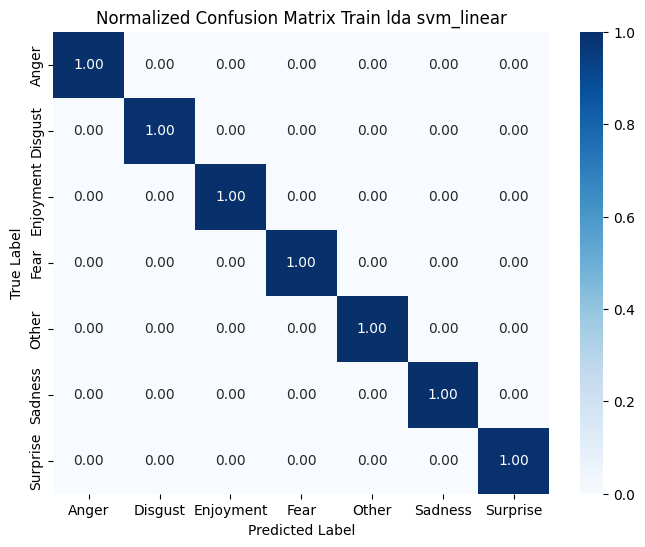

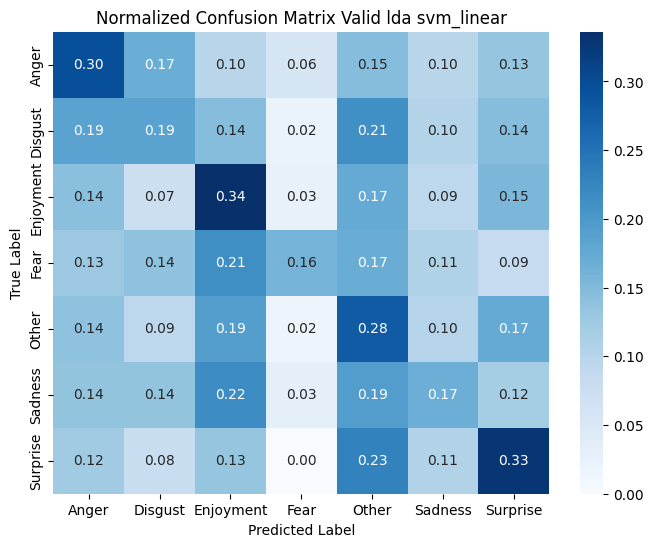

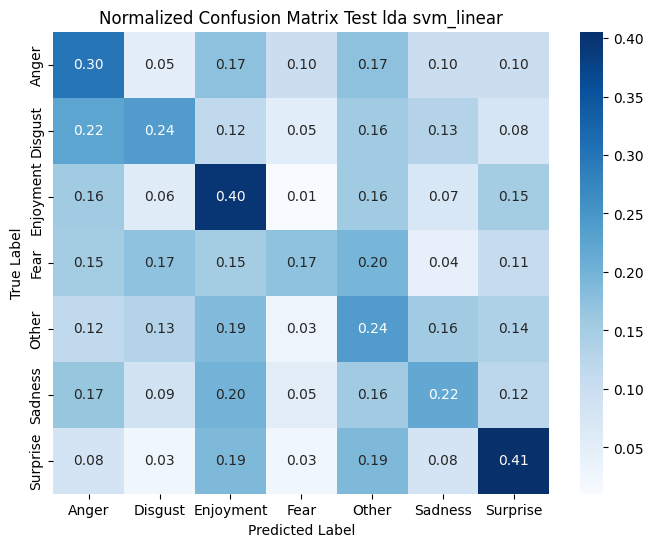

In [53]:
# SVM - linear - LDA (8:2)
model_lda_82_svm_linear, train_lda_82_svm_linear, valid_lda_82_svm_linear, test_lda_82_svm_linear, pred_lda_82_svm_linear = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear = train_lda_82_svm_linear[1], valid_lda_82_svm_linear[1], test_lda_82_svm_linear[1]
y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear = pred_lda_82_svm_linear

pipeline_evaluation(
    y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear,
    y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.9958340276620563
Recall: 0.9958340276620563
Precision: 0.9960042286882963
F1-score: 0.995876777836344

--- valid --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.21585609593604263
Recall: 0.21585609593604263
Precision: 0.22652540576964303
F1-score: 0.21238851335839687

--- test --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.20348837209302326
Recall: 0.20348837209302326
Precision: 0.269785669947183
F1-score: 0.2159203815531906


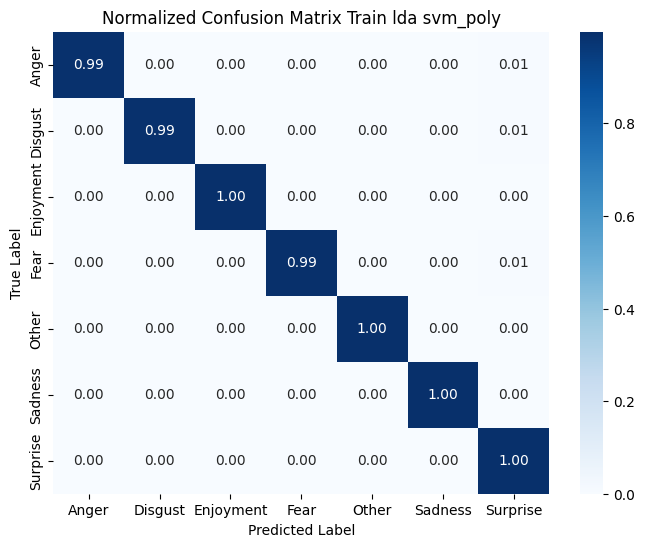

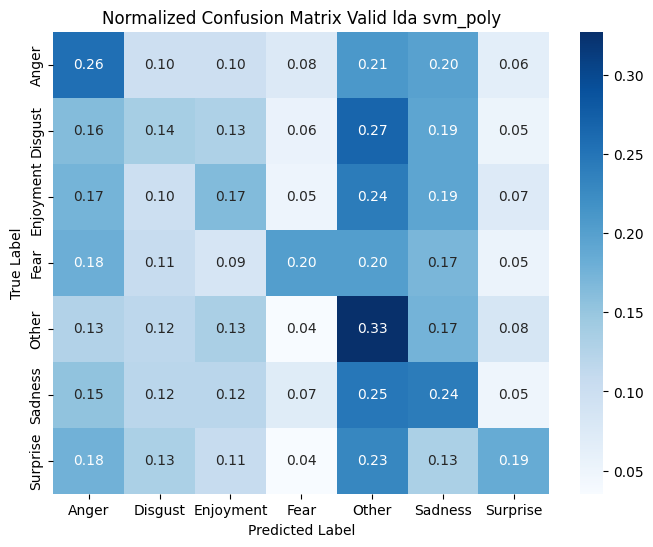

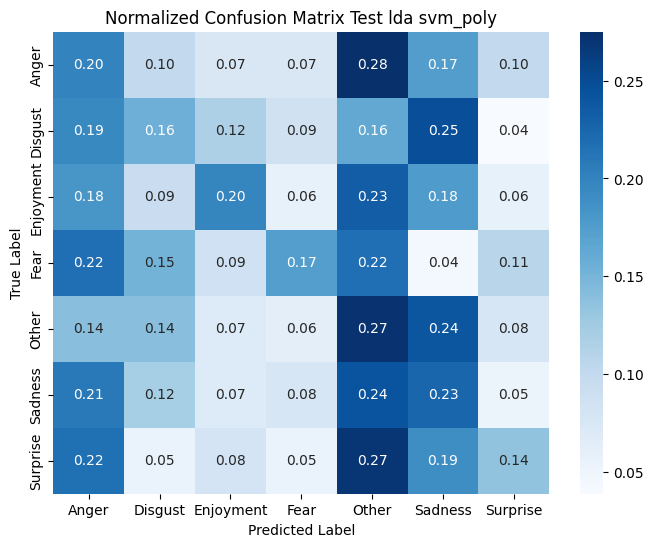

In [54]:
# SVM - poly - LDA (8:2)
model_lda_82_svm_poly, train_lda_82_svm_poly, valid_lda_82_svm_poly, test_lda_82_svm_poly, pred_lda_82_svm_poly = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly = train_lda_82_svm_poly[1], valid_lda_82_svm_poly[1], test_lda_82_svm_poly[1]
y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly = pred_lda_82_svm_poly

pipeline_evaluation(
    y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly,
    y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

--- train --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.9968338610231628
Recall: 0.9968338610231628
Precision: 0.9969025823069613
F1-score: 0.9968515348179114

--- valid --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.20986009327115257
Recall: 0.20986009327115257
Precision: 0.22676535319868468
F1-score: 0.2040611862678628

--- test --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.19040697674418605
Recall: 0.19040697674418605
Precision: 0.25548805804125546
F1-score: 0.19726152344044384


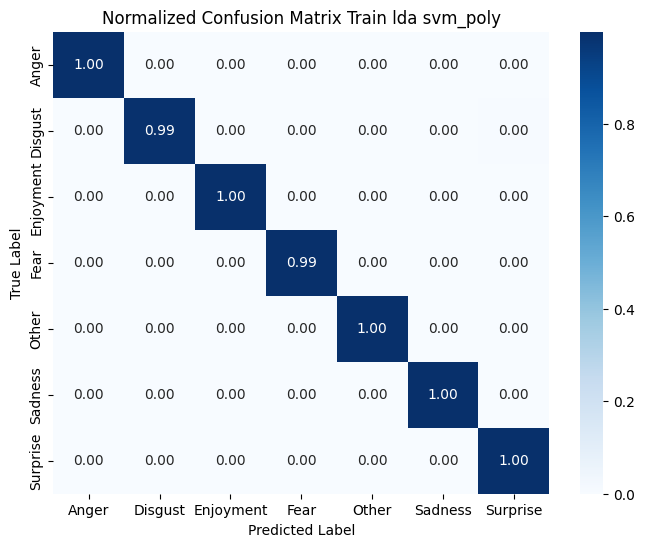

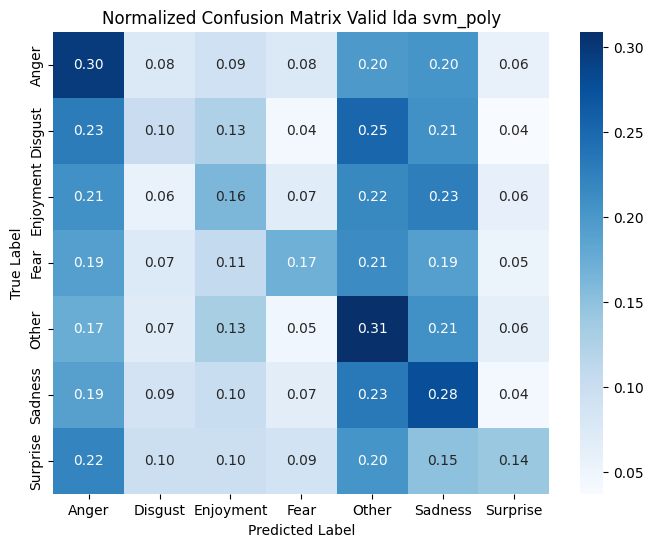

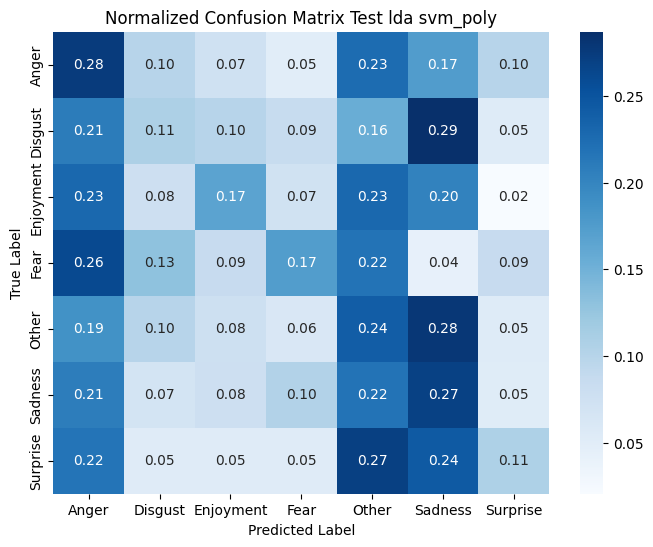

In [127]:
# SVM - poly - LDA (8:2)
model_lda_82_svm_poly, train_lda_82_svm_poly, valid_lda_82_svm_poly, test_lda_82_svm_poly, pred_lda_82_svm_poly = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly = train_lda_82_svm_poly[1], valid_lda_82_svm_poly[1], test_lda_82_svm_poly[1]
y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly = pred_lda_82_svm_poly

pipeline_evaluation(
    y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly,
    y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.9983336110648225
Recall: 0.9983336110648225
Precision: 0.9983458444665196
F1-score: 0.998336088180915

--- valid --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.07861425716189208
Recall: 0.07861425716189208
Precision: 0.416706790248787
F1-score: 0.018397838209864688

--- test --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.055232558139534885
Recall: 0.055232558139534885
Precision: 0.08647620177639162
F1-score: 0.008361643288787938


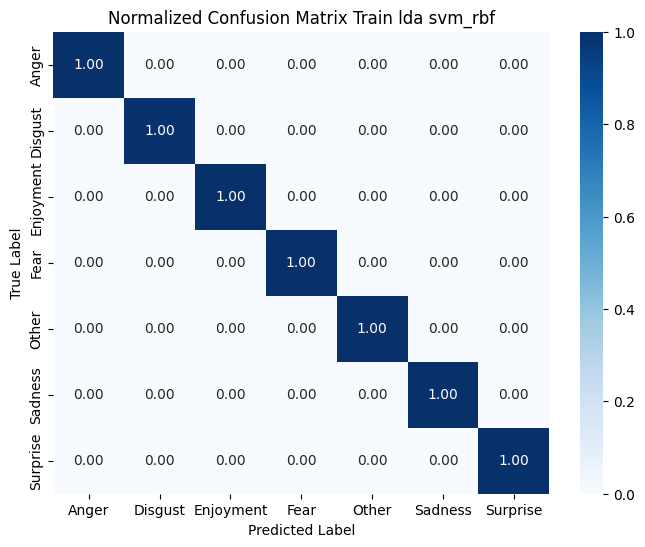

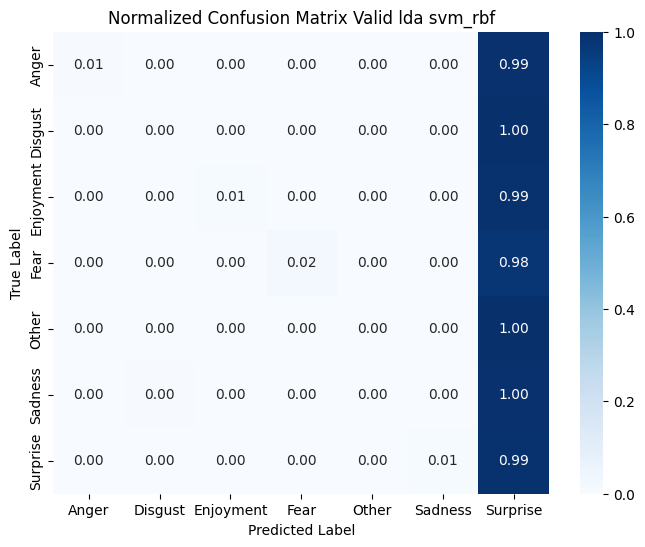

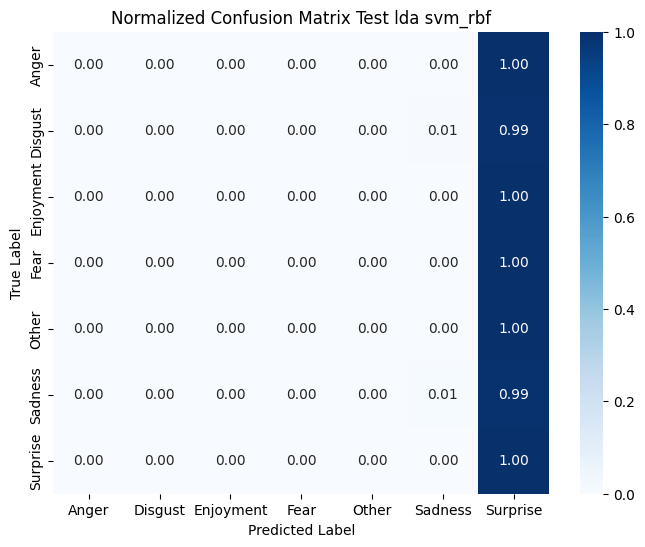

In [55]:
# SVM - rbf - LDA (8:2)
model_lda_82_svm_rbf, train_lda_82_svm_rbf, valid_lda_82_svm_rbf, test_lda_82_svm_rbf, pred_lda_82_svm_rbf = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf = train_lda_82_svm_rbf[1], valid_lda_82_svm_rbf[1], test_lda_82_svm_rbf[1]
y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf = pred_lda_82_svm_rbf

pipeline_evaluation(
    y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf,
    y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 7:3

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [56]:
X_train_73, X_valid_73, X_test_73, y_train_73, y_valid_73, y_test_73, tfidf_vec_73, disc_model_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (5251, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 71750


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.8352694724814321
Recall: 0.8352694724814321
Precision: 0.8390976996387467
F1-score: 0.8347546201066588

--- valid --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.541981341625944
Recall: 0.541981341625944
Precision: 0.5425490980538008
F1-score: 0.5403820051931725

--- test --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.5232558139534884
Recall: 0.5232558139534884
Precision: 0.5519331651081403
F1-score: 0.5315919673730781


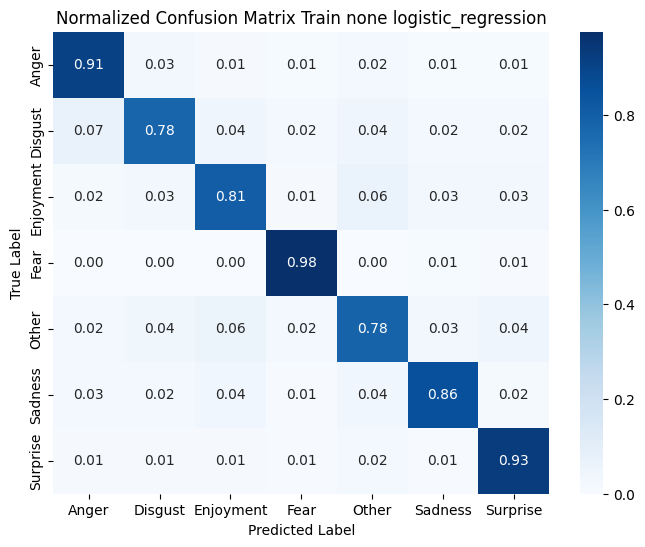

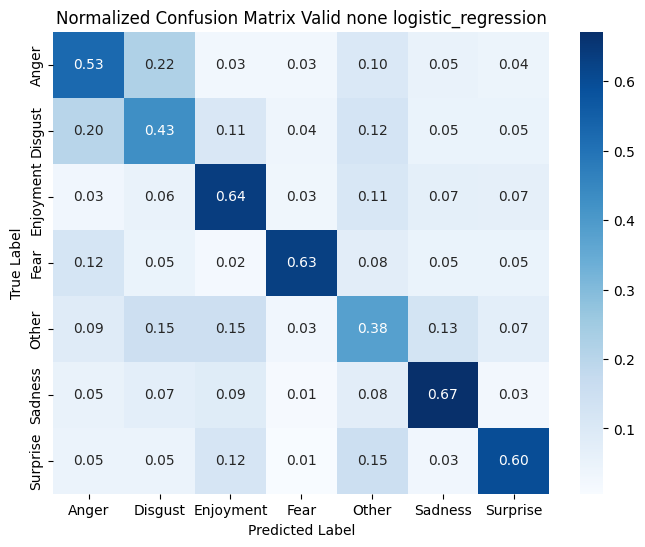

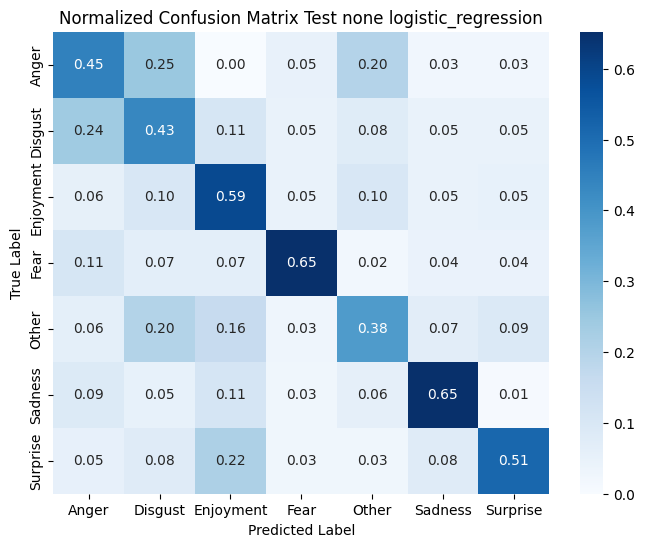

In [57]:
model_73, train_73, valid_73, test_73, pred_73 = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_73, y_pred_valid_73, y_pred_test_73 = pred_73

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73, y_pred_valid_73, y_pred_test_73,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (5251, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 71750


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.7931822509998095
Recall: 0.7931822509998095
Precision: 0.7986874147241027
F1-score: 0.7925771952106703

--- valid --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5393158596179476
Recall: 0.5393158596179476
Precision: 0.5414401420615089
F1-score: 0.5378939591499556

--- test --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5159883720930233
Recall: 0.5159883720930233
Precision: 0.5444184851854815
F1-score: 0.5246223040828129


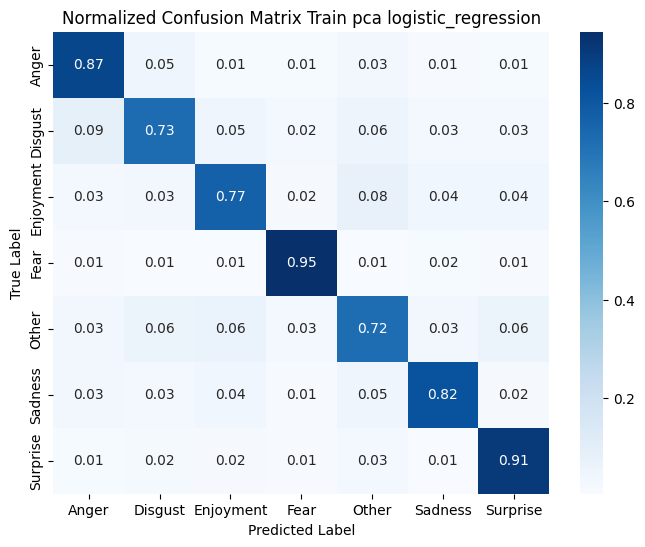

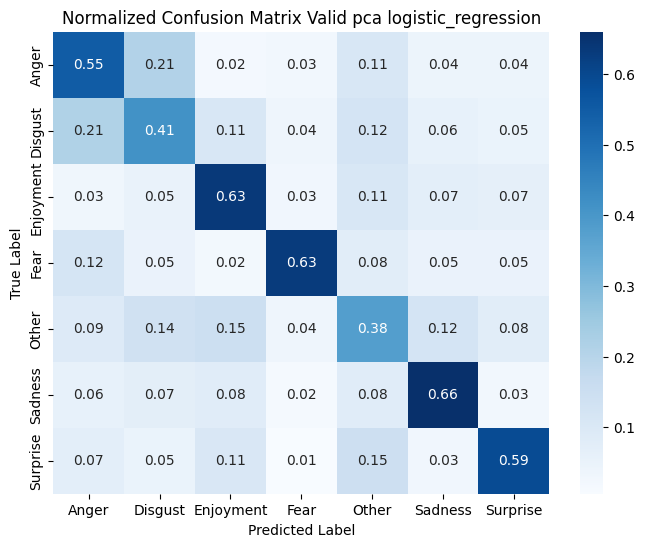

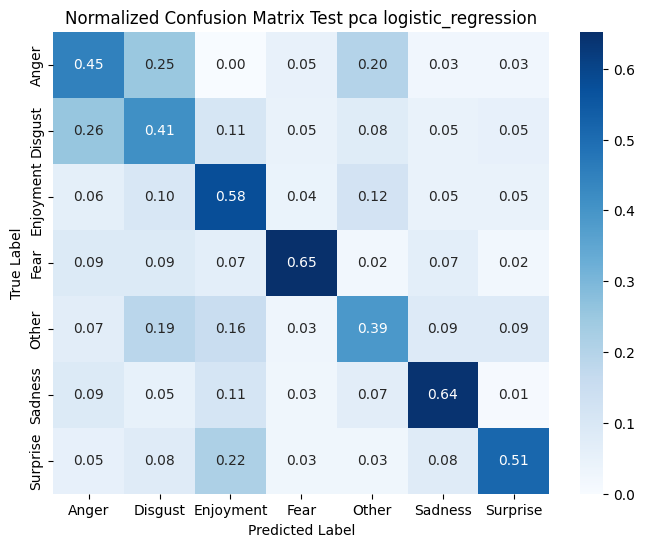

In [58]:
X_train_pca_73, X_valid_pca_73, X_test_pca_73, y_train_pca_73, y_valid_pca_73, y_test_pca_73, tfidf_vec_pca_73, disc_model_pca_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="pca"
)

model_pca_73, train_pca_73, valid_pca_73, test_pca_73, pred_pca_73 = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73 = pred_pca_73

pipeline_evaluation(
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (5251, 8000) (số câu x số từ vựng)
Số từ vựng: 8000
TF-IDF - Non-zero values: 71750


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.9984764806703486
Recall: 0.9984764806703486
Precision: 0.9984874471507869
F1-score: 0.9984791677261505

--- valid --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.29542425588627275
Recall: 0.29542425588627275
Precision: 0.299398327839453
F1-score: 0.2942838334990708

--- test --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.27761627906976744
Recall: 0.27761627906976744
Precision: 0.3044857212940064
F1-score: 0.2859948693738321


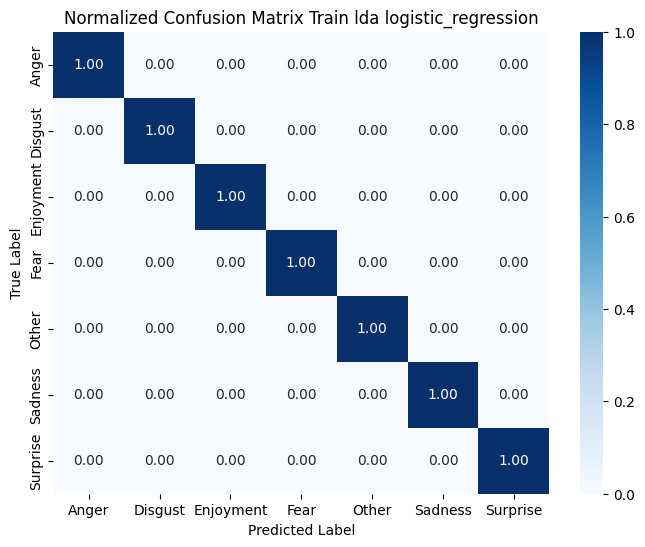

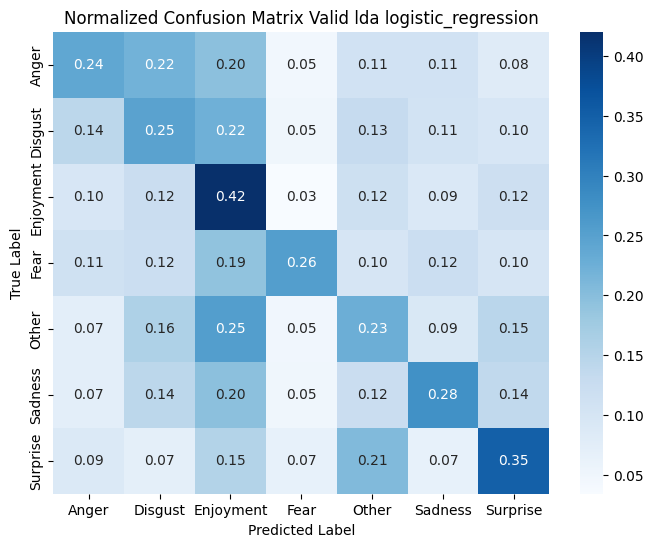

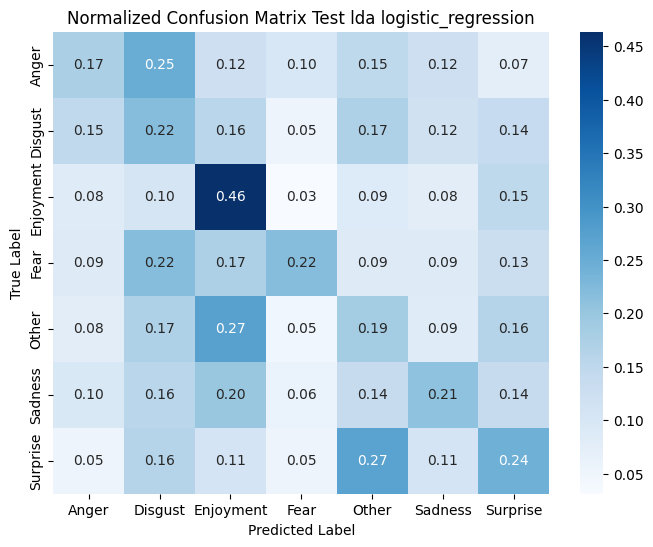

In [59]:
X_train_lda_73, X_valid_lda_73, X_test_lda_73, y_train_lda_73, y_valid_lda_73, y_test_lda_73, tfidf_vec_lda_73, disc_model_lda_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="lda"
)

model_lda_73, train_lda_73, valid_lda_73, test_lda_73, pred_lda_73 = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73 = pred_lda_73

pipeline_evaluation(
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

--- train --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.5002856598743096
Recall: 0.5002856598743096
Precision: 0.5364446235690667
F1-score: 0.4911020910297494

--- valid --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.46557085739671256
Recall: 0.46557085739671256
Precision: 0.49546421161167353
F1-score: 0.45273890593174715

--- test --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.45348837209302323
Recall: 0.45348837209302323
Precision: 0.4791193380128972
F1-score: 0.4433624418587977


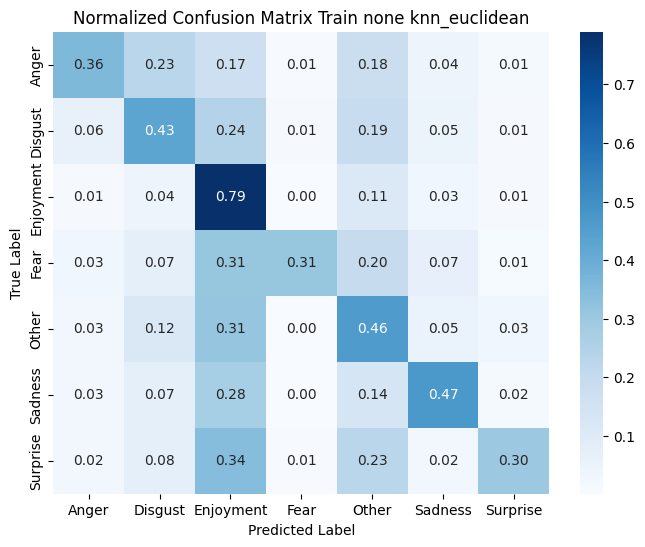

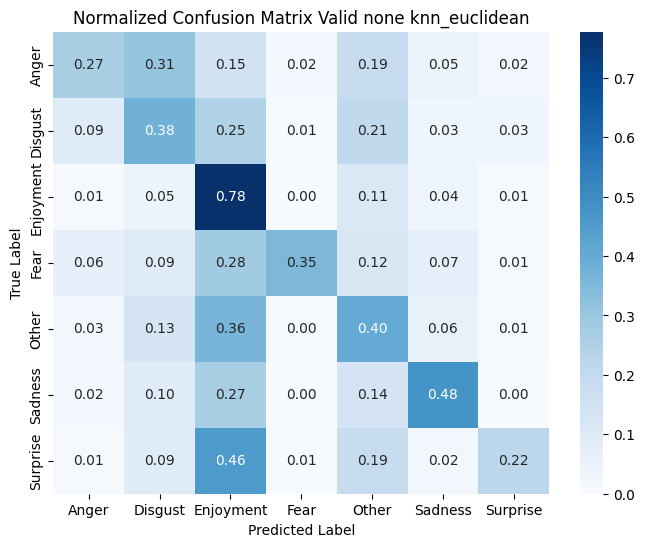

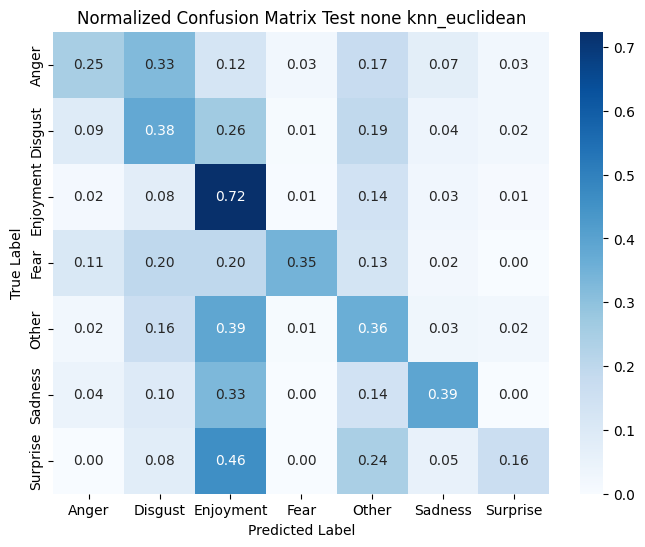

In [60]:
# KNN - euclidean - None (7:3)
model_73_knn_euclidean, train_73_knn_euclidean, valid_73_knn_euclidean, test_73_knn_euclidean, pred_73_knn_euclidean = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn",
    metric="euclidean"
)

y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean = pred_73_knn_euclidean

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- none ---
Accuracy: 0.4959055418015616
Recall: 0.4959055418015616
Precision: 0.5297421665572911
F1-score: 0.4808056516413201

--- valid --- 7:3 --- knn --- none ---
Accuracy: 0.46512661039537984
Recall: 0.46512661039537984
Precision: 0.4970135818589843
F1-score: 0.4461453395036202

--- test --- 7:3 --- knn --- none ---
Accuracy: 0.4563953488372093
Recall: 0.4563953488372093
Precision: 0.4776528942522176
F1-score: 0.4420550515522627


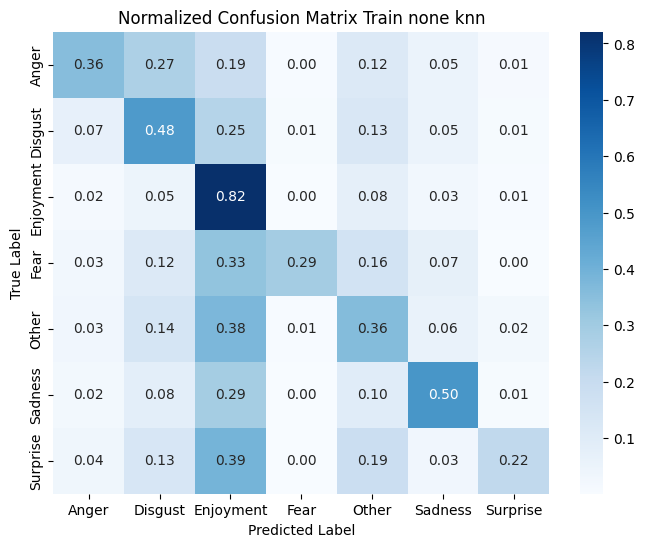

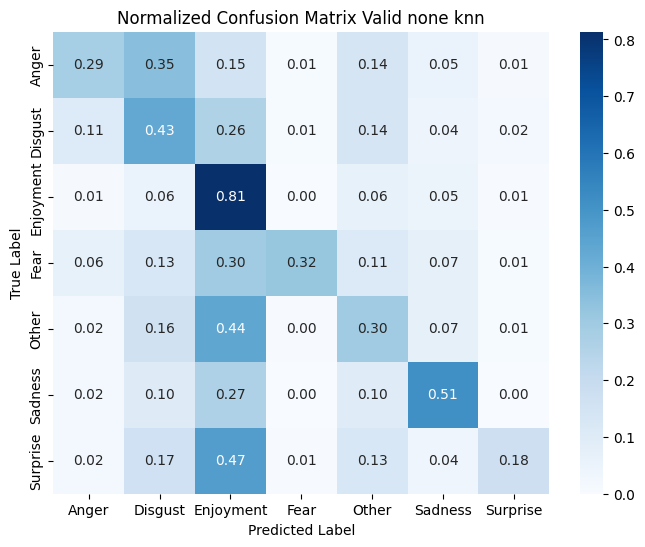

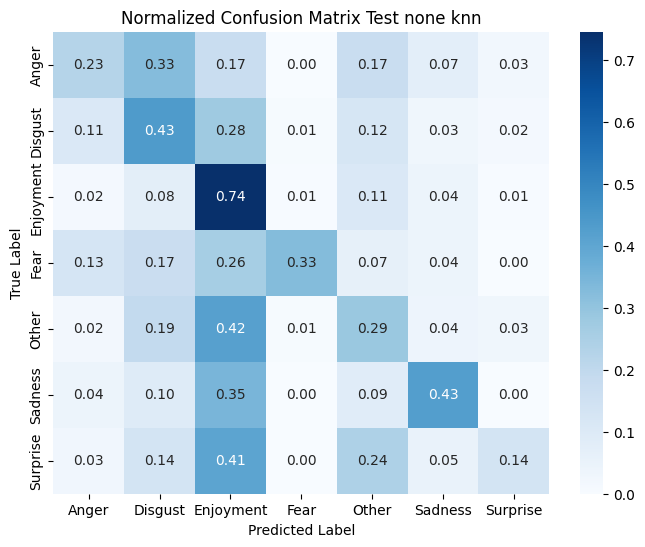

In [61]:
# KNN - cosine - none
model_73_knn, train_73_knn, valid_73_knn, test_73_knn, pred_73_knn = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn"
)

y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn = pred_73_knn

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.5010474195391355
Recall: 0.5010474195391355
Precision: 0.5382101754854406
F1-score: 0.4906062563476072

--- valid --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.46868058640604177
Recall: 0.46868058640604177
Precision: 0.5005337719136193
F1-score: 0.45646300196503403

--- test --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.45494186046511625
Recall: 0.45494186046511625
Precision: 0.48291324608982633
F1-score: 0.44601433031351795


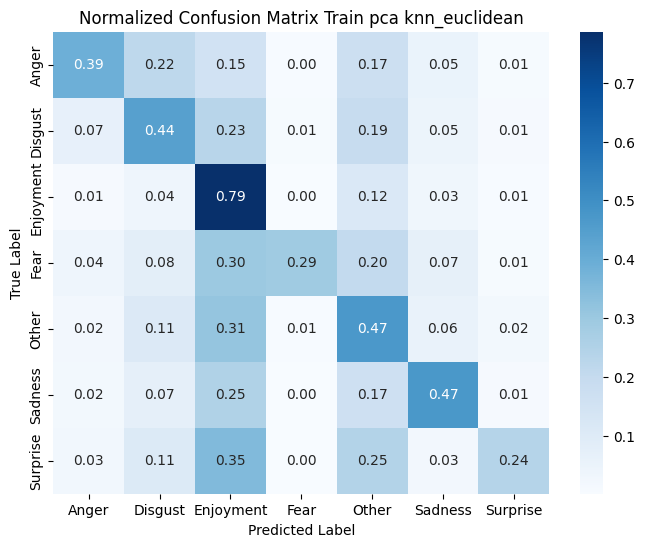

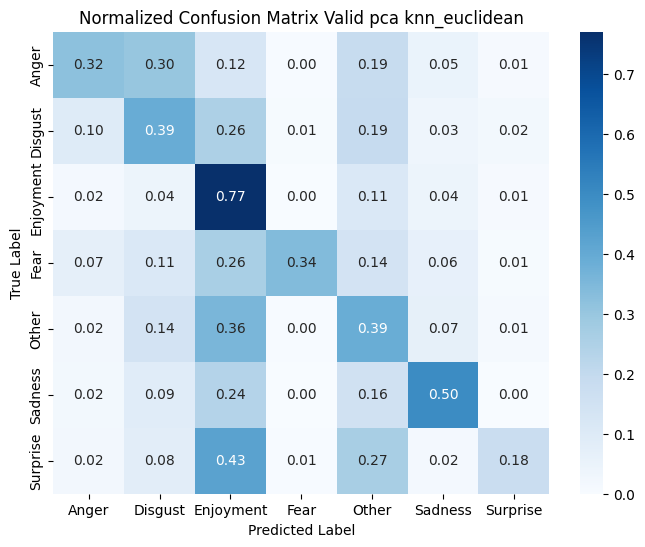

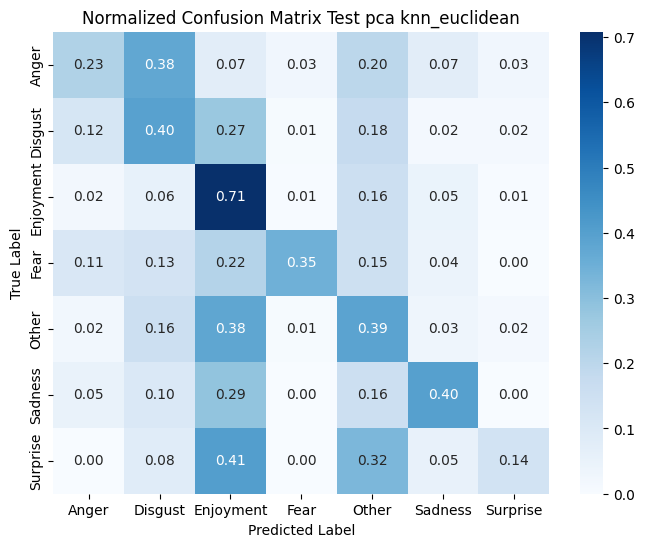

In [62]:
# KNN - euclidean - PCA (7:3)
model_pca_73_knn_euclidean, train_pca_73_knn_euclidean, valid_pca_73_knn_euclidean, test_pca_73_knn_euclidean, pred_pca_73_knn_euclidean = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean = train_pca_73_knn_euclidean[1], valid_pca_73_knn_euclidean[1], test_pca_73_knn_euclidean[1]
y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean = pred_pca_73_knn_euclidean

pipeline_evaluation(
    y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean,
    y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- pca ---
Accuracy: 0.5010474195391355
Recall: 0.5010474195391355
Precision: 0.5360257927351034
F1-score: 0.4871165830455433

--- valid --- 7:3 --- knn --- pca ---
Accuracy: 0.4726788094180364
Recall: 0.4726788094180364
Precision: 0.503573975602449
F1-score: 0.4564783104113198

--- test --- 7:3 --- knn --- pca ---
Accuracy: 0.45930232558139533
Recall: 0.45930232558139533
Precision: 0.48045150562127437
F1-score: 0.44389887767304004


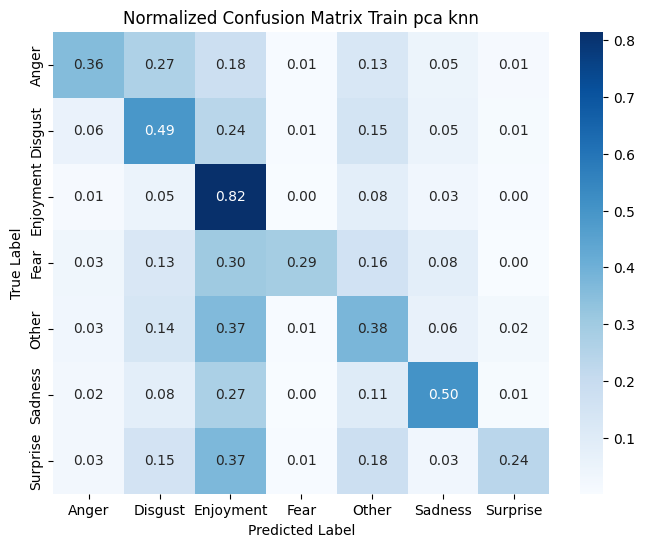

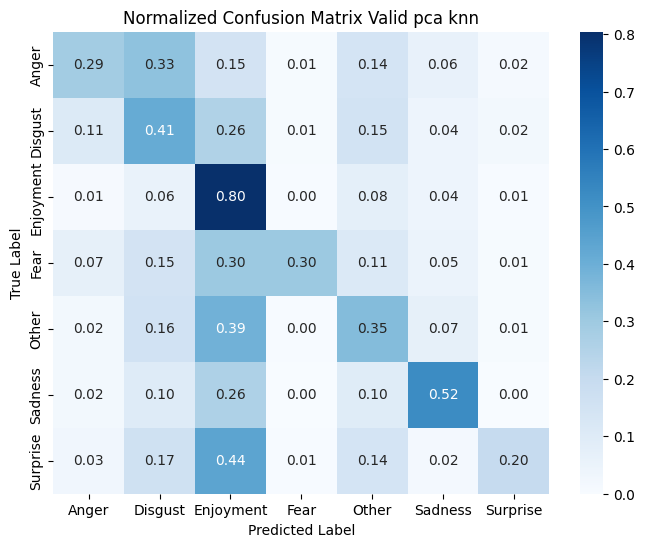

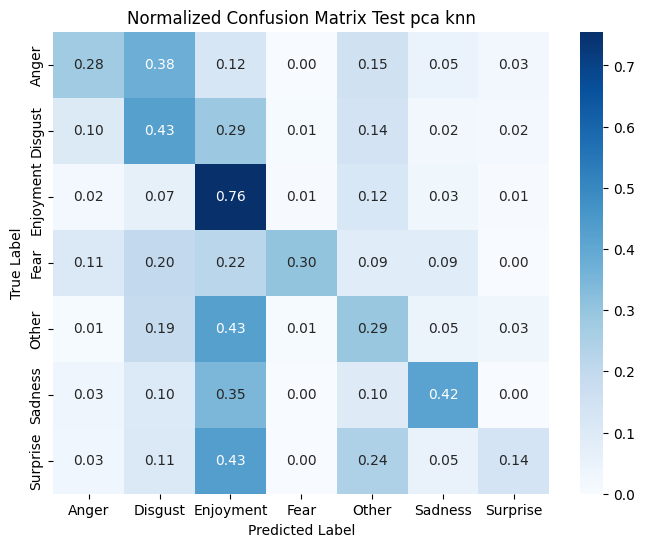

In [63]:
model_pca_73_knn, train_pca_73_knn, valid_pca_73_knn, test_pca_73_knn, pred_pca_73_knn = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    max_iter=1000
)

y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn = train_pca_73_knn[1], valid_pca_73_knn[1], test_pca_73_knn[1]
y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn = pred_pca_73_knn

pipeline_evaluation(
    y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn,
    y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.9984764806703486
Recall: 0.9984764806703486
Precision: 0.9984803044137595
F1-score: 0.9984774227948812

--- valid --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.29720124389160374
Recall: 0.29720124389160374
Precision: 0.30450466877696986
F1-score: 0.2979874901918868

--- test --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.29651162790697677
Recall: 0.29651162790697677
Precision: 0.32644149352384355
F1-score: 0.30607857450334314


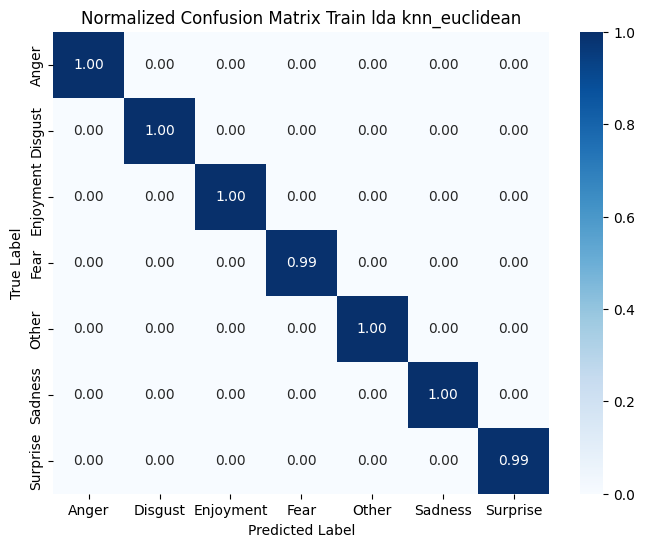

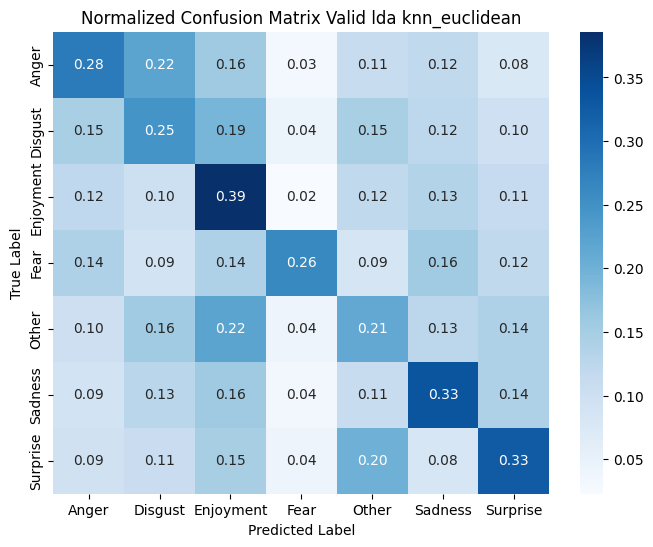

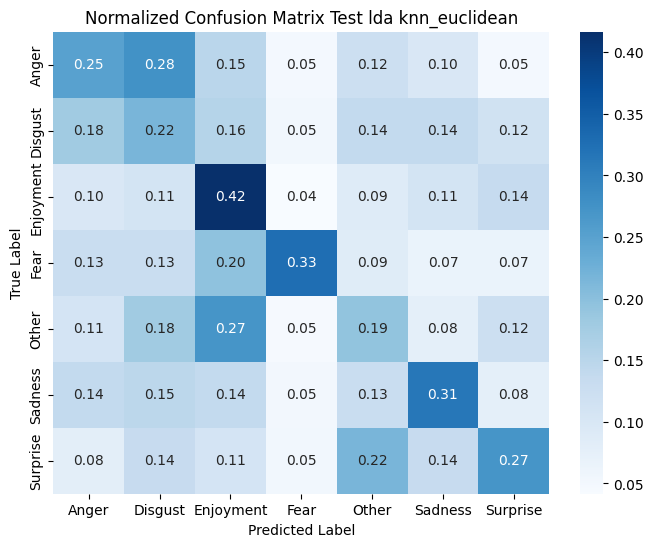

In [64]:
# KNN - euclidean - LDA (7:3)
model_lda_73_knn_euclidean, train_lda_73_knn_euclidean, valid_lda_73_knn_euclidean, test_lda_73_knn_euclidean, pred_lda_73_knn_euclidean = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean = train_lda_73_knn_euclidean[1], valid_lda_73_knn_euclidean[1], test_lda_73_knn_euclidean[1]
y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean = pred_lda_73_knn_euclidean

pipeline_evaluation(
    y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean,
    y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- lda ---
Accuracy: 0.9980956008379356
Recall: 0.9980956008379356
Precision: 0.9980975145316732
F1-score: 0.9980959705117367

--- valid --- 7:3 --- knn --- lda ---
Accuracy: 0.29631274988893824
Recall: 0.29631274988893824
Precision: 0.3044748277614346
F1-score: 0.29674681737653946

--- test --- 7:3 --- knn --- lda ---
Accuracy: 0.29941860465116277
Recall: 0.29941860465116277
Precision: 0.3384620713107497
F1-score: 0.3110358155493211


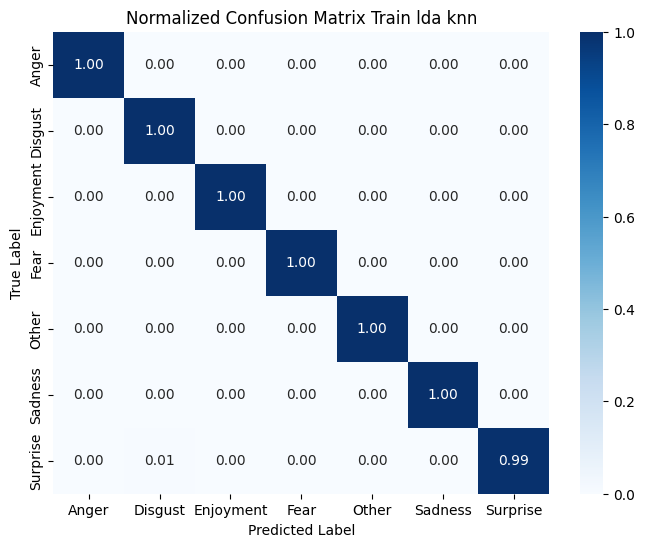

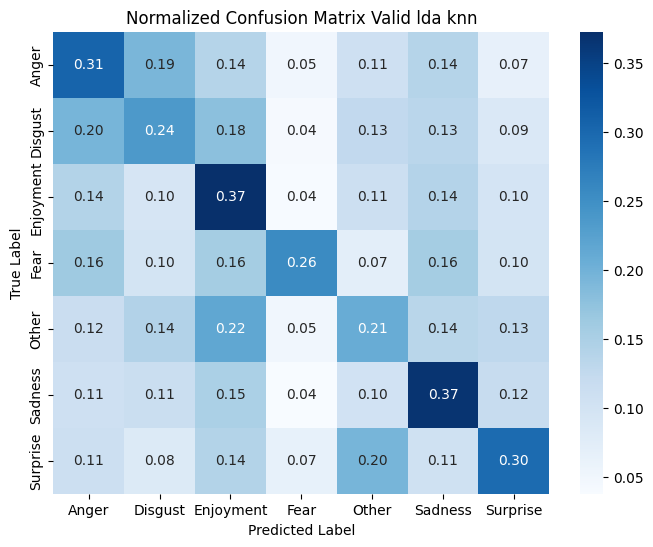

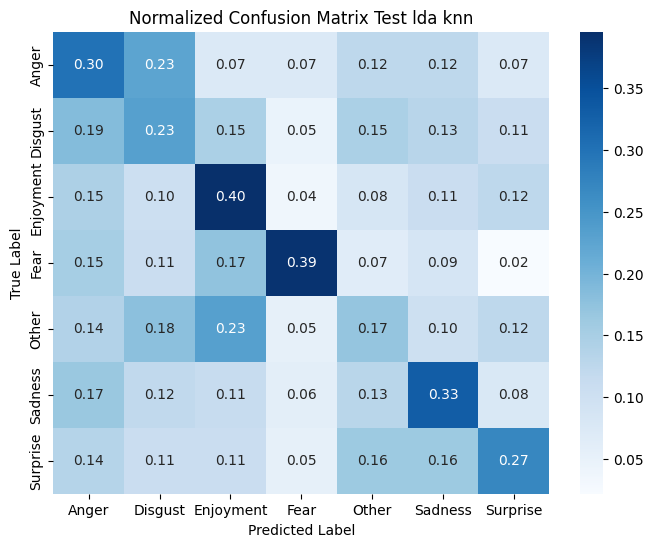

In [65]:

model_lda_73_knn, train_lda_73_knn, valid_lda_73_knn, test_lda_73_knn, pred_lda_73_knn = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    max_iter=1000
)

y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn = train_lda_73_knn[1], valid_lda_73_knn[1], test_lda_73_knn[1]
y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn = pred_lda_73_knn

pipeline_evaluation(
    y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn,
    y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 7:3 --- svm_linear --- none ---
Accuracy: 0.9603884974290612
Recall: 0.9603884974290612
Precision: 0.9607943758484161
F1-score: 0.9603728514180409

--- valid --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5410928476232786
Recall: 0.5410928476232786
Precision: 0.536745631118667
F1-score: 0.5379550955567932

--- test --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5261627906976745
Recall: 0.5261627906976745
Precision: 0.54384093711164
F1-score: 0.5302510540787931


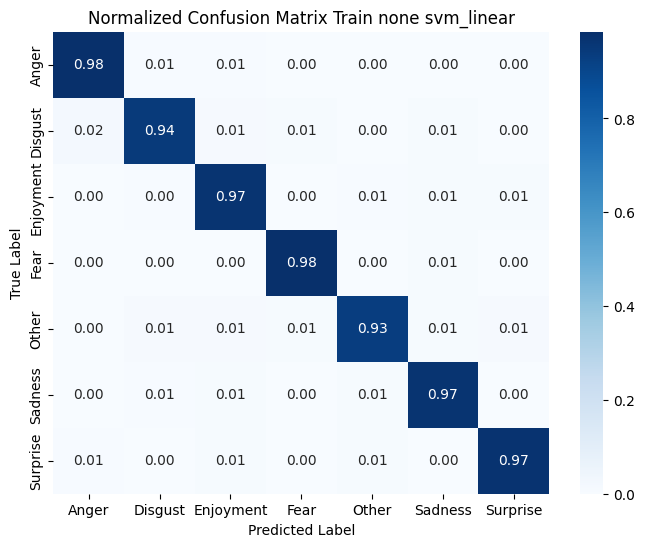

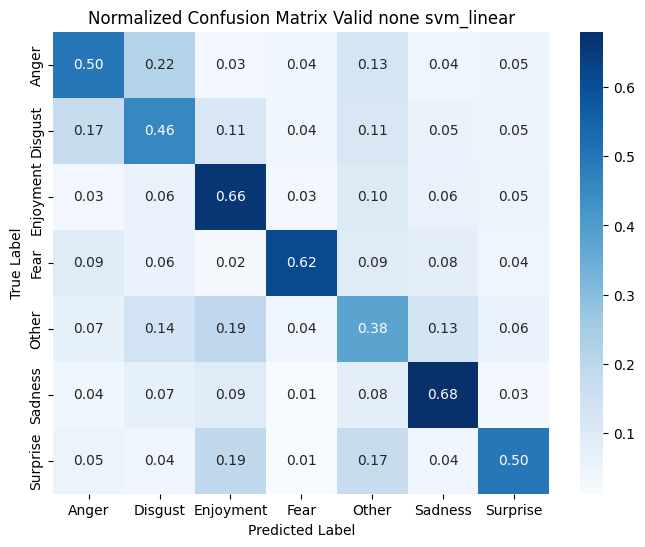

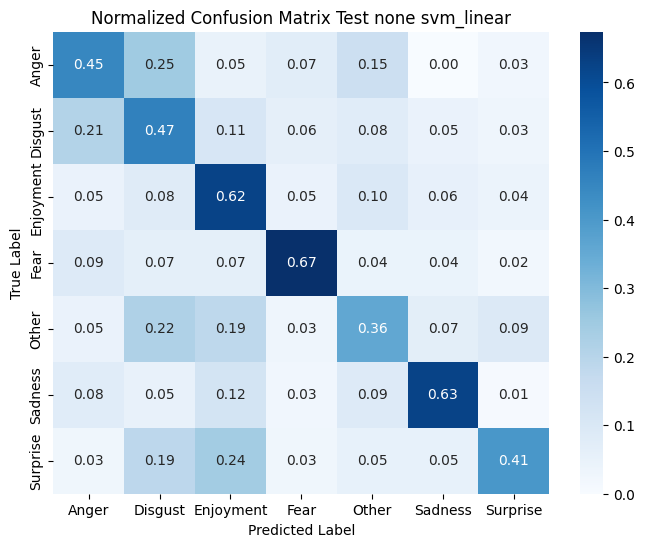

In [66]:
# SVM - linear - None (7:3)
model_73_svm_linear, train_73_svm_linear, valid_73_svm_linear, test_73_svm_linear, pred_73_svm_linear = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear = train_73_svm_linear[1], valid_73_svm_linear[1], test_73_svm_linear[1]
y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear = pred_73_svm_linear

pipeline_evaluation(
    y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear,
    y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 7:3 --- svm_poly --- none ---
Accuracy: 0.43782136735859833
Recall: 0.43782136735859833
Precision: 0.4457502026060935
F1-score: 0.3444735095763174

--- valid --- 7:3 --- svm_poly --- none ---
Accuracy: 0.20302087960906265
Recall: 0.20302087960906265
Precision: 0.3226149713192513
F1-score: 0.13466011623447655

--- test --- 7:3 --- svm_poly --- none ---
Accuracy: 0.14825581395348839
Recall: 0.14825581395348839
Precision: 0.2472241992872095
F1-score: 0.12156120553452791


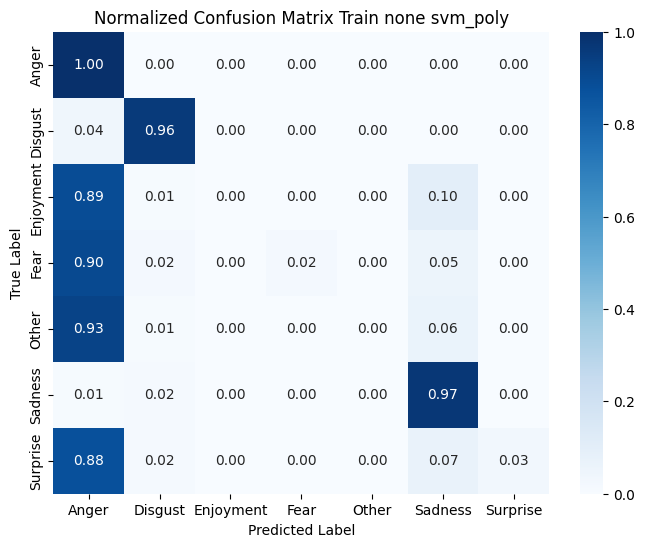

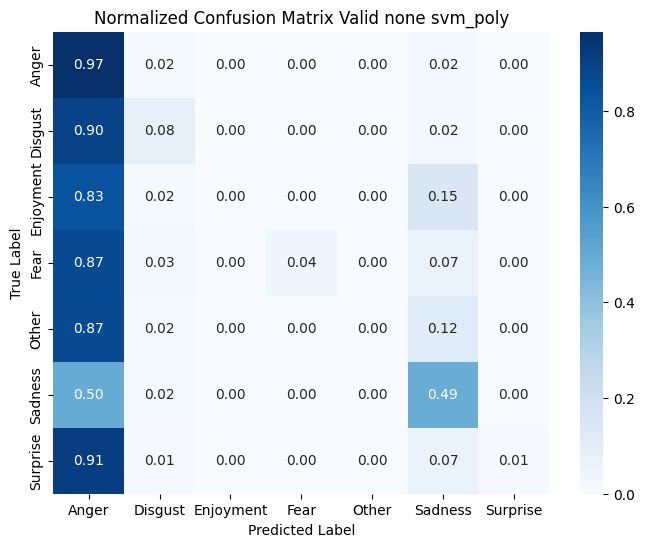

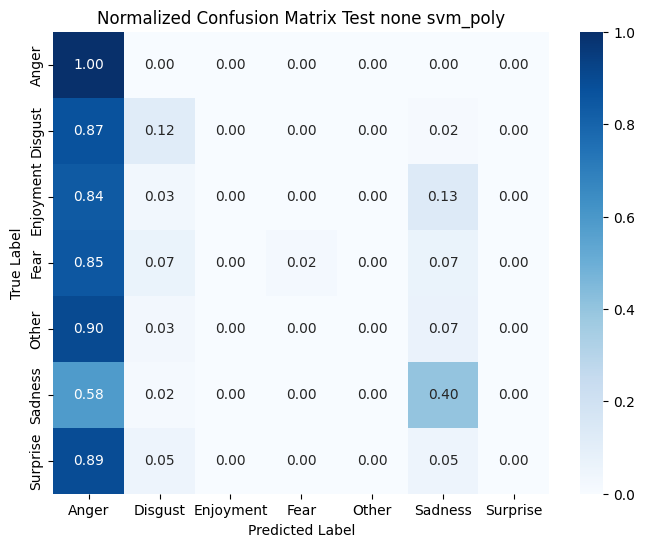

In [67]:
# SVM - poly - None (7:3)
model_73_svm_poly, train_73_svm_poly, valid_73_svm_poly, test_73_svm_poly, pred_73_svm_poly = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly = train_73_svm_poly[1], valid_73_svm_poly[1], test_73_svm_poly[1]
y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly = pred_73_svm_poly

pipeline_evaluation(
    y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly,
    y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- none ---
Accuracy: 0.9925728432679489
Recall: 0.9925728432679489
Precision: 0.9925984610514257
F1-score: 0.9925772508144483

--- valid --- 7:3 --- svm_poly --- none ---
Accuracy: 0.4597956463793869
Recall: 0.4597956463793869
Precision: 0.5747988525417658
F1-score: 0.46542539155666224

--- test --- 7:3 --- svm_poly --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.6048799828398955
F1-score: 0.46893948447419287


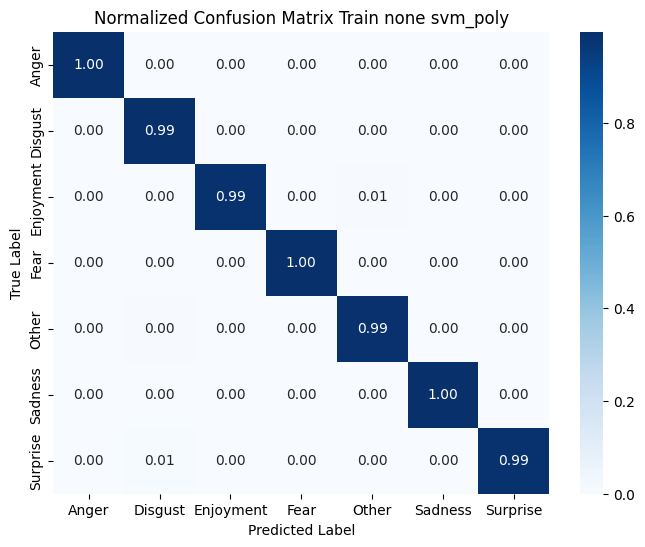

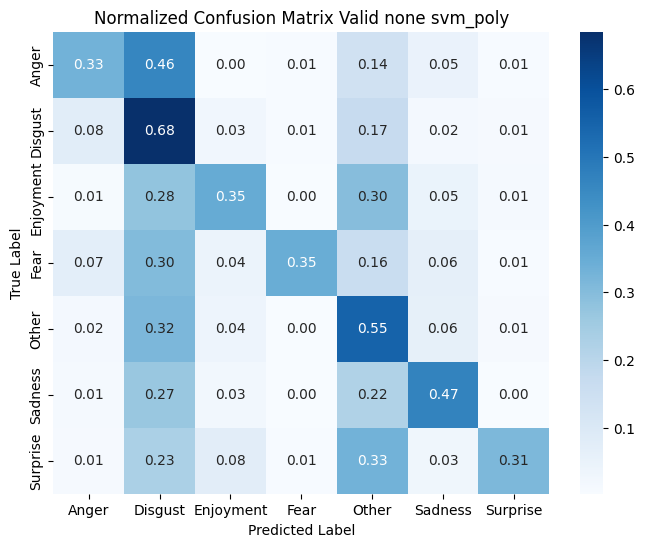

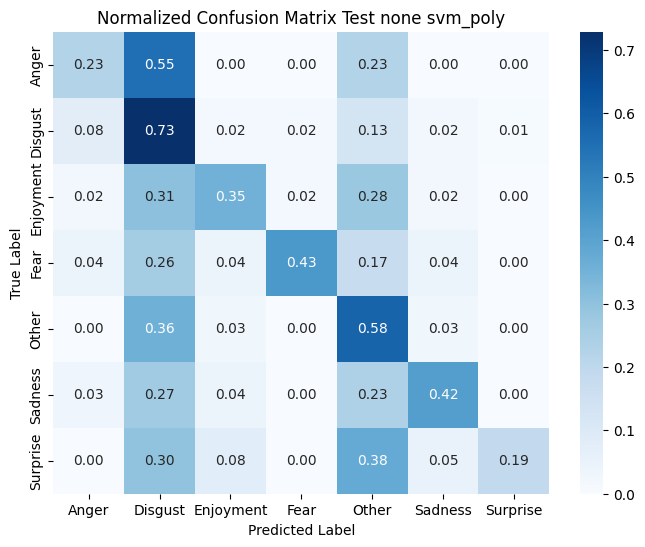

In [128]:
# SVM - poly - None (7:3)
model_73_svm_poly, train_73_svm_poly, valid_73_svm_poly, test_73_svm_poly, pred_73_svm_poly = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly = train_73_svm_poly[1], valid_73_svm_poly[1], test_73_svm_poly[1]
y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly = pred_73_svm_poly

pipeline_evaluation(
    y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly,
    y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.9752428108931632
Recall: 0.9752428108931632
Precision: 0.9754293977926402
F1-score: 0.9752127140981878

--- valid --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.5166592625499777
Recall: 0.5166592625499777
Precision: 0.5721860732328037
F1-score: 0.527068625706962

--- test --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.48546511627906974
Recall: 0.48546511627906974
Precision: 0.5590983182082279
F1-score: 0.5006120902761867


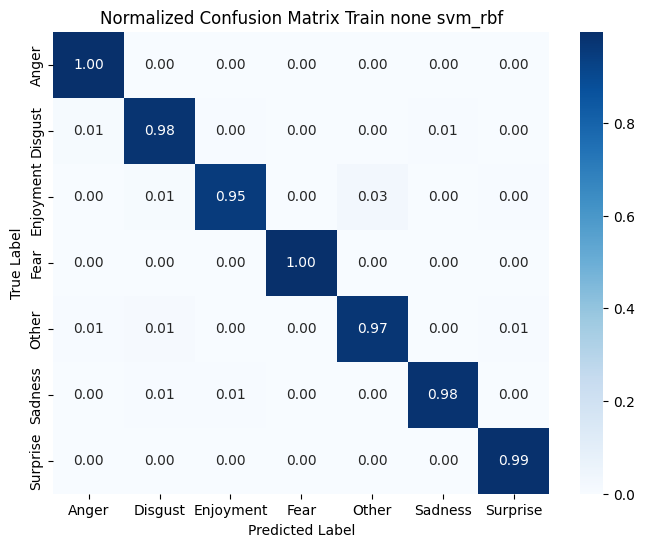

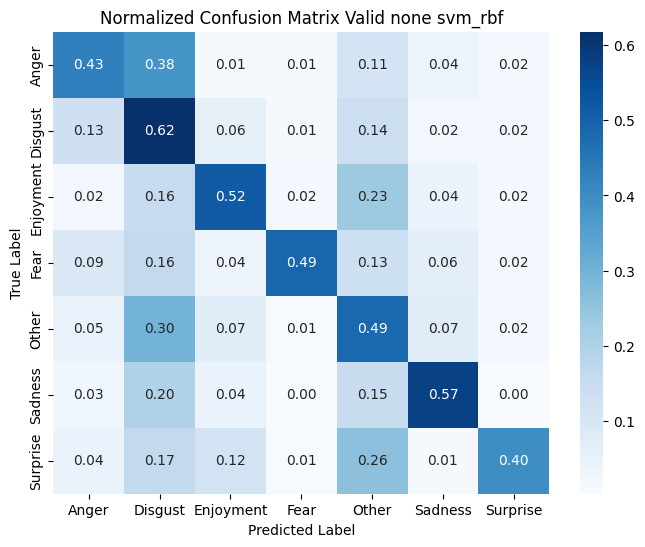

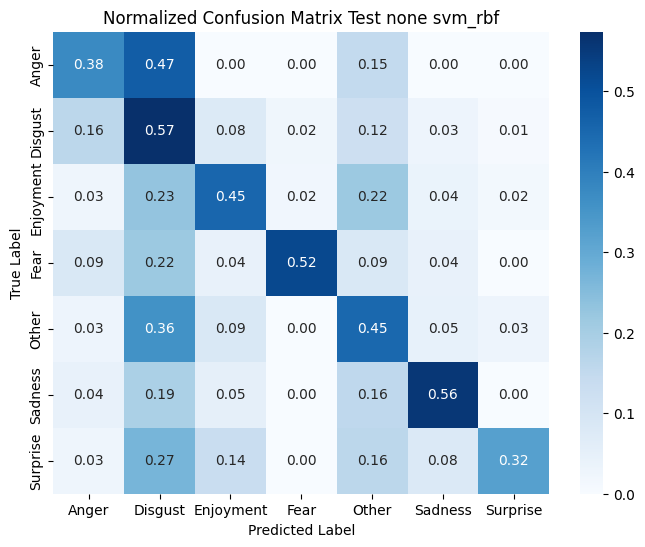

In [68]:
# SVM - rbf - None (7:3)
model_73_svm_rbf, train_73_svm_rbf, valid_73_svm_rbf, test_73_svm_rbf, pred_73_svm_rbf = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf = train_73_svm_rbf[1], valid_73_svm_rbf[1], test_73_svm_rbf[1]
y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf = pred_73_svm_rbf

pipeline_evaluation(
    y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf,
    y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu PCA

--- train --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.8964006855836983
Recall: 0.8964006855836983
Precision: 0.8975553500658734
F1-score: 0.8960150690545721

--- valid --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5406486006219458
Recall: 0.5406486006219458
Precision: 0.5356132578064701
F1-score: 0.5363942584325976

--- test --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5218023255813954
Recall: 0.5218023255813954
Precision: 0.5396533993452789
F1-score: 0.5258119069046583


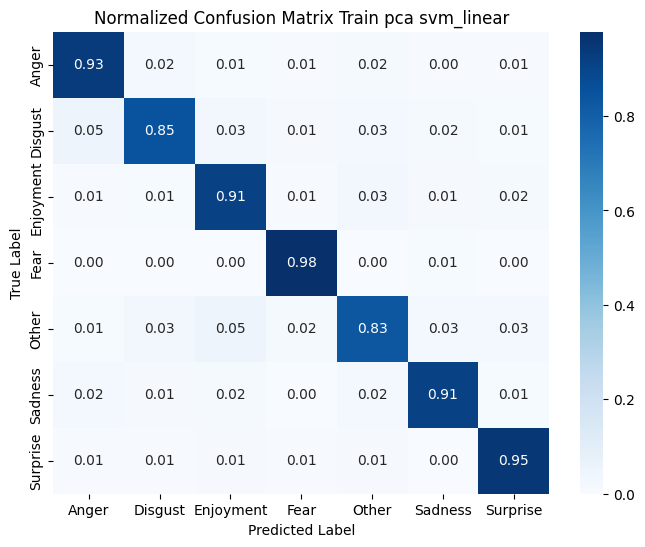

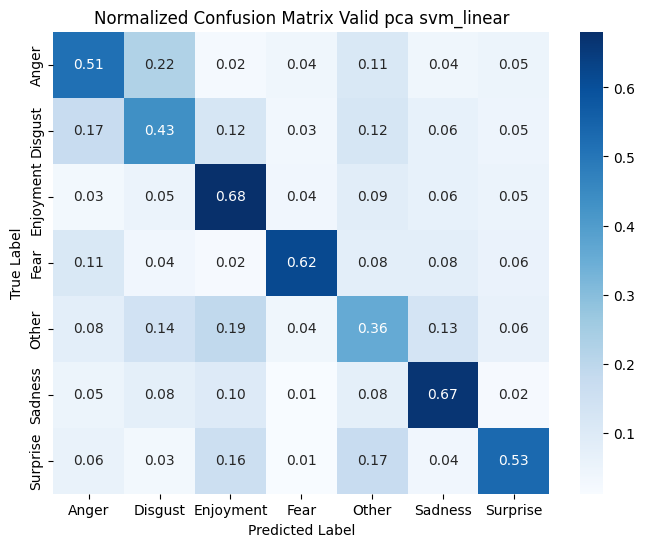

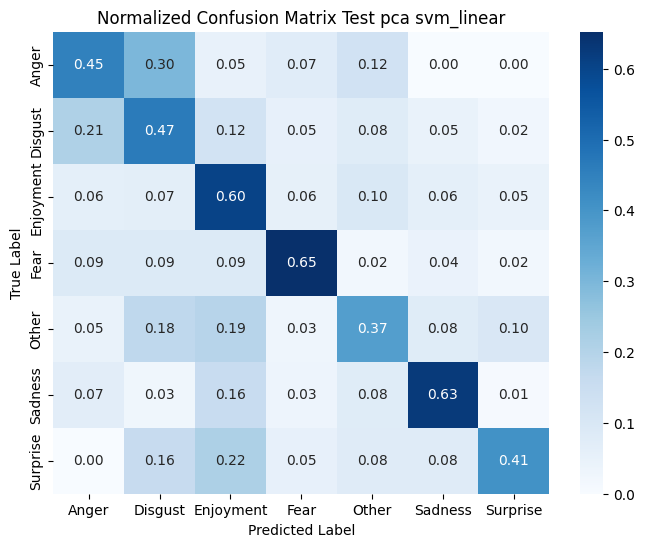

In [69]:
# SVM - linear - PCA (7:3)
model_pca_73_svm_linear, train_pca_73_svm_linear, valid_pca_73_svm_linear, test_pca_73_svm_linear, pred_pca_73_svm_linear = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear = train_pca_73_svm_linear[1], valid_pca_73_svm_linear[1], test_pca_73_svm_linear[1]
y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear = pred_pca_73_svm_linear

pipeline_evaluation(
    y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear,
    y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.11712054846695867
Recall: 0.11712054846695867
Precision: 0.2265150982634694
F1-score: 0.02821667354278721

--- valid --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.1181697023545091
Recall: 0.1181697023545091
Precision: 0.3024848928303602
F1-score: 0.029871346518066187

--- test --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.059593023255813955
Recall: 0.059593023255813955
Precision: 0.07024559087370096
F1-score: 0.009242874167867378


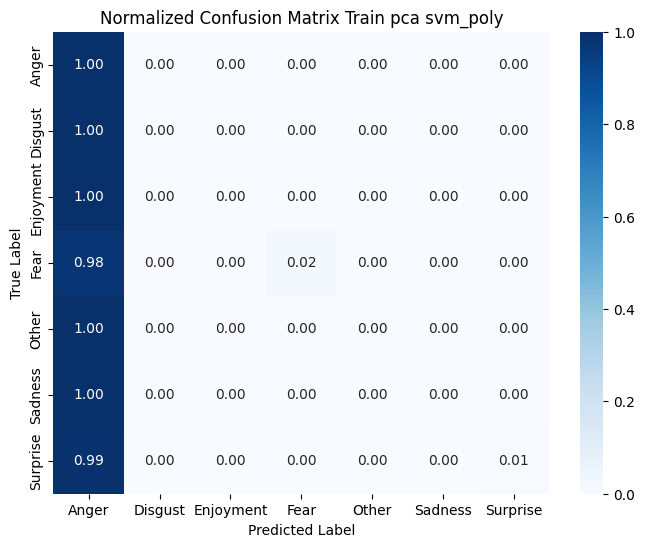

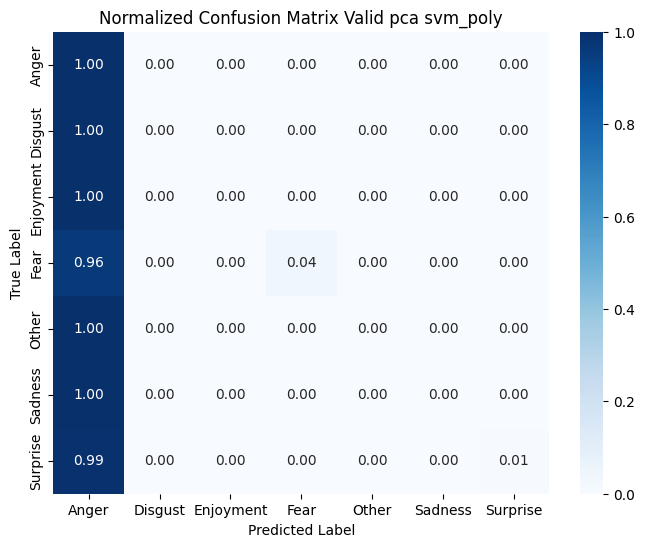

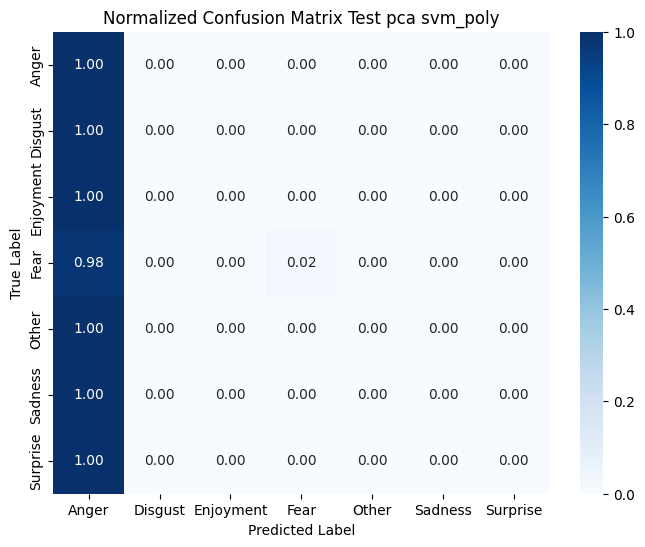

In [70]:
# SVM - poly - PCA (7:3)
model_pca_73_svm_poly, train_pca_73_svm_poly, valid_pca_73_svm_poly, test_pca_73_svm_poly, pred_pca_73_svm_poly = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly = train_pca_73_svm_poly[1], valid_pca_73_svm_poly[1], test_pca_73_svm_poly[1]
y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly = pred_pca_73_svm_poly

pipeline_evaluation(
    y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly,
    y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.9868596457817559
Recall: 0.9868596457817559
Precision: 0.9869245938712212
F1-score: 0.9868631591610539

--- valid --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.45224344735673033
Recall: 0.45224344735673033
Precision: 0.5674430735255847
F1-score: 0.4568687260529686

--- test --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.4375
Recall: 0.4375
Precision: 0.5750687518777816
F1-score: 0.44012325158127513


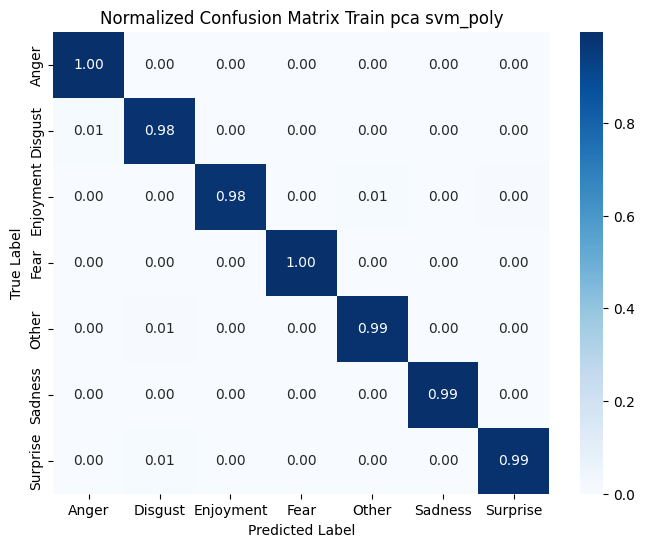

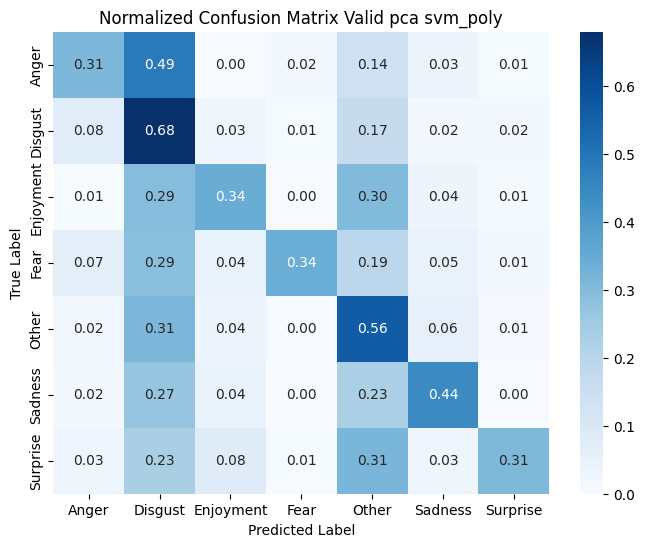

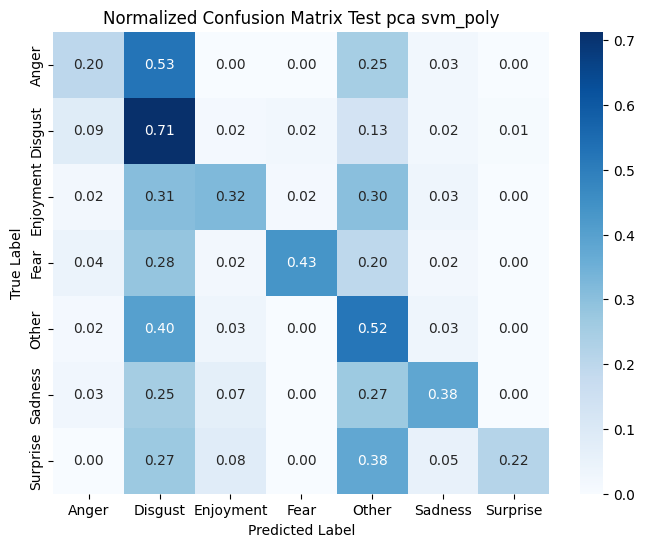

In [129]:
# SVM - poly - PCA (7:3)
model_pca_73_svm_poly, train_pca_73_svm_poly, valid_pca_73_svm_poly, test_pca_73_svm_poly, pred_pca_73_svm_poly = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly = train_pca_73_svm_poly[1], valid_pca_73_svm_poly[1], test_pca_73_svm_poly[1]
y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly = pred_pca_73_svm_poly

pipeline_evaluation(
    y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly,
    y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.9531517806132165
Recall: 0.9531517806132165
Precision: 0.9539151688450914
F1-score: 0.9530785936327965

--- valid --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.5131052865393159
Recall: 0.5131052865393159
Precision: 0.5453084170898475
F1-score: 0.520981823596401

--- test --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.48255813953488375
Recall: 0.48255813953488375
Precision: 0.5416966339291127
F1-score: 0.4956121936642446


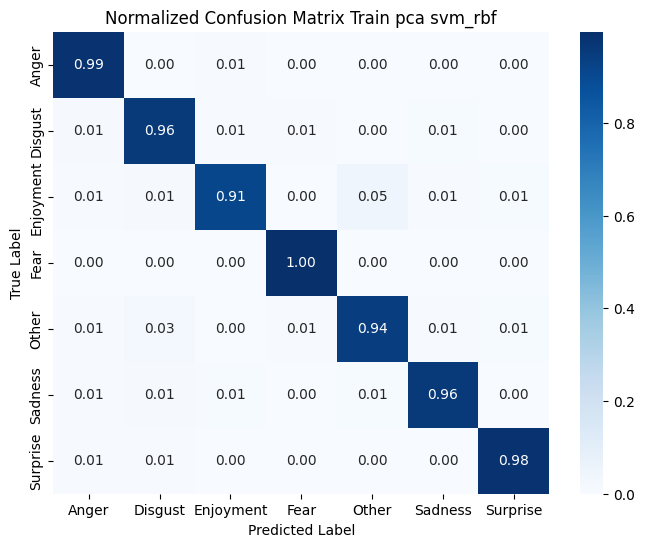

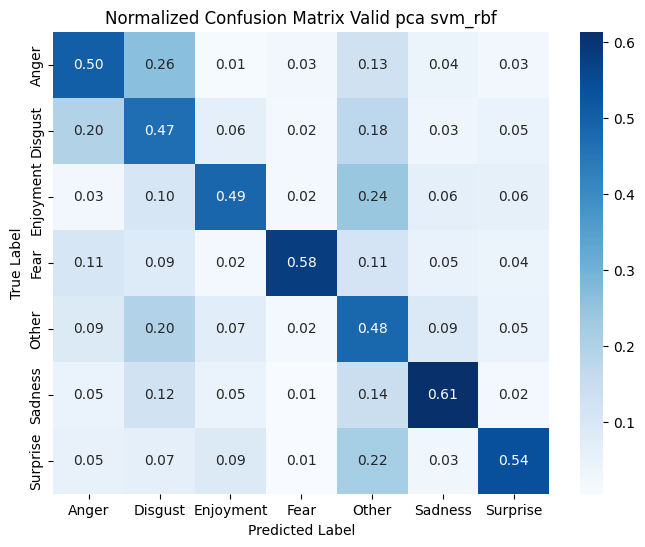

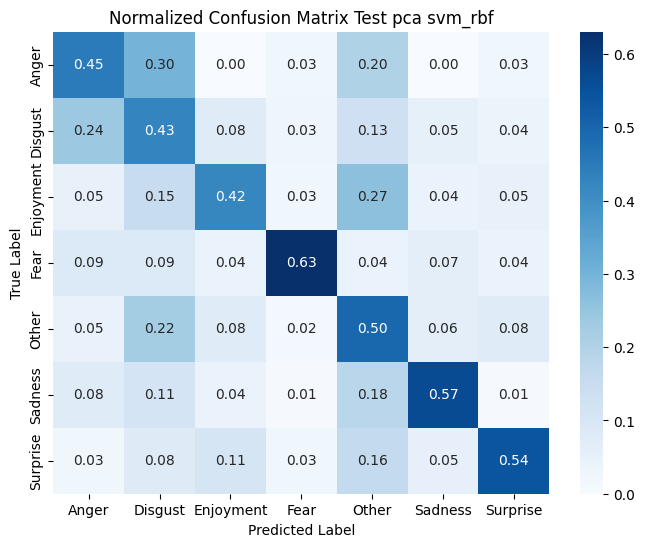

In [71]:
# SVM - rbf - PCA (7:3)
model_pca_73_svm_rbf, train_pca_73_svm_rbf, valid_pca_73_svm_rbf, test_pca_73_svm_rbf, pred_pca_73_svm_rbf = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf = train_pca_73_svm_rbf[1], valid_pca_73_svm_rbf[1], test_pca_73_svm_rbf[1]
y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf = pred_pca_73_svm_rbf

pipeline_evaluation(
    y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf,
    y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu LDA

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


--- train --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.9980956008379356
Recall: 0.9980956008379356
Precision: 0.998106947689232
F1-score: 0.9980978186160417

--- valid --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.30164371390493117
Recall: 0.30164371390493117
Precision: 0.31140379039345933
F1-score: 0.29682659322205196

--- test --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.3023255813953488
Recall: 0.3023255813953488
Precision: 0.32792329215471006
F1-score: 0.3053124425731714


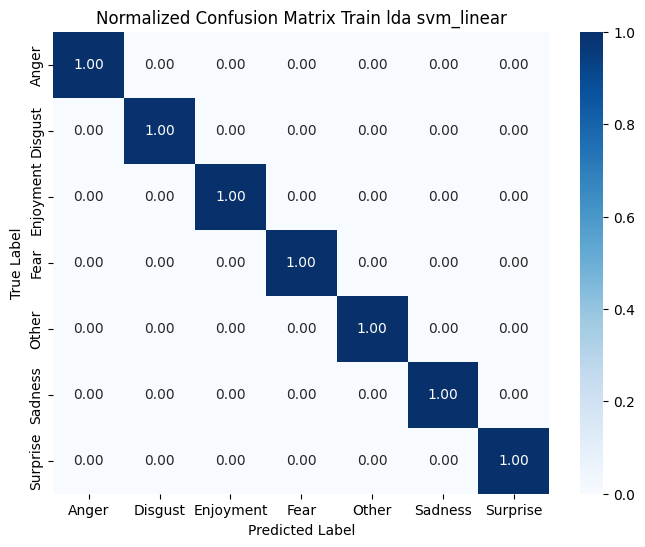

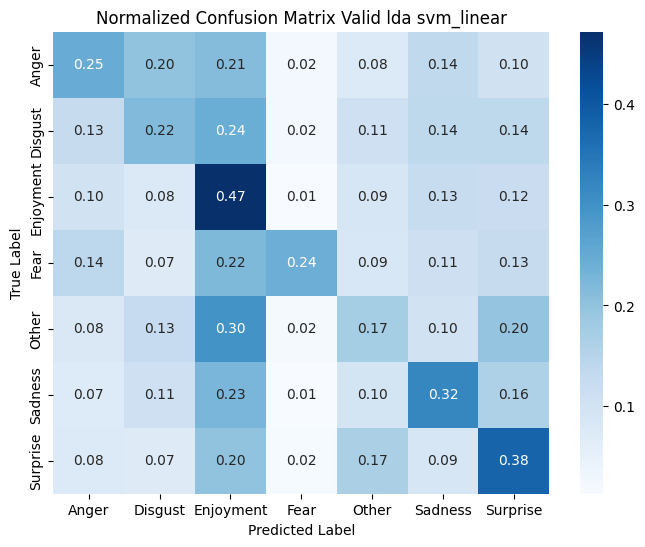

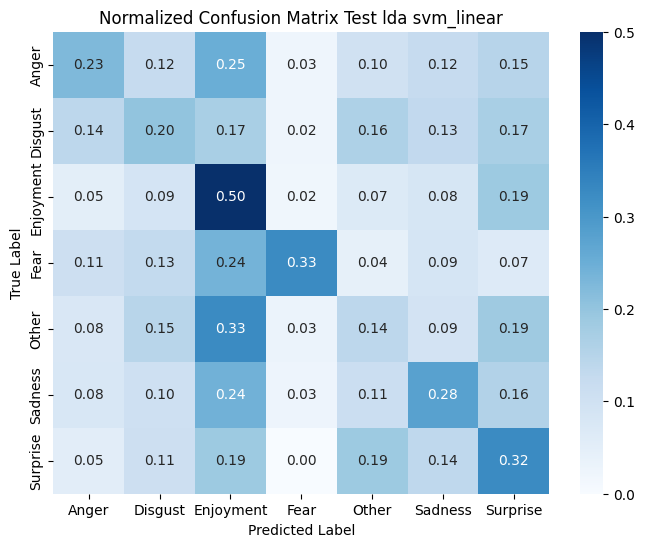

In [72]:
# SVM - linear - LDA (7:3)
model_lda_73_svm_linear, train_lda_73_svm_linear, valid_lda_73_svm_linear, test_lda_73_svm_linear, pred_lda_73_svm_linear = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear = train_lda_73_svm_linear[1], valid_lda_73_svm_linear[1], test_lda_73_svm_linear[1]
y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear = pred_lda_73_svm_linear

pipeline_evaluation(
    y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear,
    y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.9973338411731099
Recall: 0.9973338411731099
Precision: 0.9974008259659981
F1-score: 0.997348381663537

--- valid --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.23589515770768546
Recall: 0.23589515770768546
Precision: 0.2576832885535828
F1-score: 0.24086240409982404

--- test --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.26308139534883723
Recall: 0.26308139534883723
Precision: 0.3141328815808548
F1-score: 0.2814516540653914


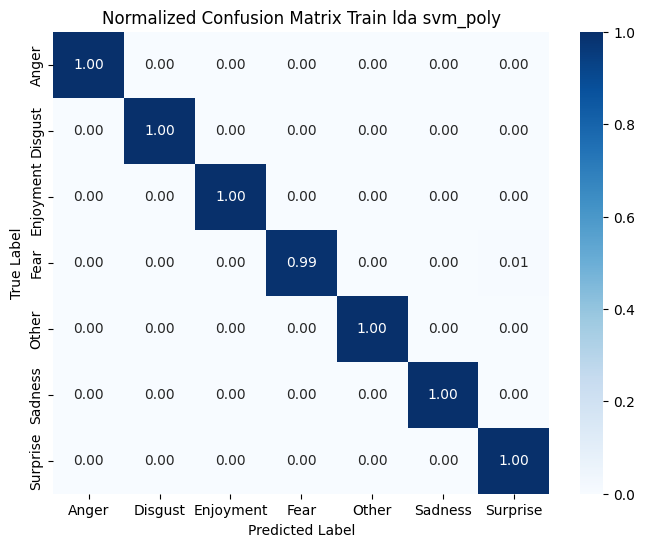

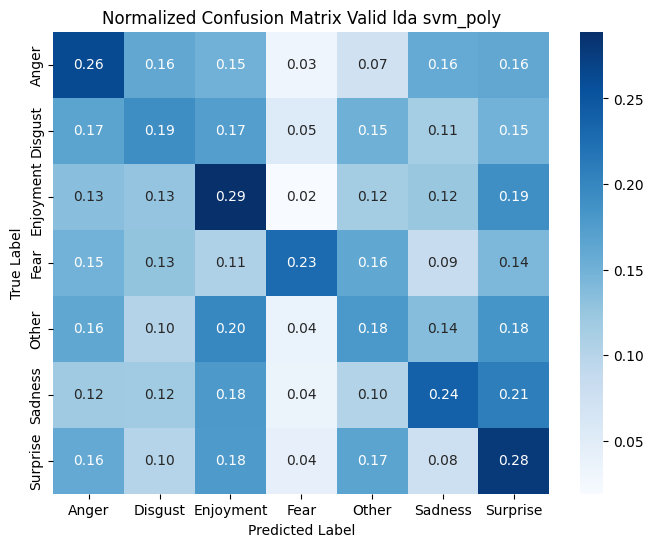

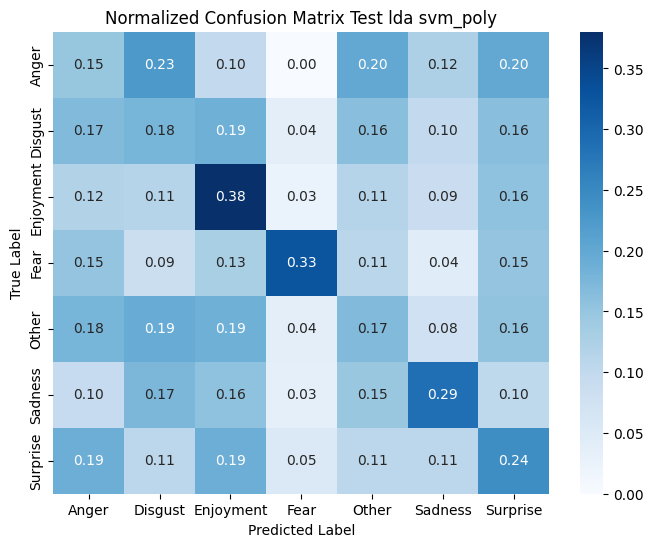

In [73]:
# SVM - poly - LDA (7:3)
model_lda_73_svm_poly, train_lda_73_svm_poly, valid_lda_73_svm_poly, test_lda_73_svm_poly, pred_lda_73_svm_poly = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly = train_lda_73_svm_poly[1], valid_lda_73_svm_poly[1], test_lda_73_svm_poly[1]
y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly = pred_lda_73_svm_poly

pipeline_evaluation(
    y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly,
    y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.9984764806703486
Recall: 0.9984764806703486
Precision: 0.9984873631600242
F1-score: 0.9984791256437358

--- valid --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.07818747223456242
Recall: 0.07818747223456242
Precision: 0.34667545562127355
F1-score: 0.018242721963621537

--- test --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.055232558139534885
Recall: 0.055232558139534885
Precision: 0.08647620177639162
F1-score: 0.008361643288787938


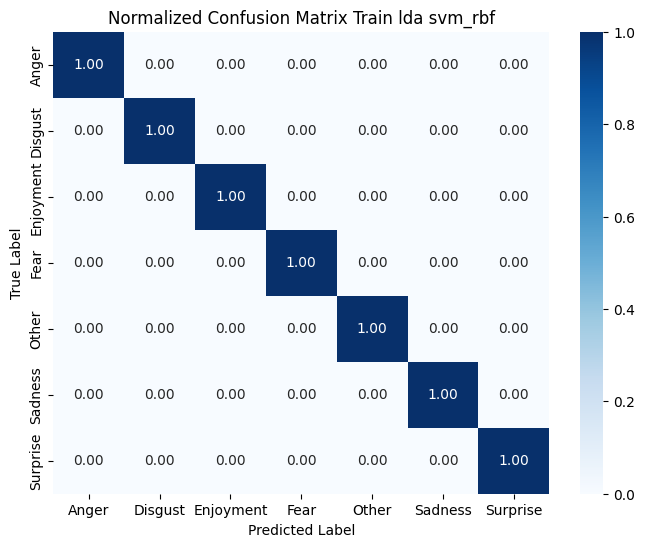

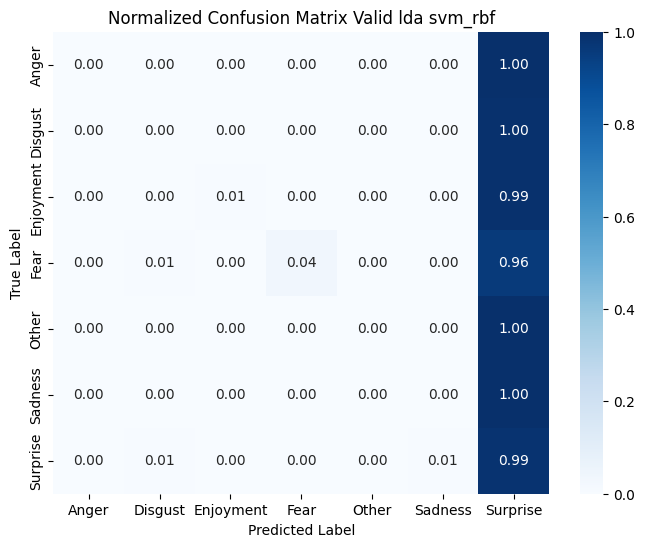

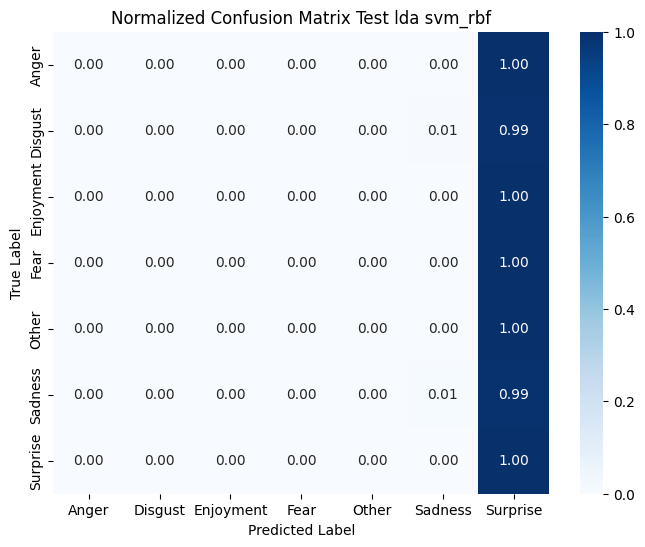

In [74]:
# SVM - rbf - LDA (7:3)
model_lda_73_svm_rbf, train_lda_73_svm_rbf, valid_lda_73_svm_rbf, test_lda_73_svm_rbf, pred_lda_73_svm_rbf = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf = train_lda_73_svm_rbf[1], valid_lda_73_svm_rbf[1], test_lda_73_svm_rbf[1]
y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf = pred_lda_73_svm_rbf

pipeline_evaluation(
    y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf,
    y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 6:4

## Logistic Regression

### Bộ dữ liệu không giảm chiều

TF-IDF hoàn thành!
Shape: (4501, 7446) (số câu x số từ vựng)
Số từ vựng: 7446
TF-IDF - Non-zero values: 61550


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.8493668073761387
Recall: 0.8493668073761387
Precision: 0.8526887288403402
F1-score: 0.8488990841917903

--- valid --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5381539486837721
Recall: 0.5381539486837721
Precision: 0.540277909298196
F1-score: 0.5373115620292793

--- test --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5188953488372093
Recall: 0.5188953488372093
Precision: 0.5429633100584738
F1-score: 0.5261570106416319


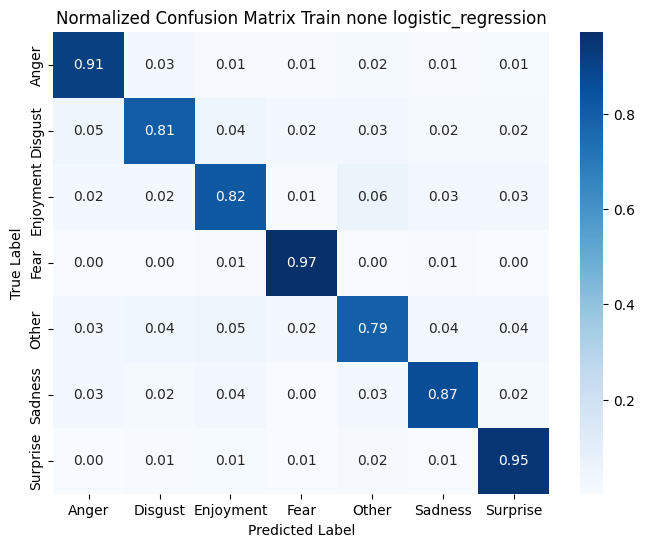

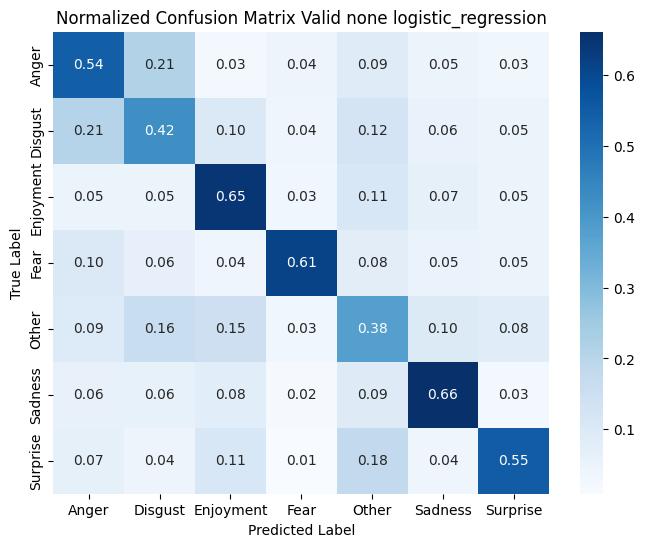

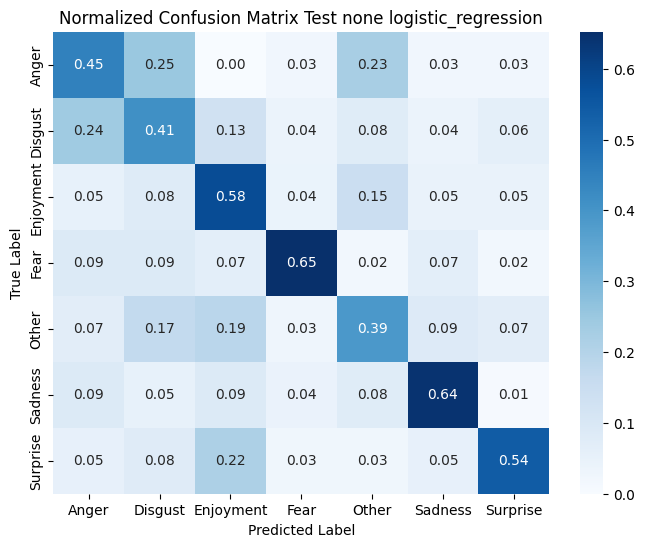

In [75]:
X_train_64, X_valid_64, X_test_64, y_train_64, y_valid_64, y_test_64, tfidf_vec_64, disc_model_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="none"
)

model_64, train_64, valid_64, test_64, pred_64 = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_64, y_pred_valid_64, y_pred_test_64 = pred_64
pipeline_evaluation(
    y_train_64, y_valid_64, y_test_64,
    y_pred_train_64, y_pred_valid_64, y_pred_test_64,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (4501, 7446) (số câu x số từ vựng)
Số từ vựng: 7446
TF-IDF - Non-zero values: 61550


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.805820928682515
Recall: 0.805820928682515
Precision: 0.8109109998746521
F1-score: 0.8053004542646774

--- valid --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5381539486837721
Recall: 0.5381539486837721
Precision: 0.5404985962316619
F1-score: 0.5371019769725843

--- test --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5116279069767442
Recall: 0.5116279069767442
Precision: 0.5404250005214761
F1-score: 0.5202006613606474


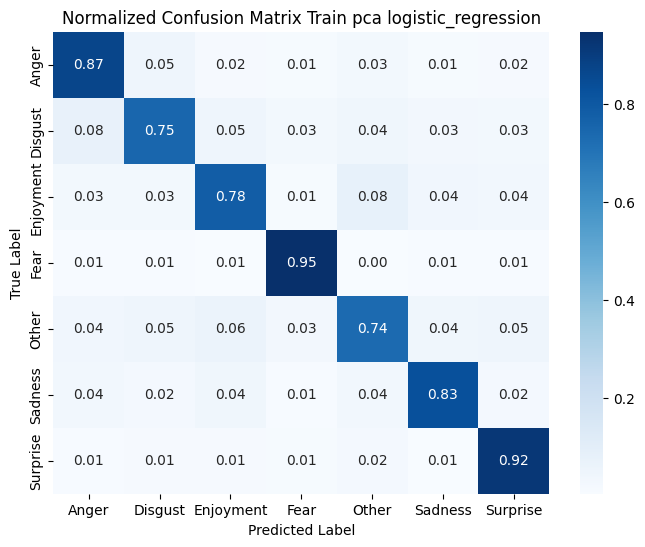

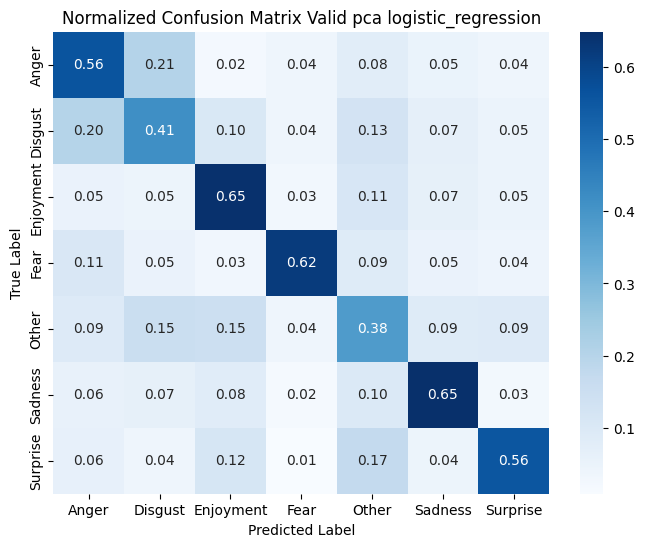

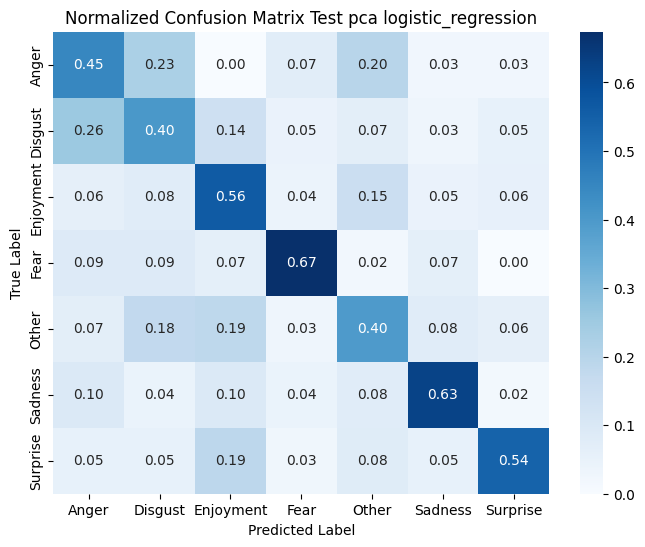

In [76]:
X_train_pca_64, X_valid_pca_64, X_test_pca_64, y_train_pca_64, y_valid_pca_64, y_test_pca_64, tfidf_vec_pca_64, disc_model_pca_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="pca"
)

model_pca_64, train_pca_64, valid_pca_64, test_pca_64, pred_pca_64 = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64 = pred_pca_64

pipeline_evaluation(
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (4501, 7446) (số câu x số từ vựng)
Số từ vựng: 7446
TF-IDF - Non-zero values: 61550


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.9984447900466563
Recall: 0.9984447900466563
Precision: 0.9984545038619169
F1-score: 0.9984473165580116

--- valid --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.2819060313228924
Recall: 0.2819060313228924
Precision: 0.2923712018691725
F1-score: 0.28241231954236734

--- test --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.2936046511627907
Recall: 0.2936046511627907
Precision: 0.35244950099077776
F1-score: 0.30661562925897967


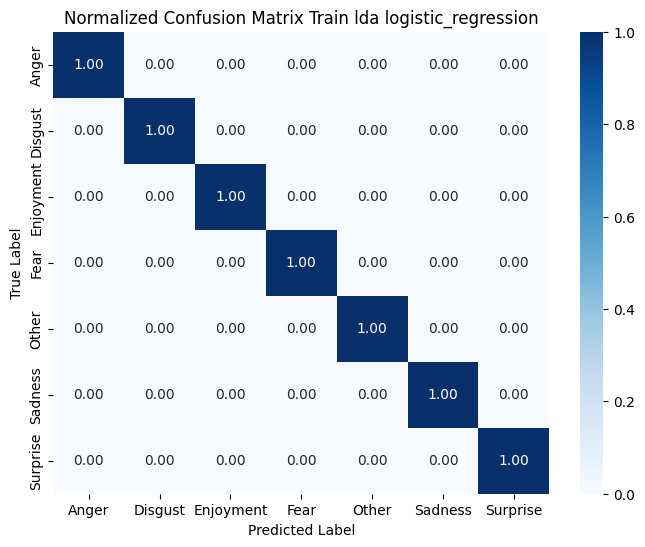

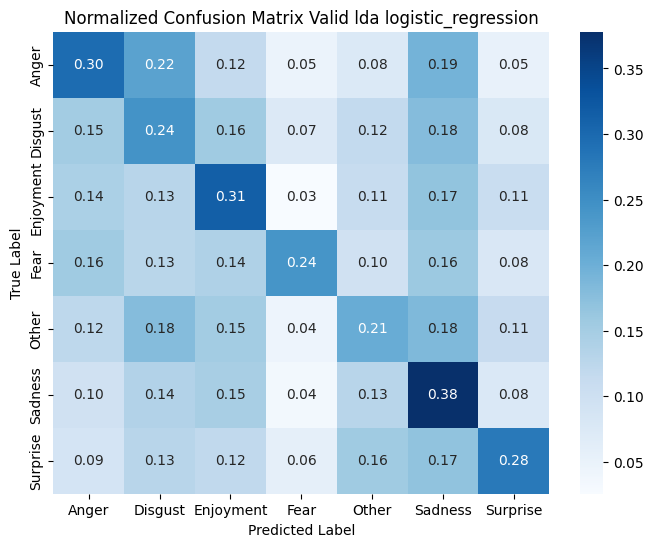

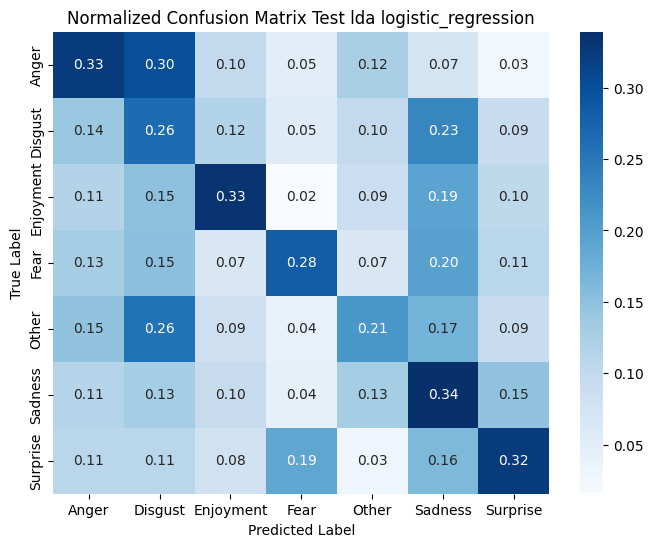

In [77]:
X_train_lda_64, X_valid_lda_64, X_test_lda_64, y_train_lda_64, y_valid_lda_64, y_test_lda_64, tfidf_vec_lda_64, disc_model_lda_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="lda"
)

model_lda_64, train_lda_64, valid_lda_64, test_lda_64, pred_lda_64 = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64 = pred_lda_64

pipeline_evaluation(
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

--- train --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.49677849366807375
Recall: 0.49677849366807375
Precision: 0.5351574528352663
F1-score: 0.4847902417240133

--- valid --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.4675108297234255
Recall: 0.4675108297234255
Precision: 0.5023153066486269
F1-score: 0.4540074153108387

--- test --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.506805140513967
F1-score: 0.4586175148416896


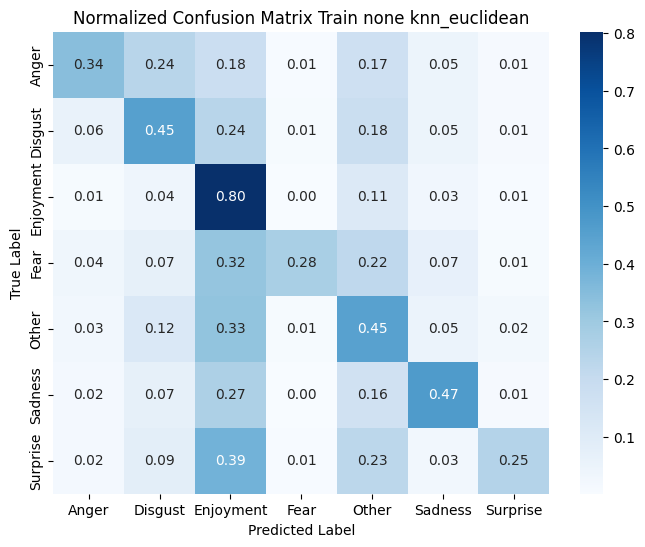

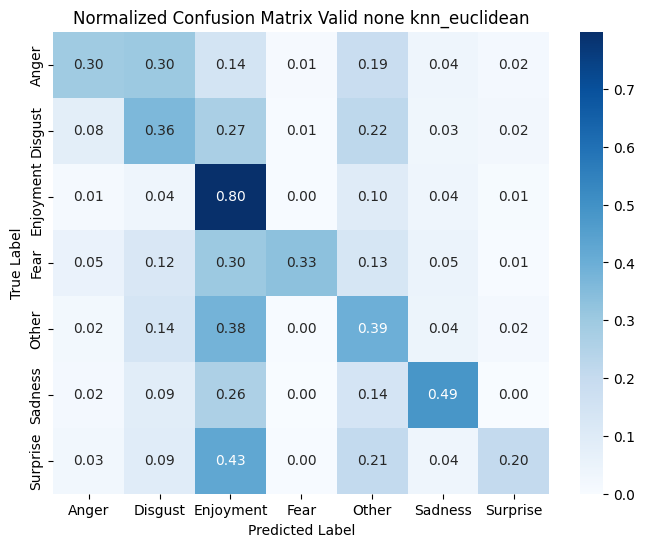

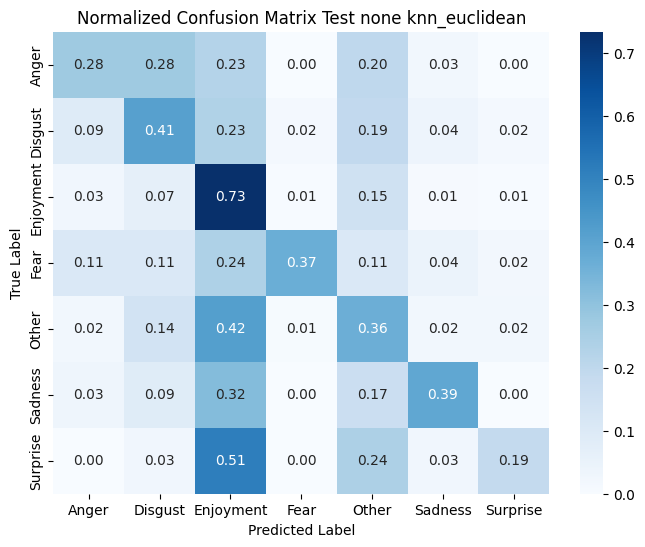

In [78]:
# KNN - euclidean - None (6:4)
model_64_knn_euclidean, train_64_knn_euclidean, valid_64_knn_euclidean, test_64_knn_euclidean, pred_64_knn_euclidean = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn",
    metric="euclidean"
)

y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean = train_64_knn_euclidean[1], valid_64_knn_euclidean[1], test_64_knn_euclidean[1]
y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean = pred_64_knn_euclidean

pipeline_evaluation(
    y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean,
    y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- none ---
Accuracy: 0.49166851810708734
Recall: 0.49166851810708734
Precision: 0.5323799255218349
F1-score: 0.4730132412343476

--- valid --- 6:4 --- knn --- none ---
Accuracy: 0.46351216261246253
Recall: 0.46351216261246253
Precision: 0.5032486777962921
F1-score: 0.4442566059928281

--- test --- 6:4 --- knn --- none ---
Accuracy: 0.46656976744186046
Recall: 0.46656976744186046
Precision: 0.4977877671350022
F1-score: 0.451446908169309


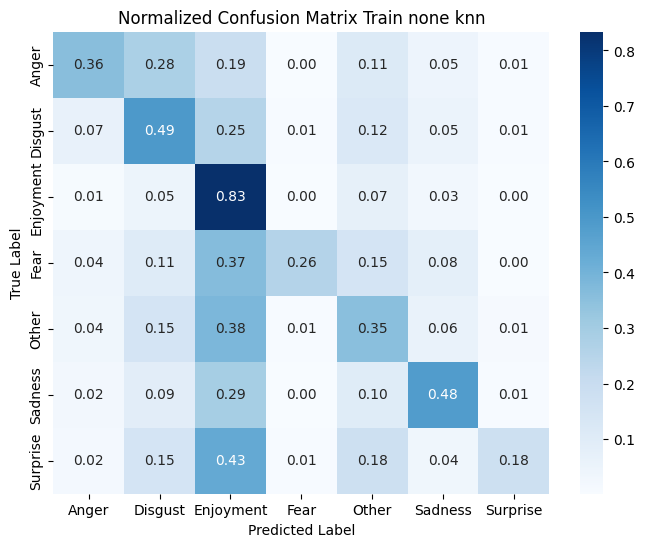

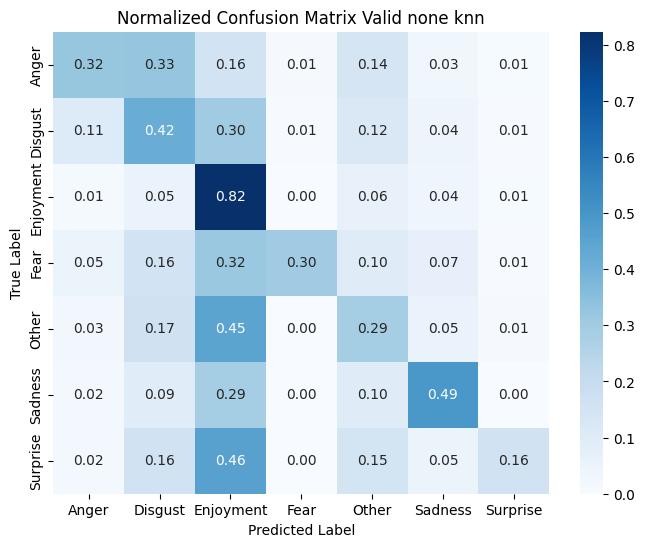

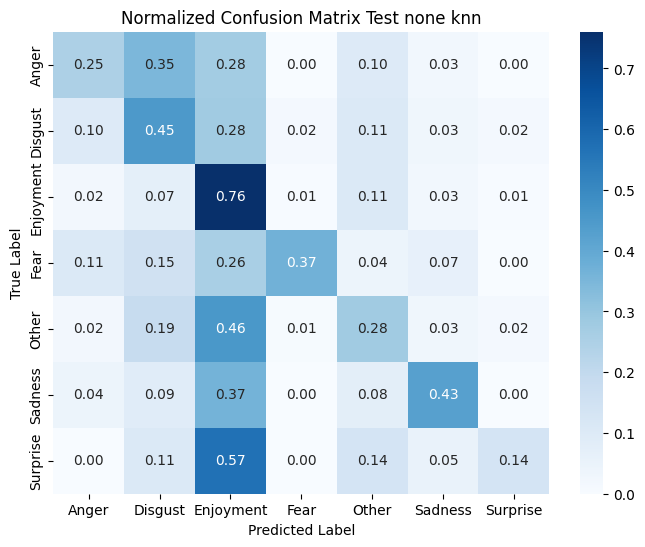

In [79]:
model_64_knn, train_64_knn, valid_64_knn, test_64_knn, pred_64_knn = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn"
)

y_train_64_knn, y_valid_64_knn, y_test_64_knn = train_64_knn[1], valid_64_knn[1], test_64_knn[1]
y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn = pred_64_knn

pipeline_evaluation(
    y_train_64_knn, y_valid_64_knn, y_test_64_knn,
    y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.4983337036214175
Recall: 0.4983337036214175
Precision: 0.5364793669037127
F1-score: 0.48701461546744096

--- valid --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.47050983005664776
Recall: 0.47050983005664776
Precision: 0.5078552364572525
F1-score: 0.45801954121526156

--- test --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.4491279069767442
Recall: 0.4491279069767442
Precision: 0.4791593322287577
F1-score: 0.4381082623822232


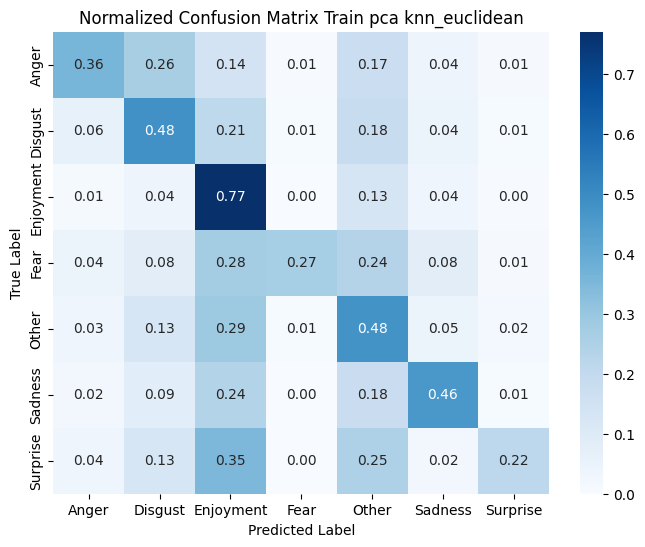

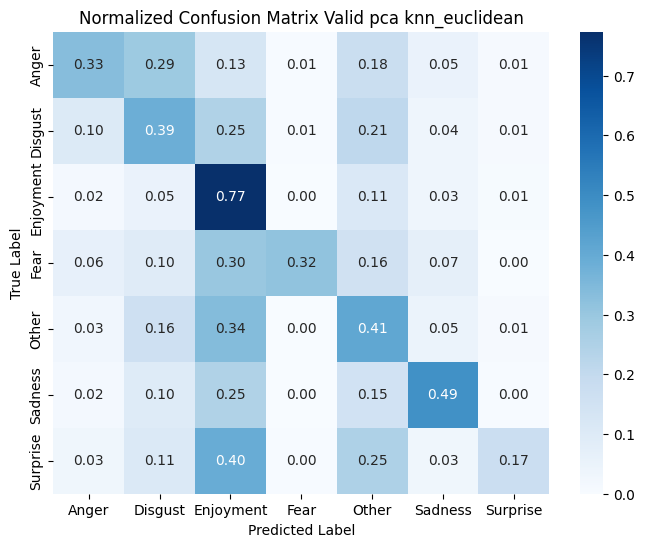

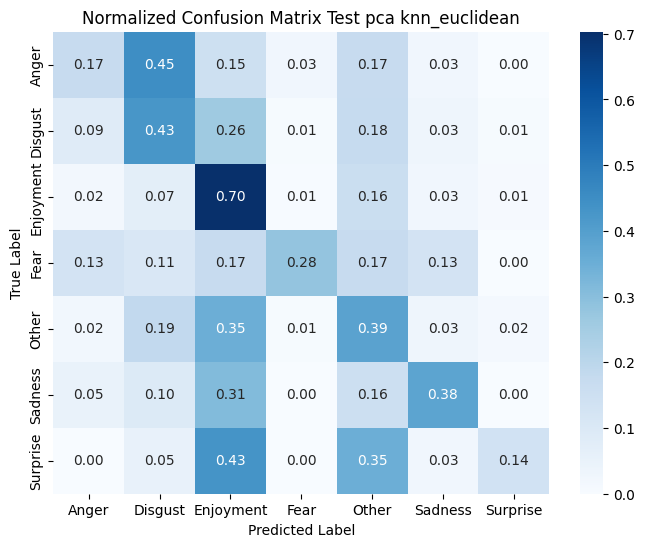

In [80]:
# KNN - euclidean - PCA (6:4)
model_pca_64_knn_euclidean, train_pca_64_knn_euclidean, valid_pca_64_knn_euclidean, test_pca_64_knn_euclidean, pred_pca_64_knn_euclidean = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean = train_pca_64_knn_euclidean[1], valid_pca_64_knn_euclidean[1], test_pca_64_knn_euclidean[1]
y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean = pred_pca_64_knn_euclidean

pipeline_evaluation(
    y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean,
    y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- pca ---
Accuracy: 0.4896689624527883
Recall: 0.4896689624527883
Precision: 0.5321816363701947
F1-score: 0.4718228971341378

--- valid --- 6:4 --- knn --- pca ---
Accuracy: 0.4691769410196601
Recall: 0.4691769410196601
Precision: 0.5085209048568099
F1-score: 0.4513541225987991

--- test --- 6:4 --- knn --- pca ---
Accuracy: 0.46075581395348836
Recall: 0.46075581395348836
Precision: 0.4999036876633105
F1-score: 0.44807394655903654


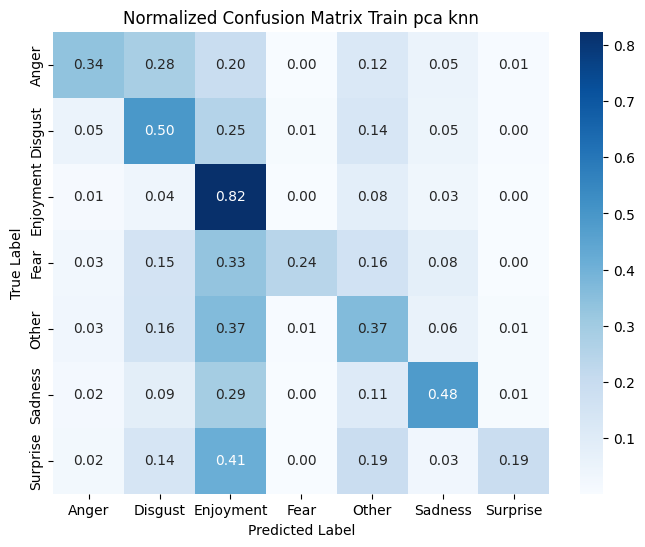

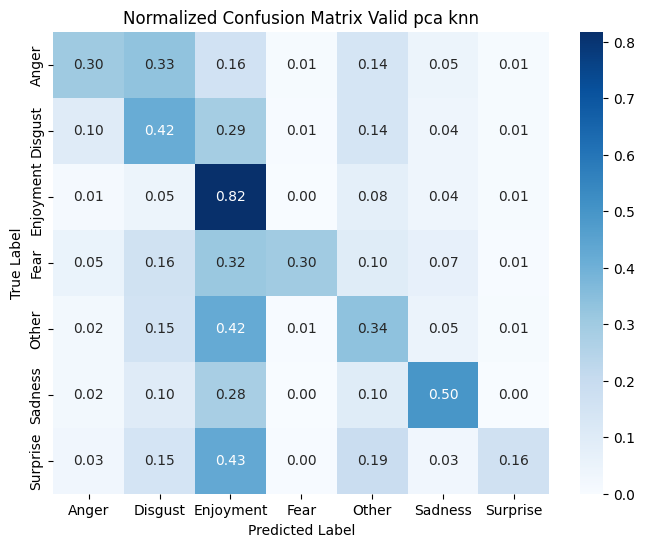

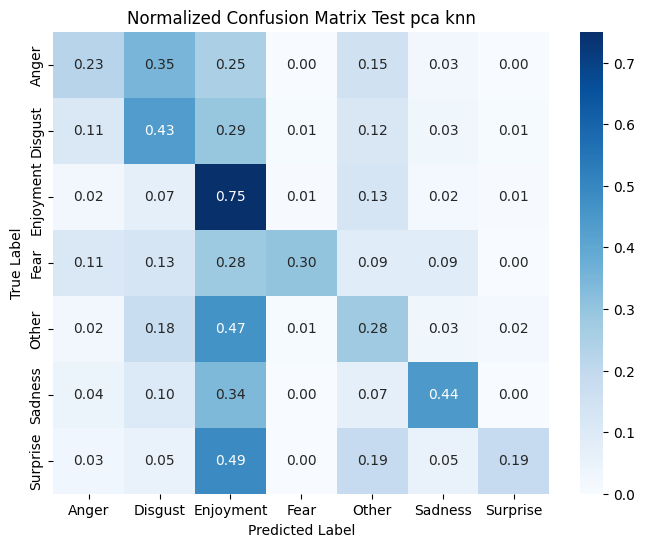

In [81]:

model_pca_64_knn, train_pca_64_knn, valid_pca_64_knn, test_pca_64_knn, pred_pca_64_knn = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    max_iter=1000
)

y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn = train_pca_64_knn[1], valid_pca_64_knn[1], test_pca_64_knn[1]
y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn = pred_pca_64_knn

pipeline_evaluation(
    y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn,
    y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.9984447900466563
Recall: 0.9984447900466563
Precision: 0.9984520287857345
F1-score: 0.998446353144589

--- valid --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.28357214261912694
Recall: 0.28357214261912694
Precision: 0.29037710397537275
F1-score: 0.2811106106272198

--- test --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.3373540191251814
F1-score: 0.3039339807586984


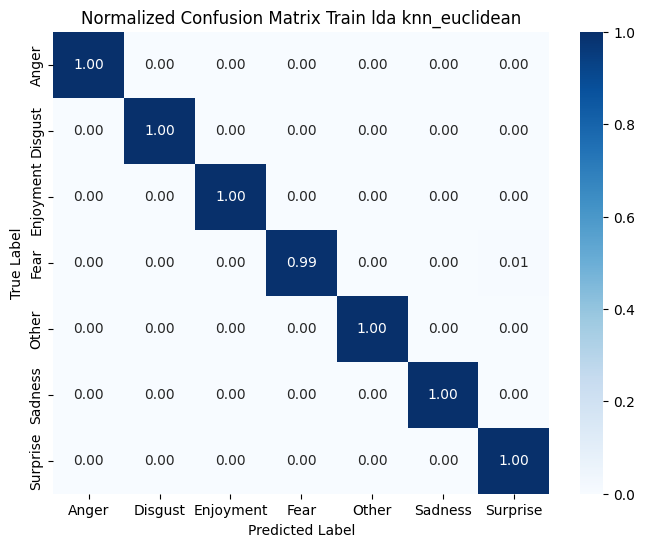

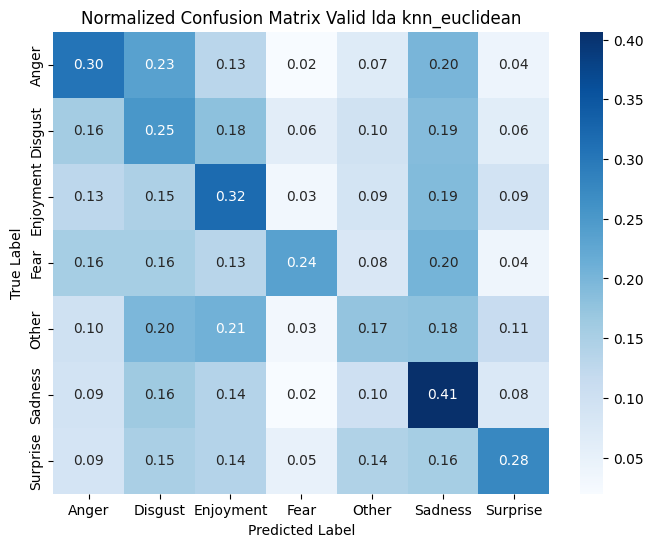

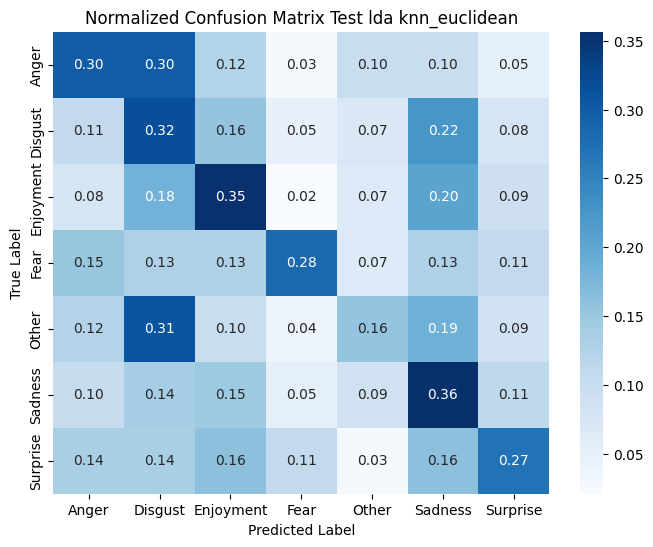

In [82]:
# KNN - euclidean - LDA (6:4)
model_lda_64_knn_euclidean, train_lda_64_knn_euclidean, valid_lda_64_knn_euclidean, test_lda_64_knn_euclidean, pred_lda_64_knn_euclidean = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean = train_lda_64_knn_euclidean[1], valid_lda_64_knn_euclidean[1], test_lda_64_knn_euclidean[1]
y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean = pred_lda_64_knn_euclidean

pipeline_evaluation(
    y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean,
    y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- lda ---
Accuracy: 0.9984447900466563
Recall: 0.9984447900466563
Precision: 0.9984486515939067
F1-score: 0.9984459585934703

--- valid --- 6:4 --- knn --- lda ---
Accuracy: 0.2899033655448184
Recall: 0.2899033655448184
Precision: 0.30266627699877047
F1-score: 0.2872761642704121

--- test --- 6:4 --- knn --- lda ---
Accuracy: 0.3066860465116279
Recall: 0.3066860465116279
Precision: 0.36318018618274356
F1-score: 0.3126347840053507


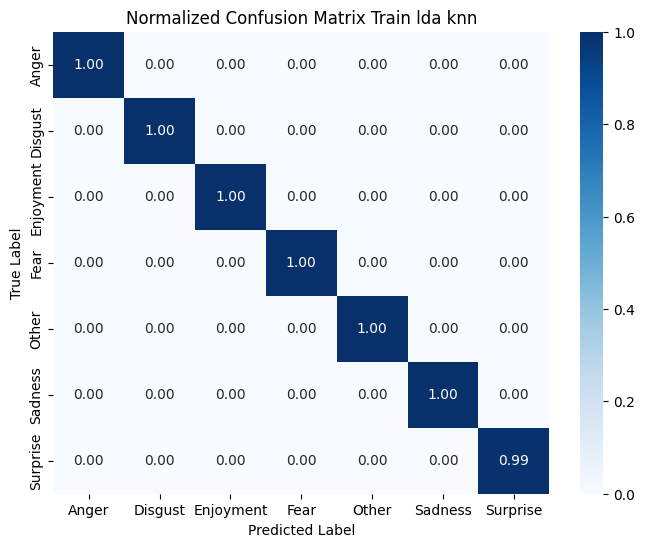

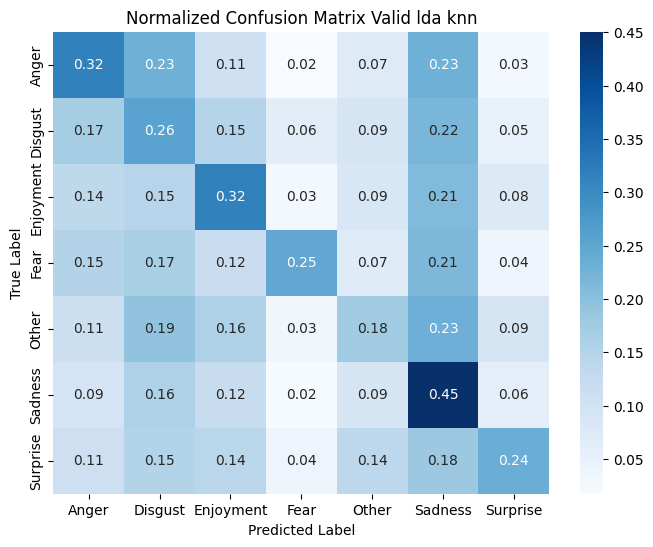

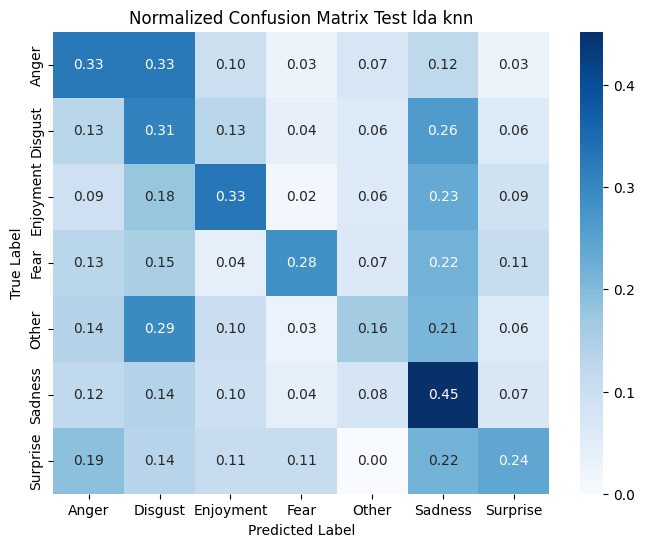

In [83]:

model_lda_64_knn, train_lda_64_knn, valid_lda_64_knn, test_lda_64_knn, pred_lda_64_knn = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    max_iter=1000
)

y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn = train_lda_64_knn[1], valid_lda_64_knn[1], test_lda_64_knn[1]
y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn = pred_lda_64_knn

pipeline_evaluation(
    y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn,
    y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 6:4 --- svm_linear --- none ---
Accuracy: 0.9684514552321706
Recall: 0.9684514552321706
Precision: 0.9687503981156285
F1-score: 0.9684399288305041

--- valid --- 6:4 --- svm_linear --- none ---
Accuracy: 0.530156614461846
Recall: 0.530156614461846
Precision: 0.5253890441526357
F1-score: 0.5265753000410702

--- test --- 6:4 --- svm_linear --- none ---
Accuracy: 0.5130813953488372
Recall: 0.5130813953488372
Precision: 0.5279682772468434
F1-score: 0.5160244262234275


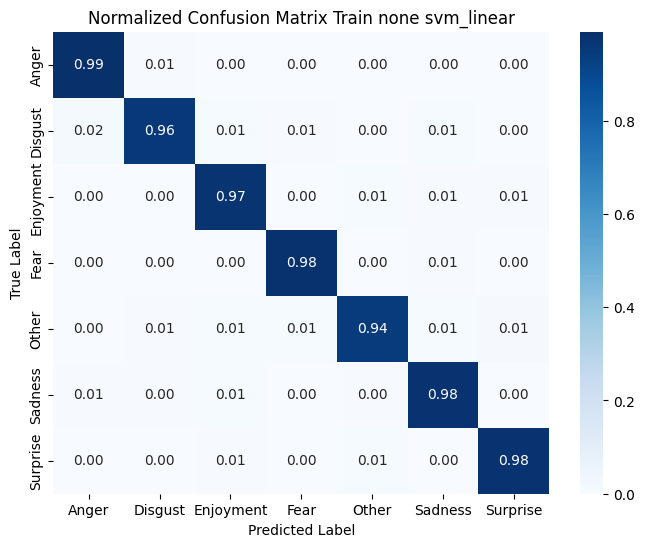

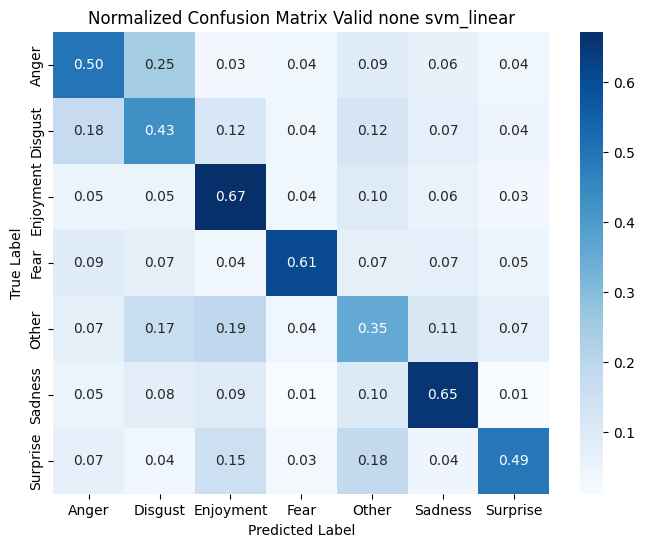

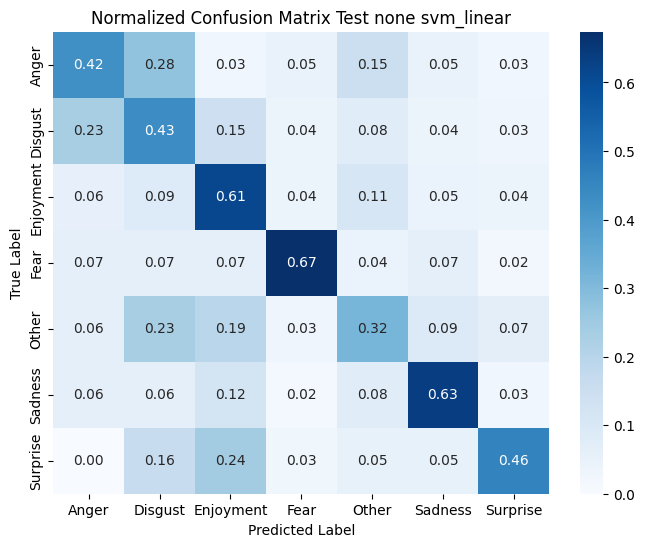

In [84]:
# SVM - linear - None (6:4)
model_64_svm_linear, train_64_svm_linear, valid_64_svm_linear, test_64_svm_linear, pred_64_svm_linear = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear = train_64_svm_linear[1], valid_64_svm_linear[1], test_64_svm_linear[1]
y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear = pred_64_svm_linear

pipeline_evaluation(
    y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear,
    y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 6:4 --- svm_poly --- none ---
Accuracy: 0.267273939124639
Recall: 0.267273939124639
Precision: 0.1403473525198246
F1-score: 0.12052264562018572

--- valid --- 6:4 --- svm_poly --- none ---
Accuracy: 0.22659113628790403
Recall: 0.22659113628790403
Precision: 0.1257319431378385
F1-score: 0.10099103824397833

--- test --- 6:4 --- svm_poly --- none ---
Accuracy: 0.2005813953488372
Recall: 0.2005813953488372
Precision: 0.111651213705038
F1-score: 0.07587403403169786


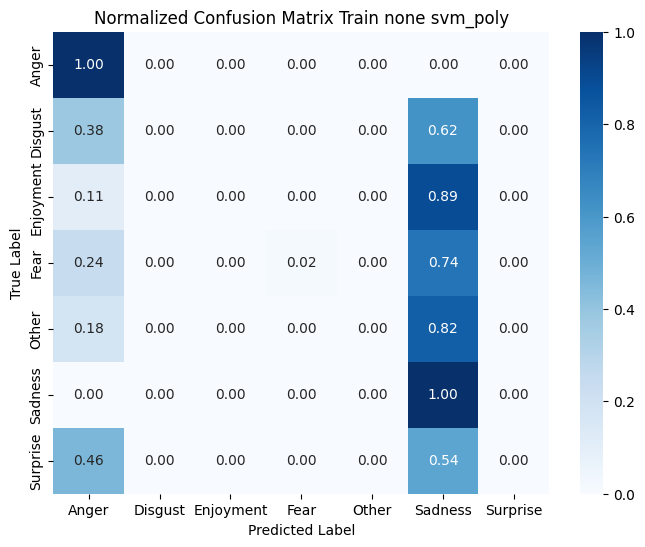

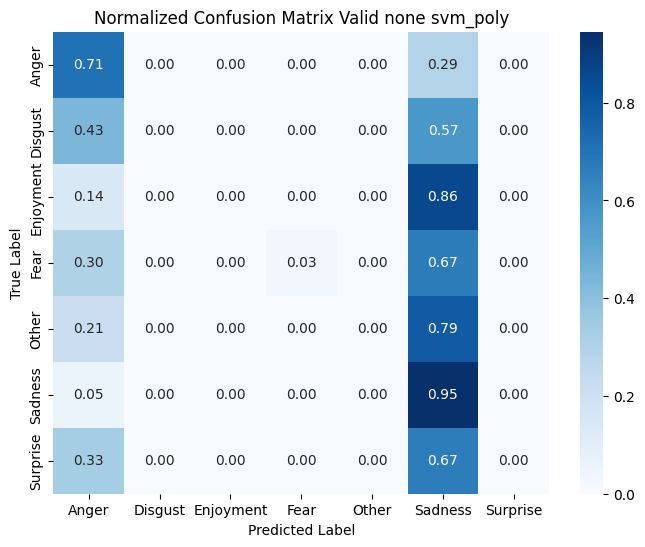

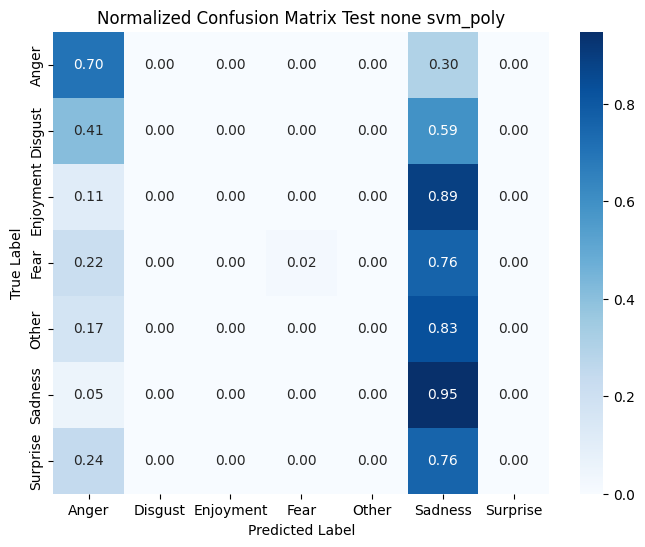

In [86]:
# SVM - poly - None (6:4)
model_64_svm_poly, train_64_svm_poly, valid_64_svm_poly, test_64_svm_poly, pred_64_svm_poly = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly = train_64_svm_poly[1], valid_64_svm_poly[1], test_64_svm_poly[1]
y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly = pred_64_svm_poly

pipeline_evaluation(
    y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly,
    y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- none ---
Accuracy: 0.9933348144856698
Recall: 0.9933348144856698
Precision: 0.9933458674158079
F1-score: 0.9933355019654535

--- valid --- 6:4 --- svm_poly --- none ---
Accuracy: 0.4725091636121293
Recall: 0.4725091636121293
Precision: 0.5674617293685661
F1-score: 0.4807478646926699

--- test --- 6:4 --- svm_poly --- none ---
Accuracy: 0.46511627906976744
Recall: 0.46511627906976744
Precision: 0.5604391975386411
F1-score: 0.4675629809765306


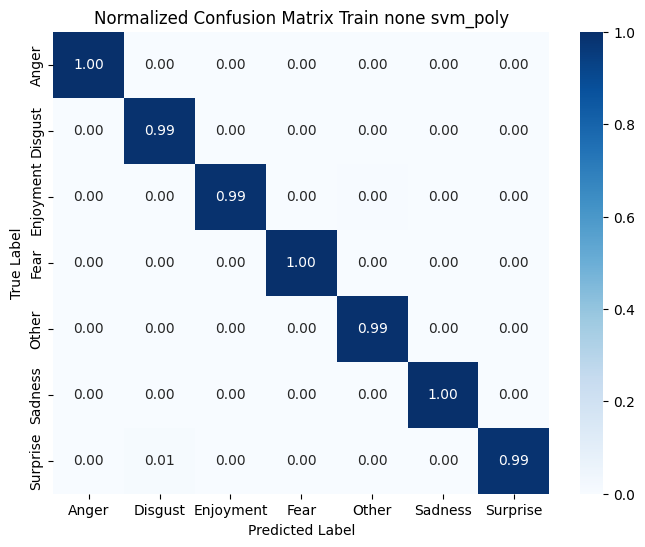

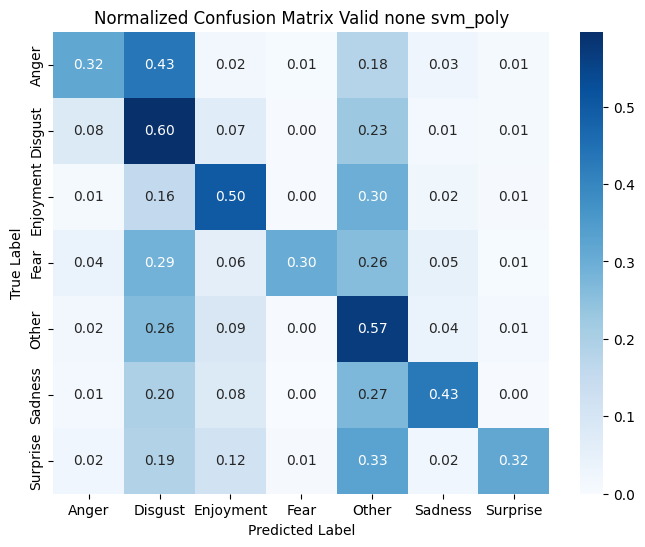

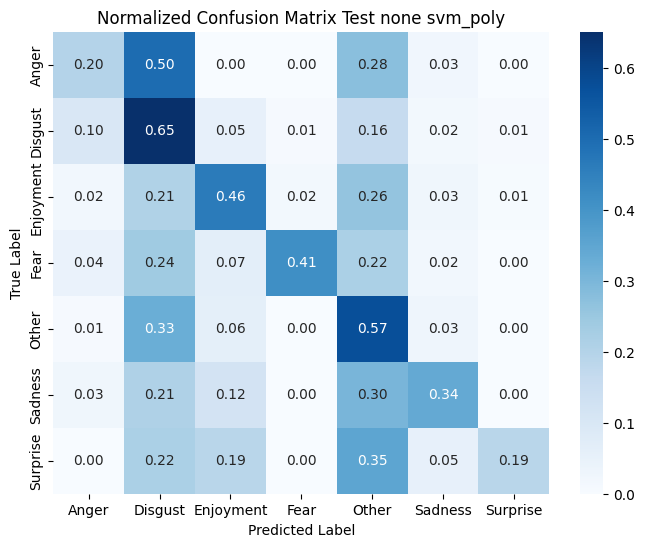

In [130]:
# SVM - poly - None (6:4)
model_64_svm_poly, train_64_svm_poly, valid_64_svm_poly, test_64_svm_poly, pred_64_svm_poly = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly = train_64_svm_poly[1], valid_64_svm_poly[1], test_64_svm_poly[1]
y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly = pred_64_svm_poly

pipeline_evaluation(
    y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly,
    y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.9788935792046212
Recall: 0.9788935792046212
Precision: 0.9790167570076942
F1-score: 0.978877151970857

--- valid --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.5251582805731423
Recall: 0.5251582805731423
Precision: 0.5646937155863049
F1-score: 0.5335696685339739

--- test --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.4898255813953488
Recall: 0.4898255813953488
Precision: 0.5477073840069905
F1-score: 0.5021749313469346


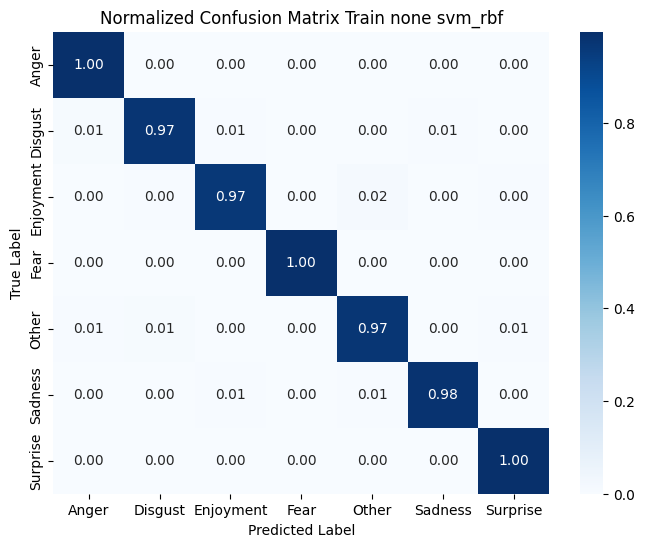

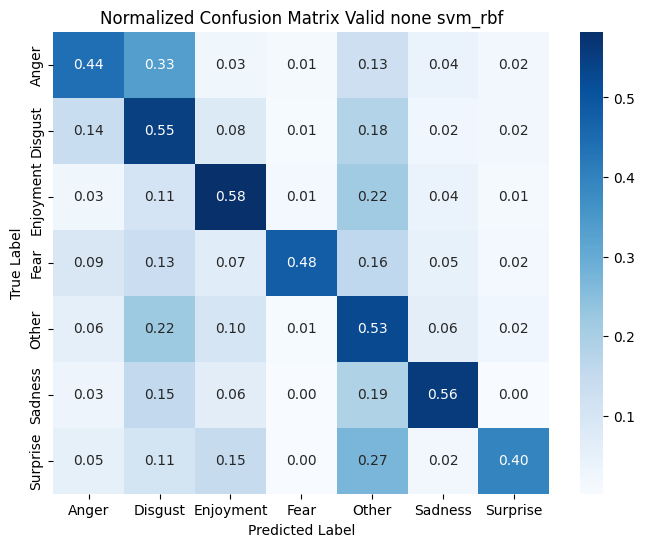

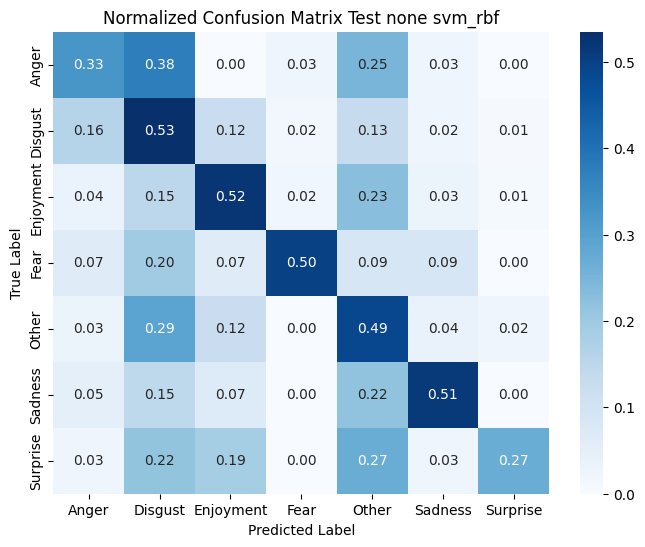

In [87]:
# SVM - rbf - None (6:4)
model_64_svm_rbf, train_64_svm_rbf, valid_64_svm_rbf, test_64_svm_rbf, pred_64_svm_rbf = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf = train_64_svm_rbf[1], valid_64_svm_rbf[1], test_64_svm_rbf[1]
y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf = pred_64_svm_rbf

pipeline_evaluation(
    y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf,
    y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.9089091313041546
Recall: 0.9089091313041546
Precision: 0.9100931425765895
F1-score: 0.9087314709823052

--- valid --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5284905031656114
Recall: 0.5284905031656114
Precision: 0.5250488093122603
F1-score: 0.5249006541111813

--- test --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5058139534883721
Recall: 0.5058139534883721
Precision: 0.5281266945753547
F1-score: 0.5115916430616304


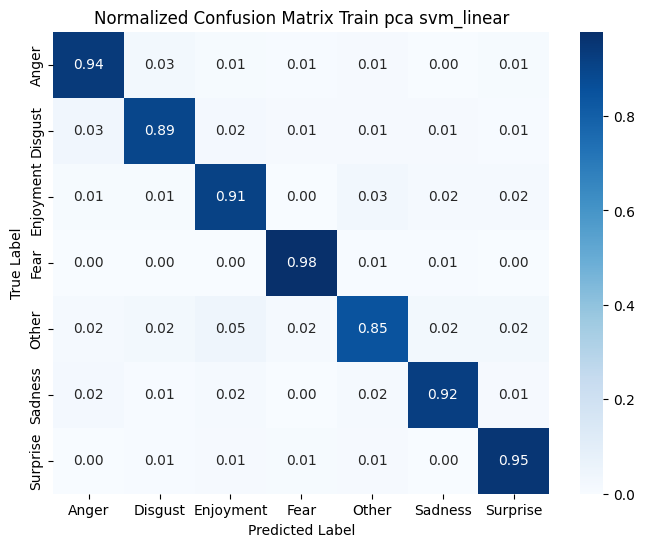

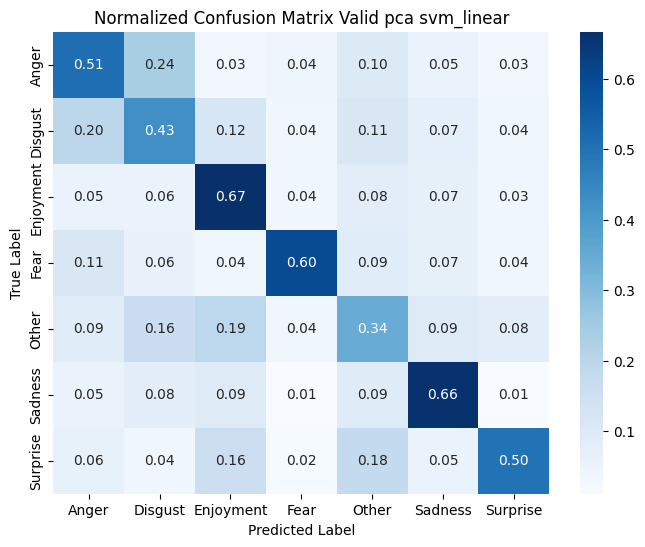

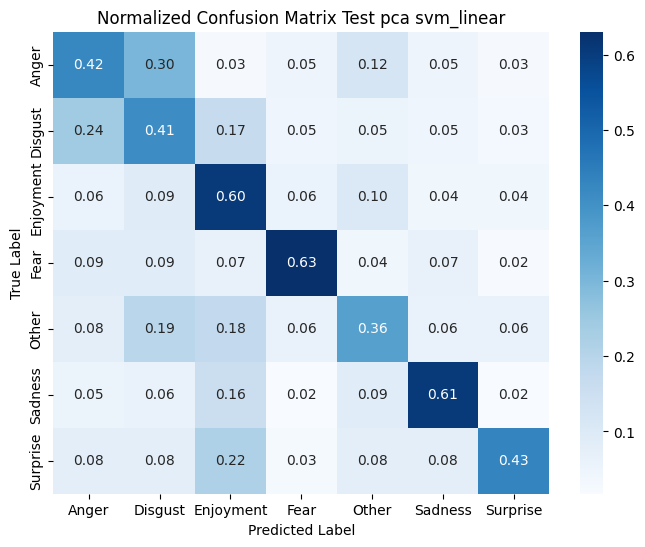

In [88]:
# SVM - linear - PCA (6:4)
model_pca_64_svm_linear, train_pca_64_svm_linear, valid_pca_64_svm_linear, test_pca_64_svm_linear, pred_pca_64_svm_linear = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear = train_pca_64_svm_linear[1], valid_pca_64_svm_linear[1], test_pca_64_svm_linear[1]
y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear = pred_pca_64_svm_linear

pipeline_evaluation(
    y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear,
    y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Pytho

--- train --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.16351921795156632
Recall: 0.16351921795156632
Precision: 0.3017278091888199
F1-score: 0.09952776363605043

--- valid --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.12562479173608798
Recall: 0.12562479173608798
Precision: 0.2860312577309025
F1-score: 0.044190686659860416

--- test --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.06686046511627906
Recall: 0.06686046511627906
Precision: 0.23742157130191638
F1-score: 0.023216443467780366


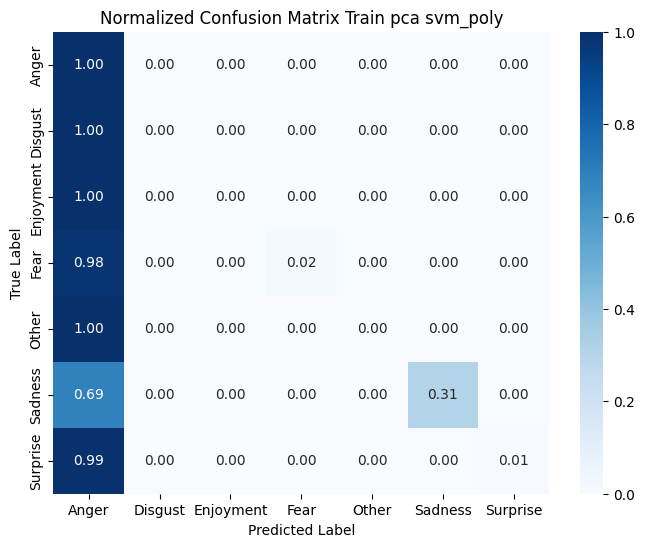

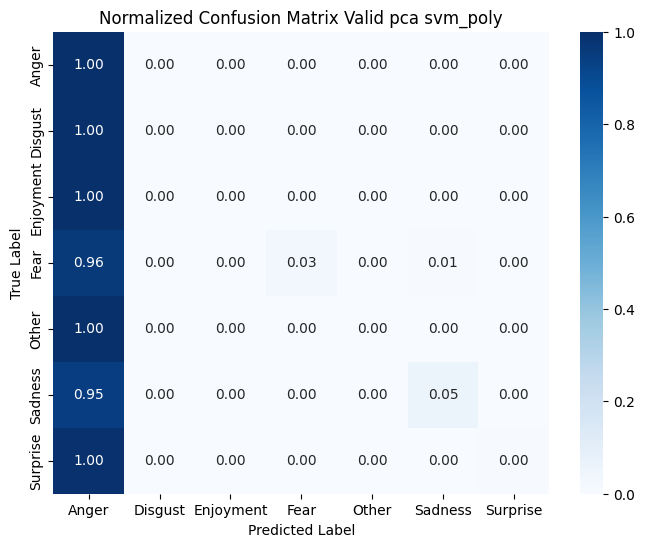

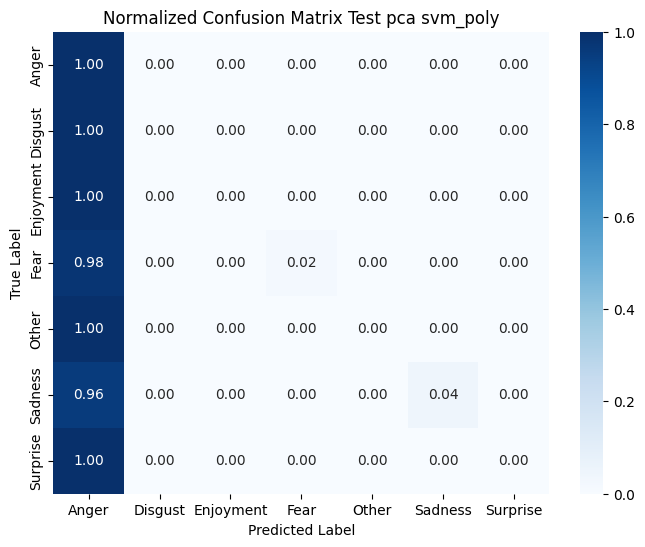

In [89]:
# SVM - poly - PCA (6:4)
model_pca_64_svm_poly, train_pca_64_svm_poly, valid_pca_64_svm_poly, test_pca_64_svm_poly, pred_pca_64_svm_poly = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly = train_pca_64_svm_poly[1], valid_pca_64_svm_poly[1], test_pca_64_svm_poly[1]
y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly = pred_pca_64_svm_poly

pipeline_evaluation(
    y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly,
    y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.9897800488780271
Recall: 0.9897800488780271
Precision: 0.9898470283577515
F1-score: 0.9897915864153154

--- valid --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.461512829056981
Recall: 0.461512829056981
Precision: 0.5598263968701147
F1-score: 0.4682448037630774

--- test --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.45058139534883723
Recall: 0.45058139534883723
Precision: 0.5494753535877233
F1-score: 0.4520033791703166


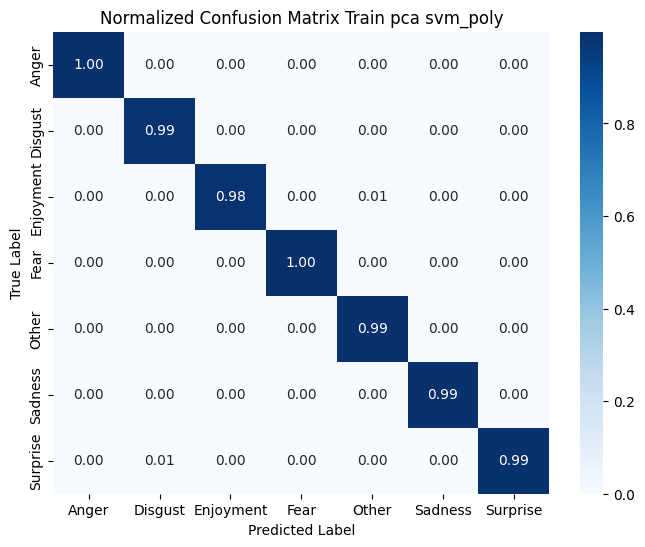

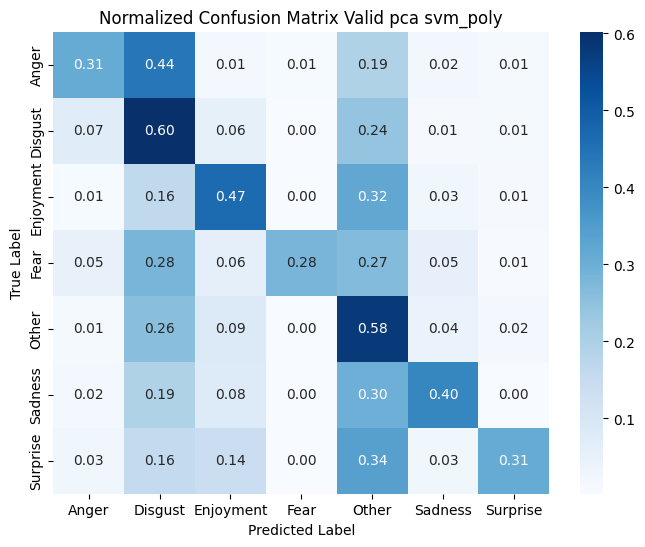

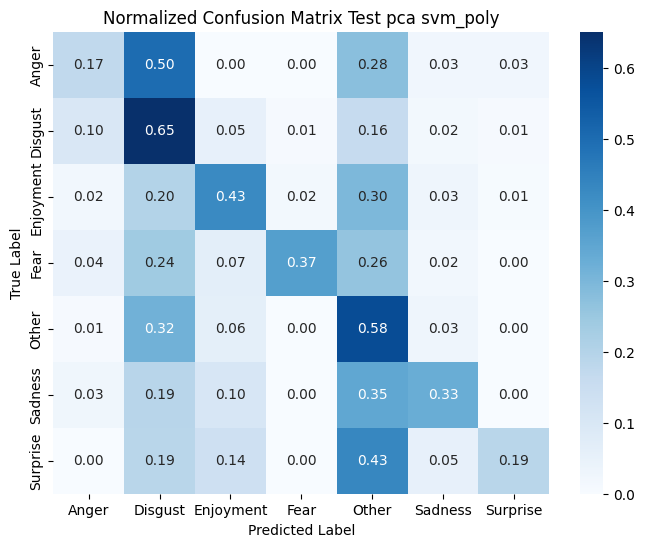

In [131]:
# SVM - poly - PCA (6:4)
model_pca_64_svm_poly, train_pca_64_svm_poly, valid_pca_64_svm_poly, test_pca_64_svm_poly, pred_pca_64_svm_poly = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly = train_pca_64_svm_poly[1], valid_pca_64_svm_poly[1], test_pca_64_svm_poly[1]
y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly = pred_pca_64_svm_poly

pipeline_evaluation(
    y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly,
    y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.9557876027549433
Recall: 0.9557876027549433
Precision: 0.9563466986293377
F1-score: 0.9557327794614975

--- valid --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.5208263912029324
Recall: 0.5208263912029324
Precision: 0.5524379593792808
F1-score: 0.5291578405288381

--- test --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.48691860465116277
Recall: 0.48691860465116277
Precision: 0.5404462831271928
F1-score: 0.5001578403118361


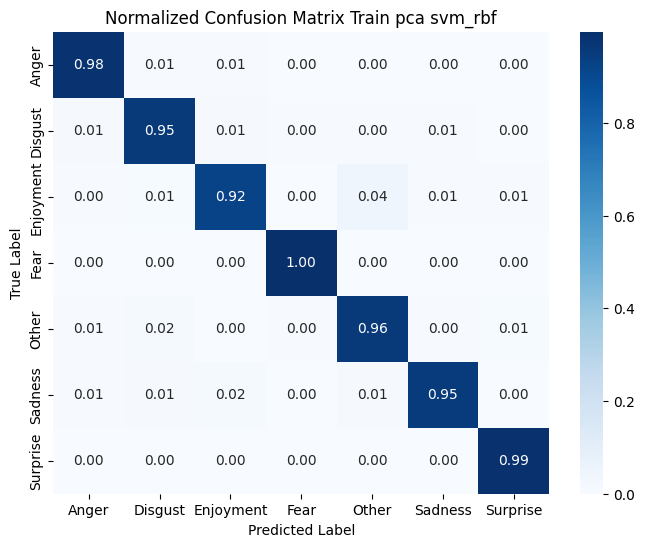

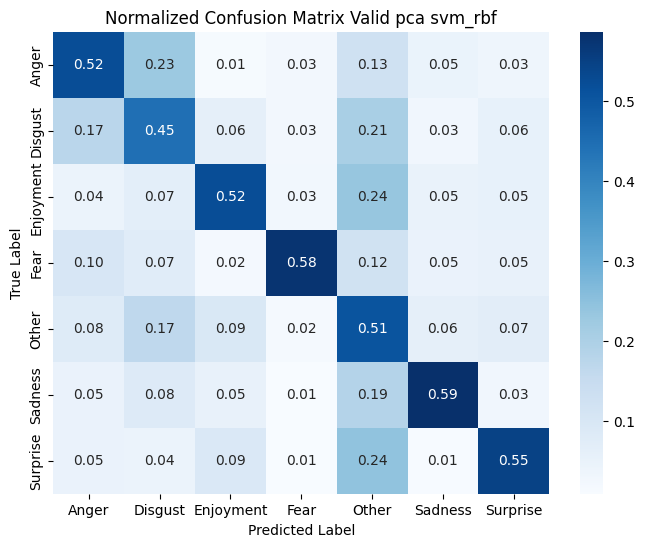

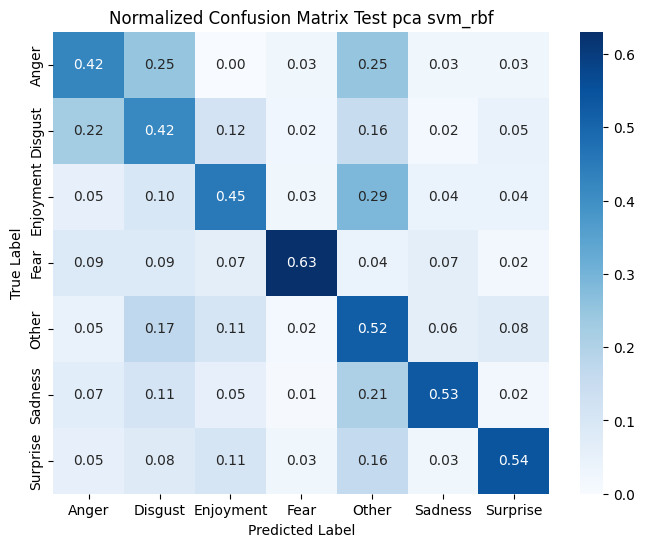

In [90]:
# SVM - rbf - PCA (6:4)
model_pca_64_svm_rbf, train_pca_64_svm_rbf, valid_pca_64_svm_rbf, test_pca_64_svm_rbf, pred_pca_64_svm_rbf = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf = train_pca_64_svm_rbf[1], valid_pca_64_svm_rbf[1], test_pca_64_svm_rbf[1]
y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf = pred_pca_64_svm_rbf

pipeline_evaluation(
    y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf,
    y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


--- train --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.9982226171961787
Recall: 0.9982226171961787
Precision: 0.9982333049781962
F1-score: 0.9982252290461872

--- valid --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.2619126957680773
Recall: 0.2619126957680773
Precision: 0.3091672084969452
F1-score: 0.257100862992089

--- test --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.28924418604651164
Recall: 0.28924418604651164
Precision: 0.3812945888489271
F1-score: 0.2899044493754522


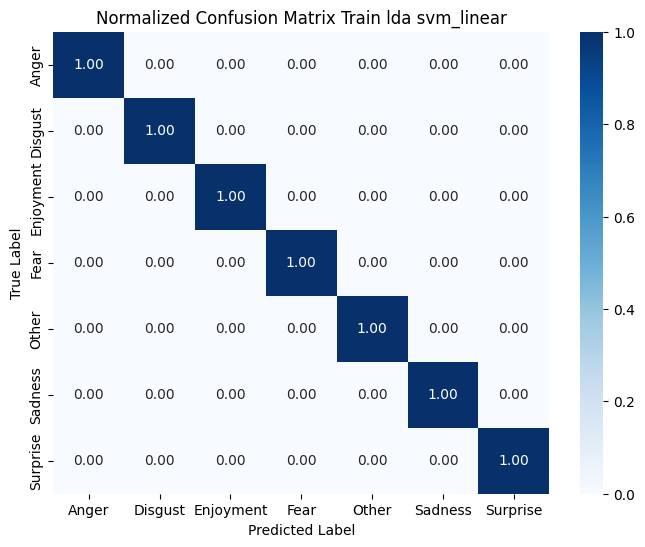

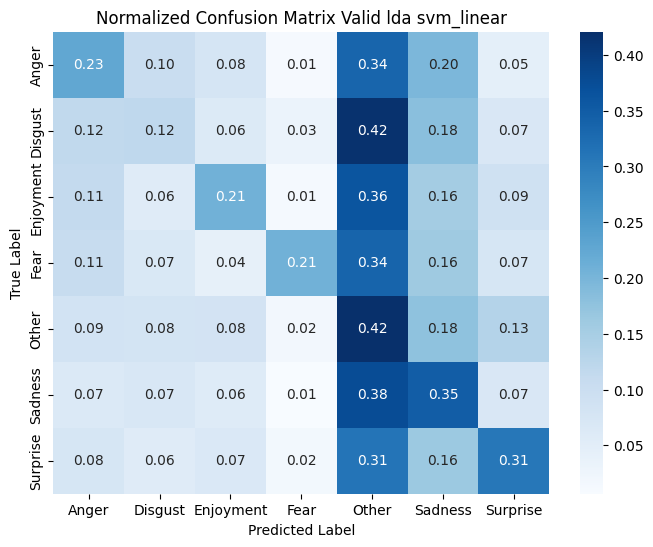

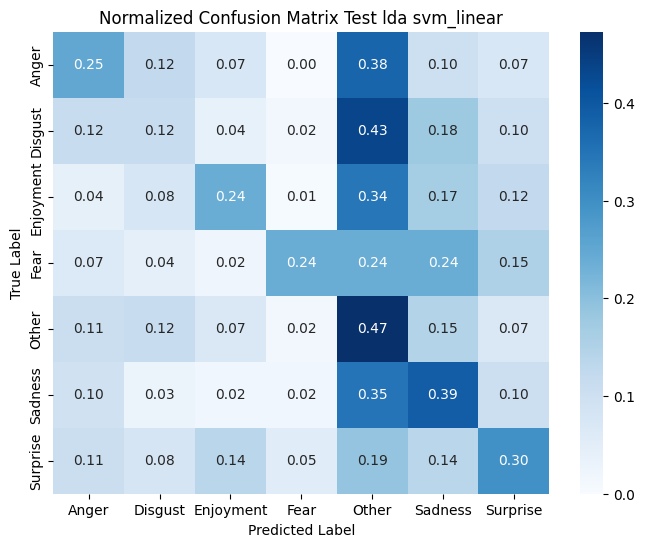

In [91]:
# SVM - linear - LDA (6:4)
model_lda_64_svm_linear, train_lda_64_svm_linear, valid_lda_64_svm_linear, test_lda_64_svm_linear, pred_lda_64_svm_linear = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear = train_lda_64_svm_linear[1], valid_lda_64_svm_linear[1], test_lda_64_svm_linear[1]
y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear = pred_lda_64_svm_linear

pipeline_evaluation(
    y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear,
    y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.998000444345701
Recall: 0.998000444345701
Precision: 0.9980319993302614
F1-score: 0.9980061724852948

--- valid --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.22292569143618793
Recall: 0.22292569143618793
Precision: 0.24515706486352254
F1-score: 0.2201831733141969

--- test --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.2238372093023256
Recall: 0.2238372093023256
Precision: 0.2722889842711195
F1-score: 0.22682813281791292


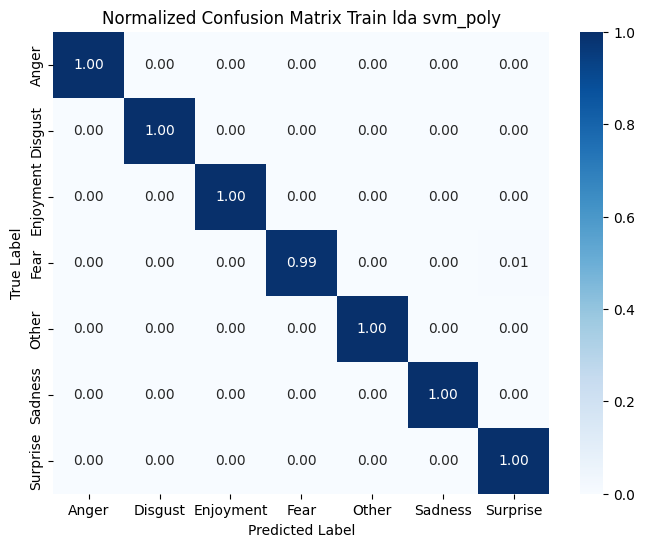

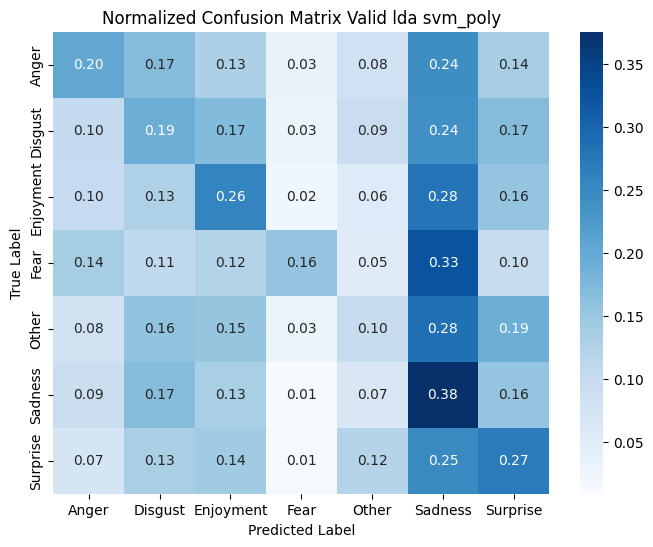

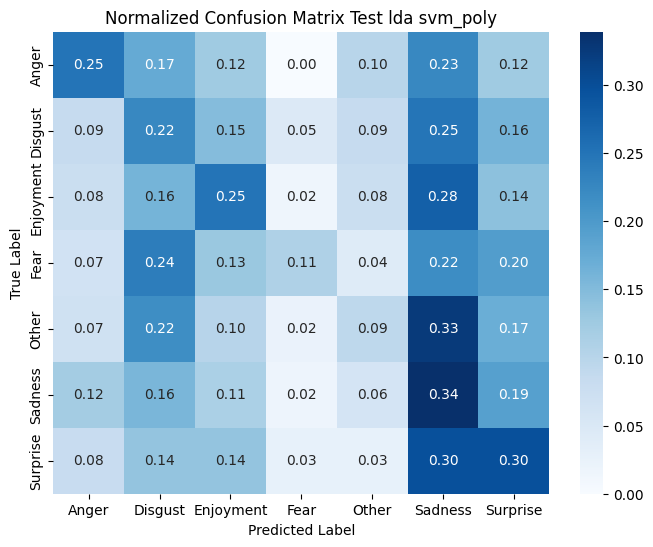

In [92]:
# SVM - poly - LDA (6:4)
model_lda_64_svm_poly, train_lda_64_svm_poly, valid_lda_64_svm_poly, test_lda_64_svm_poly, pred_lda_64_svm_poly = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.1, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly = train_lda_64_svm_poly[1], valid_lda_64_svm_poly[1], test_lda_64_svm_poly[1]
y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly = pred_lda_64_svm_poly

pipeline_evaluation(
    y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly,
    y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

**C = 1.0**

--- train --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.9977782714952232
Recall: 0.9977782714952232
Precision: 0.997842114268349
F1-score: 0.9977918438912591

--- valid --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.21226257914028657
Recall: 0.21226257914028657
Precision: 0.23990975698035877
F1-score: 0.2059721692345909

--- test --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.21220930232558138
Recall: 0.21220930232558138
Precision: 0.29133791812747484
F1-score: 0.21407935660099506


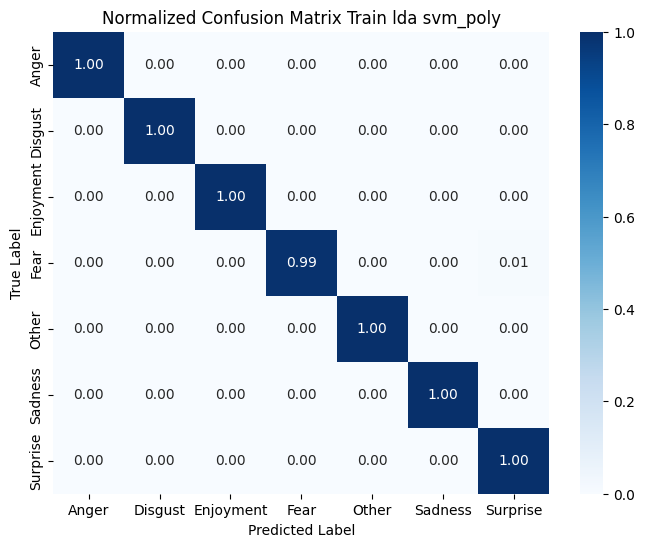

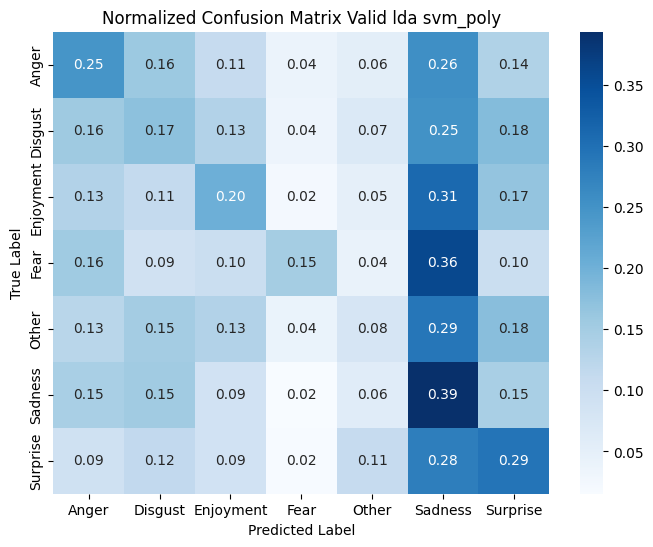

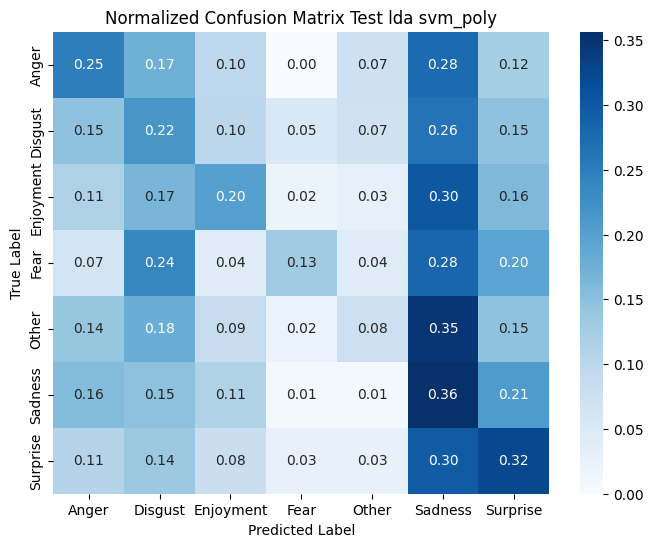

In [125]:
# SVM - poly - LDA (6:4)
model_lda_64_svm_poly, train_lda_64_svm_poly, valid_lda_64_svm_poly, test_lda_64_svm_poly, pred_lda_64_svm_poly = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly = train_lda_64_svm_poly[1], valid_lda_64_svm_poly[1], test_lda_64_svm_poly[1]
y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly = pred_lda_64_svm_poly

pipeline_evaluation(
    y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly,
    y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.998000444345701
Recall: 0.998000444345701
Precision: 0.9980216574899528
F1-score: 0.9980053566453645

--- valid --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.07997334221926025
Recall: 0.07997334221926025
Precision: 0.36158346202741887
F1-score: 0.022177709168623886

--- test --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.055232558139534885
Recall: 0.055232558139534885
Precision: 0.08647620177639162
F1-score: 0.008361643288787938


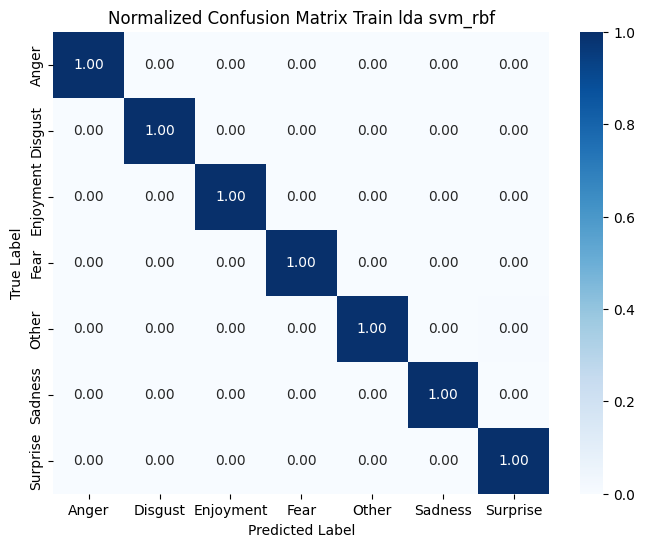

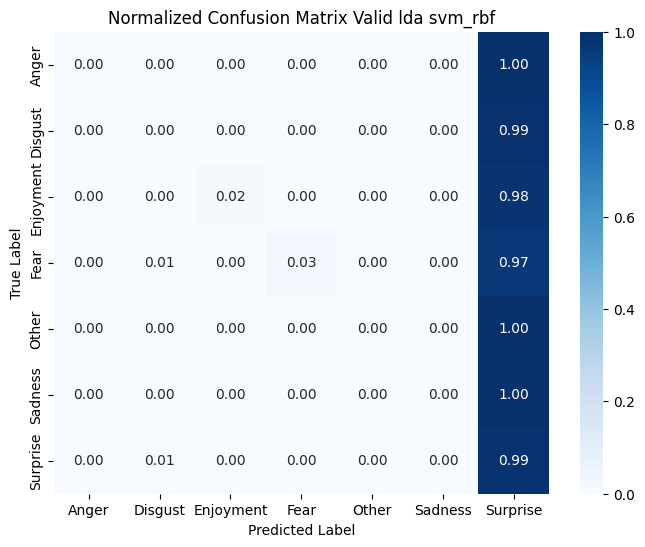

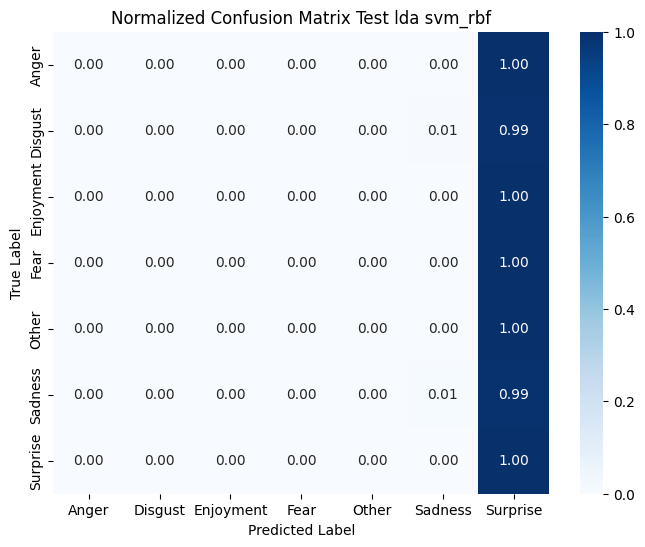

In [93]:
# SVM - rbf - LDA (6:4)
model_lda_64_svm_rbf, train_lda_64_svm_rbf, valid_lda_64_svm_rbf, test_lda_64_svm_rbf, pred_lda_64_svm_rbf = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf = train_lda_64_svm_rbf[1], valid_lda_64_svm_rbf[1], test_lda_64_svm_rbf[1]
y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf = pred_lda_64_svm_rbf

pipeline_evaluation(
    y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf,
    y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Xem kết quả dự đoán cho từng nhãn

In [94]:
from sklearn.metrics import classification_report

print(classification_report(y_test_73, y_pred_test_73, digits=4))

              precision    recall  f1-score   support

       Anger     0.2118    0.4500    0.2880        40
     Disgust     0.4516    0.4341    0.4427       129
   Enjoyment     0.6570    0.5885    0.6209       192
        Fear     0.5455    0.6522    0.5941        46
       Other     0.5104    0.3798    0.4356       129
     Sadness     0.7143    0.6522    0.6818       115
    Surprise     0.3725    0.5135    0.4318        37

    accuracy                         0.5233       688
   macro avg     0.4947    0.5243    0.4993       688
weighted avg     0.5519    0.5233    0.5316       688



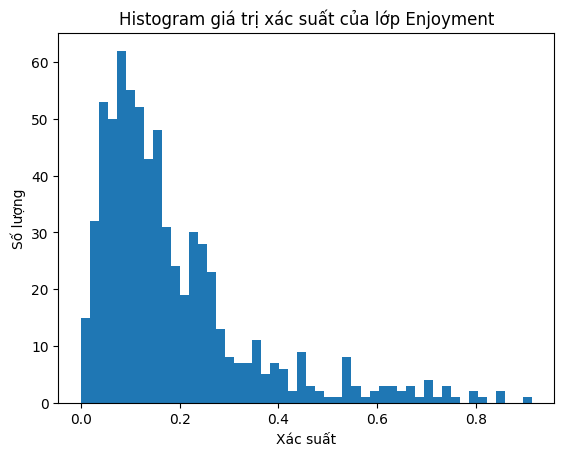

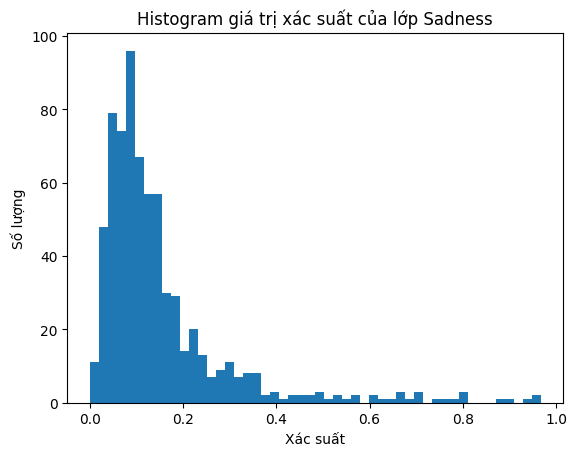

In [95]:
def plot_score_hist(model, X, label_name):
    scores = model.predict_proba(X)       # Trả về giá trị hàm quyết định
    classes = list(model.classes_)       # Các lớp của mô hình 

    # Lấy index của lớp lable_name
    idx = classes.index(label_name)
    
    # Lấy ra cột score của nhãn label_name 
    score = scores[:, idx]  

    plt.figure()
    plt.hist(score, bins=50)
    plt.title(f"Histogram giá trị xác suất của lớp {label_name}")
    plt.xlabel("Xác suất")
    plt.ylabel("Số lượng")
    plt.show()
    
    return score
    
# Chọn 1 mô hình bất kì   
model = model_82         # model logistic regression đã huấn luyện
X_test_processed, y_test = test_82

score_enj = plot_score_hist(model, X_test_processed, "Enjoyment")
score_sad = plot_score_hist(model, X_test_processed, "Sadness")

Nhận xét: 


- Lớp Enjoyment có F1 cao nhất và số lượng nhãn lớn nhất => Ổn định, ít nhiễu hơn và ít giao động khi chia tập DL 

- Dựa vào histogram ta thấy phân bố của lớp Enjoyment khá mượt và trải rộng => có nhiều mức điểm khác nhau cho mô hình ==> phù hợp làm đầu ra hồi quy

- Lớp Sadness cũng là một sự lựa chọn ổn, tuy nhiên phân bố không quá đẹp, không ổn định bằng Enjoyment và F1-Score của 2 lớp này cũng không chênh lệch nhiều

=> Chọn đầu ra hồi quy là giá trị hàm quyết định của lớp Enjoyment

## Tong hop ket qua

In [132]:
# Tổng hợp kết quả từ các cell output đã chạy
import pandas as pd
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns

def extract_results_from_notebook(notebook_path=None):
    """Trích xuất kết quả từ notebook JSON"""
    import os
    
    # Tự động tìm file notebook hiện tại
    if notebook_path is None:
        # Thử các đường dẫn có thể
        possible_paths = [
            'modeling_merged.ipynb',
            'src/modeling_merged.ipynb',
            '../src/modeling_merged.ipynb',
            os.path.abspath(__file__.replace('.py', '.ipynb')) if '__file__' in globals() else None
        ]
        
        for path in possible_paths:
            if path and os.path.exists(path):
                notebook_path = path
                break
        
        if notebook_path is None:
            raise FileNotFoundError("Không tìm thấy file notebook. Vui lòng chỉ định đường dẫn.")
    
    results = []
    
    with open(notebook_path, 'r', encoding='utf-8') as f:
        notebook = json.load(f)
    
    # Pattern để parse output - lấy kết quả từ cả train, valid và test
    pattern = r'--- (train|valid|test) --- (\d+):(\d+) --- ([^-]+) --- ([^-]+) ---\s+Accuracy: ([\d.]+)\s+Recall: ([\d.]+)\s+Precision: ([\d.]+)\s+F1-score: ([\d.]+)'
    
    for cell in notebook['cells']:
        if 'outputs' in cell:
            for output in cell['outputs']:
                if 'text' in output:
                    text = ''.join(output['text'])
                    
                    # Tìm tất cả các kết quả trong output
                    matches = re.findall(pattern, text)
                    
                    for match in matches:
                        dataset, train_size, valid_size, model_type, discriminant, acc, recall, prec, f1 = match
                        
                        results.append({
                            'Dataset': dataset.strip().upper(),  # TRAIN, VALID, hoặc TEST
                            'Model': model_type.strip(),
                            'Train:Valid': f'{train_size}:{valid_size}',
                            'Discriminant': discriminant.strip().upper(),
                            'Accuracy': float(acc),
                            'Precision': float(prec),
                            'Recall': float(recall),
                            'F1-Score': float(f1)
                        })
    
    return pd.DataFrame(results)

# Trích xuất và tổng hợp
try:
    results_df = extract_results_from_notebook()
    
    # Loại bỏ duplicate (nếu có)
    results_df = results_df.drop_duplicates(subset=['Dataset', 'Model', 'Train:Valid', 'Discriminant']).reset_index(drop=True)
    
    # Sắp xếp: Dataset (TEST > VALID > TRAIN), sau đó F1-Score giảm dần
    dataset_order = {'TEST': 0, 'VALID': 1, 'TRAIN': 2}
    results_df['Dataset_Order'] = results_df['Dataset'].map(dataset_order)
    results_df = results_df.sort_values(['Dataset_Order', 'F1-Score'], ascending=[True, False]).reset_index(drop=True)
    results_df = results_df.drop('Dataset_Order', axis=1)
    
    print("=" * 120)
    print("TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)")
    print("=" * 120)
    print()
    
    # Hiển thị bảng đầy đủ
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)
    print(results_df.to_string(index=False))
    
    print()
    print("=" * 120)
    print(f"Tổng số kết quả: {len(results_df)}")
    
    # Thống kê theo từng dataset
    for dataset in ['TRAIN', 'VALID', 'TEST']:
        df_dataset = results_df[results_df['Dataset'] == dataset]
        if len(df_dataset) > 0:
            best = df_dataset.iloc[0]
            print(f"\n{dataset} SET - Mô hình tốt nhất (F1-Score):")
            print(f"  Model: {best['Model']} - {best['Discriminant']} - {best['Train:Valid']}")
            print(f"  F1-Score: {best['F1-Score']:.4f} | Accuracy: {best['Accuracy']:.4f} | Precision: {best['Precision']:.4f} | Recall: {best['Recall']:.4f}")
    
    print("=" * 120)
    
except Exception as e:
    print(f"Lỗi khi đọc notebook: {e}")
    print("Vui lòng đảm bảo các cell đã được chạy và có output.")
    import traceback
    traceback.print_exc()

TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)

Dataset               Model Train:Valid Discriminant  Accuracy  Precision   Recall  F1-Score
   TEST logistic_regression         8:2         NONE  0.531977   0.559946 0.531977  0.538903
   TEST logistic_regression         8:2          PCA  0.529070   0.560197 0.529070  0.536957
   TEST logistic_regression         7:3         NONE  0.523256   0.545833 0.523256  0.529408
   TEST          svm_linear         7:3          PCA  0.521802   0.532052 0.521802  0.524335
   TEST logistic_regression         6:4          PCA  0.515988   0.537127 0.515988  0.521949
   TEST          svm_linear         8:2          PCA  0.518895   0.532472 0.518895  0.521925
   TEST          svm_linear         8:2         NONE  0.518895   0.530733 0.518895  0.521717
   TEST logistic_regression         7:3          PCA  0.514535   0.537554 0.514535  0.520260
   TEST logistic_regression         6:4         NONE  0.510174   0.531422 0.510174  0.516461
   TEST

In [97]:
from sklearn.metrics import classification_report, accuracy_score, f1_score
import pandas as pd
import numpy as np

def evaluate_by_groups(y_true, y_pred, label_mapping=None):
    """
    Đánh giá mô hình dựa trên việc gom nhóm các nhãn.
    
    Args:
        y_true: Danh sách nhãn thực tế (7 nhãn gốc)
        y_pred: Danh sách nhãn dự đoán (7 nhãn gốc)
        label_mapping: Dictionary map từ nhãn gốc sang nhóm (Common, Medium, Rare)
    """
    
    # 1. Cấu hình mapping mặc định (BẠN CẦN SỬA LẠI CHO ĐÚNG ID CỦA BẠN)
    if label_mapping is None:
        # Ví dụ: Giả sử nhãn 0,1 là Common; 2,3 là Medium; 4,5,6 là Rare
        label_mapping = {
            'Enjoyment': 'Common', 
            'Other': 'Medium', 
            'Sadness': 'Medium', 
            'Disgust': 'Medium', 
            'Fear': 'Rare', 
            'Surprise': 'Rare', 
            'Anger': 'Rare'
        }
    
    # 2. Chuyển đổi nhãn gốc sang nhãn nhóm
    # Dùng map để chuyển đổi, nếu nhãn không có trong map thì giữ nguyên hoặc gán 'Unknown'
    y_true_grouped = [label_mapping.get(y, 'Unknown') for y in y_true]
    y_pred_grouped = [label_mapping.get(y, 'Unknown') for y in y_pred]
    
    # 3. Tính toán metrics cho các nhóm
    acc = accuracy_score(y_true_grouped, y_pred_grouped)
    # Tính F1 trung bình (weighted để cân bằng theo số lượng mẫu của từng nhóm)
    f1_weighted = f1_score(y_true_grouped, y_pred_grouped, average='weighted')
    
    # 4. In báo cáo chi tiết
    print("="*60)
    print("ĐÁNH GIÁ THEO NHÓM (COMMON - MEDIUM - RARE)")
    print("="*60)
    print(f"Group Accuracy: {acc:.4f}")
    print(f"Group F1-Score (Weighted): {f1_weighted:.4f}")
    print("-" * 60)
    print("Chi tiết từng nhóm:")
    print(classification_report(y_true_grouped, y_pred_grouped, digits=4))
    print("="*60)
    
    return acc, f1_weighted

# --- HƯỚNG DẪN SỬ DỤNG ---

# 1. Định nghĩa mapping chính xác của bạn (QUAN TRỌNG)
# Bạn thay số 0, 1, 2... bằng tên nhãn hoặc ID thực tế trong dữ liệu của bạn
my_mapping = {
            'Enjoyment': 'Common', 
            'Other': 'Medium', 
            'Sadness': 'Medium', 
            'Disgust': 'Medium', 
            'Fear': 'Rare', 
            'Surprise': 'Rare', 
            'Anger': 'Rare'
        }

# 2. Gọi hàm này sau khi bạn đã có kết quả dự đoán từ model
# Ví dụ: sau dòng y_pred = model.predict(X_test)
evaluate_by_groups(y_test, y_pred_test_82_svm_linear, label_mapping=my_mapping)

ĐÁNH GIÁ THEO NHÓM (COMMON - MEDIUM - RARE)
Group Accuracy: 0.6483
Group F1-Score (Weighted): 0.6544
------------------------------------------------------------
Chi tiết từng nhóm:
              precision    recall  f1-score   support

      Common     0.6477    0.6510    0.6494       192
      Medium     0.7531    0.6542    0.7001       373
        Rare     0.4503    0.6260    0.5238       123

    accuracy                         0.6483       688
   macro avg     0.6170    0.6437    0.6244       688
weighted avg     0.6695    0.6483    0.6544       688



(0.6482558139534884, 0.6544439115820619)

In [98]:
print(classification_report(y_test, y_pred_test_82_svm_linear, digits=4))

              precision    recall  f1-score   support

       Anger     0.2432    0.4500    0.3158        40
     Disgust     0.4844    0.4806    0.4825       129
   Enjoyment     0.6477    0.6510    0.6494       192
        Fear     0.5593    0.7174    0.6286        46
       Other     0.4896    0.3643    0.4178       129
     Sadness     0.7300    0.6348    0.6791       115
    Surprise     0.4474    0.4595    0.4533        37

    accuracy                         0.5451       688
   macro avg     0.5145    0.5368    0.5181       688
weighted avg     0.5610    0.5451    0.5483       688



# Chuyển bài toán sang hồi quy


## Các hàm xử lý cho hồi quy

In [99]:
import numpy as np
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA


### Hàm lấy softmax probability của lớp Enjoyment


In [100]:
def get_enjoyment_score(model, X_data):

    # Lấy tất cả softmax probabilities cho tất cả các lớp
    probabilities = model.predict_proba(X_data)  # Shape: (n_samples, n_classes)
    
    # Tìm index của lớp Enjoyment
    classes = list(model.classes_)
    idx_enjoyment = classes.index("Enjoyment")
    
    # Lấy cột probability của lớp Enjoyment
    prob_enjoyment = probabilities[:, idx_enjoyment]
    
    return prob_enjoyment


### Hàm đánh giá mô hình hồi quy (MSE, MAE, R2)


In [101]:
def evaluate_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    return {"MSE": mse, "MAE": mae, "R2": r2}


### Hồi quy tuyến tính (L2 regularization)


In [102]:
# alpha: hệ số regularization
def train_ridge(X_train, y_train, alpha=1.0, random_state=11):
    ridge = Ridge(alpha=alpha, random_state=random_state)
    ridge.fit(X_train, y_train)
    return ridge


### KNN


In [103]:
def train_knn_regressor(X_train, y_train, metric='cosine', n_jobs=-1):
    k = int(np.sqrt(len(X_train)))
    knn = KNeighborsRegressor(n_neighbors=k, metric=metric, n_jobs=n_jobs)
    knn.fit(X_train, y_train)
    return knn


### Hàm lựa chọn mô hình hồi quy


Hệ số cho mô hình
- model_type: loại mô hình
- alpha: hệ số regularization 
- metric: metric của KNN (cosine,...)

In [104]:
def use_regression_model(model_type, X_train, y_train, alpha=1.0, metric='cosine'):
    if model_type == "ridge":
        return train_ridge(X_train, y_train, alpha=alpha)
    elif model_type == "knn":
        return train_knn_regressor(X_train, y_train, metric=metric)
    else:
        raise ValueError(f"Unknown model_type: {model_type}. Use 'ridge' or 'knn'")


### Hàm dự đoán hồi quy


In [105]:
def predict_regression(model, X_train, X_valid, X_test):
    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    return y_pred_train, y_pred_valid, y_pred_test


### Hàm chuẩn bị dữ liệu 

- Input là dữ liệu sau TF-IDF của model lựa chọn (model đã trả về dữ liệu này)
- Lấy softmax probabilities từ model có kết quả phân loại tốt nhất (chọn model_73)
- Áp dụng PCA (1/3, tùy chọn)

In [106]:
def prepare_data_for_regression(classification_model, X_train_valid, X_test, 
                                 y_train_valid, y_test,
                                 train_size=7, valid_size=3,
                                 discriminant="none", n_components_pca=None, random_state=11):

    
    # 1. Lấy giá trị softmax probalilities từ classification_model cho train_valid và test
    z_train_valid = get_enjoyment_score(classification_model, X_train_valid)
    z_test = get_enjoyment_score(classification_model, X_test)
    
    # 2. Chia train_valid
    print(f"Tỉ lệ train - valid {train_size}:{valid_size}")
    X_train_reg, X_valid_reg, z_train_reg, z_valid_reg = train_test_split(
        X_train_valid, z_train_valid,
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=y_train_valid 
    )
    
    # 3. Giảm chiều (1/3, tùy chọn)
    if discriminant == 'pca':
        if n_components_pca is None:
            n_components_pca = max(1, int(X_train_reg.shape[1] / 3))
        
        print(f'PCA: {X_train_reg.shape[1]} -> {n_components_pca} chiều')
        pca_reducer = PCA(n_components=n_components_pca, random_state=random_state)
        X_train_processed = pca_reducer.fit_transform(X_train_reg)
        X_valid_processed = pca_reducer.transform(X_valid_reg)
        X_test_processed = pca_reducer.transform(X_test)
        
        print(f'PCA explained variance ratio: {pca_reducer.explained_variance_ratio_.sum():.4f}')
        discriminant_model = pca_reducer
    else:
        X_train_processed = X_train_reg
        X_valid_processed = X_valid_reg
        X_test_processed = X_test
        discriminant_model = None
    
    return (X_train_processed, X_valid_processed, X_test_processed,
            z_train_reg, z_valid_reg, z_test,
            discriminant_model)

## Pipeline hồi quy


In [107]:
def pipeline_regression(X_train, X_valid, X_test, z_train, z_valid, z_test,
                        regression_model_type='ridge', alpha=1.0, metric='cosine',
                        random_state=11):

    # Đặt lại tên cho tường minh
    X_reg_train, y_reg_train = X_train, z_train
    X_reg_valid, y_reg_valid = X_valid, z_valid
    X_reg_test, y_reg_test = X_test, z_test

    print(f'Tập hồi quy - Train: {X_reg_train.shape}, Valid: {X_reg_valid.shape}, Test: {X_reg_test.shape}')
    print()

    # Huấn luyện mô hình hồi quy
    regression_model = use_regression_model(regression_model_type, X_reg_train, y_reg_train,
                                            alpha=alpha, metric=metric)

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict_regression(
        regression_model, X_reg_train, X_reg_valid, X_reg_test
    )

    # Đánh giá mô hình
    metrics_train = evaluate_regression(y_reg_train, y_pred_train)
    metrics_valid = evaluate_regression(y_reg_valid, y_pred_valid)
    metrics_test = evaluate_regression(y_reg_test, y_pred_test)

    return (regression_model,
            (X_reg_train, X_reg_valid, X_reg_test),
            (y_reg_train, y_reg_valid, y_reg_test),
            (y_pred_train, y_pred_valid, y_pred_test),
            (metrics_train, metrics_valid, metrics_test))


## Hàm đánh giá và hiển thị kết quả


In [108]:
def pipeline_evaluation_regression(metrics_train, metrics_valid, metrics_test,
                                   regression_model_type, discriminant, data_type=""):
    print(f"=== {regression_model_type.upper()} Regression - {discriminant.upper()} {data_type} ===")
    print()
    
    print("--- Train ---")
    print(f"MSE = {metrics_train['MSE']:.6f}")
    print(f"MAE = {metrics_train['MAE']:.6f}")
    print(f"R2  = {metrics_train['R2']:.6f}")
    print()
    
    print("--- Valid ---")
    print(f"MSE = {metrics_valid['MSE']:.6f}")
    print(f"MAE = {metrics_valid['MAE']:.6f}")
    print(f"R2  = {metrics_valid['R2']:.6f}")
    print()
    
    print("--- Test ---")
    print(f"MSE = {metrics_test['MSE']:.6f}")
    print(f"MAE = {metrics_test['MAE']:.6f}")
    print(f"R2  = {metrics_test['R2']:.6f}")
    print()
    print("=" * 80)
    print()


## Tạo bộ dữ liệu hồi quy

In [109]:
import numpy as np

In [110]:
X_train_73_reg = train_73[0]
X_valid_73_reg = valid_73[0]
X_test_reg = test_73[0]
y_train_73_cls = train_73[1]
y_valid_73_cls = valid_73[1]
y_test_cls = test_73[1]

# Gộp train và valid thành train_valid
X_train_valid_reg = np.vstack([X_train_73_reg, X_valid_73_reg])
y_train_valid_reg = np.concatenate([y_train_73_cls, y_valid_73_cls])

print("============== Kích thước ===============")
print(f"train_valid: {X_train_valid_reg.shape}, test: {X_test_reg.shape}")
print(f"labels train_valid: {y_train_valid_reg.shape}, test: {y_test_cls.shape}")

============== Kích thước ===============
train_valid: (7502, 8000), test: (688, 8000)
labels train_valid: (7502,), test: (688,)


## Train:Validation = 8:2

### Hồi quy tuyến tính (Ridge L2)

#### Dữ liệu gốc

In [111]:
X_train_reg_82, X_valid_reg_82, X_test_reg_82, \
z_train_reg_82, z_valid_reg_82, z_test_reg_82, disc_model_reg_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_82_model, X_reg_82, y_reg_82, y_pred_ridge_82, metrics_ridge_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_82[0], metrics_ridge_82[1], metrics_ridge_82[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
Tập hồi quy - Train: (6001, 8000), Valid: (1501, 8000), Test: (688, 8000)

=== RIDGE Regression - NONE (8:2) ===

--- Train ---
MSE = 0.001085
MAE = 0.024218
R2  = 0.953807

--- Valid ---
MSE = 0.002151
MAE = 0.033839
R2  = 0.903598

--- Test ---
MSE = 0.001715
MAE = 0.028813
R2  = 0.924092




#### Dữ liệu PCA

In [112]:
X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82, \
z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82, disc_model_reg_pca_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 rồi nên không cần nữa
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_82_model, X_reg_pca_82, y_reg_pca_82, y_pred_ridge_pca_82, metrics_ridge_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_82[0], metrics_ridge_pca_82[1], metrics_ridge_pca_82[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
PCA: 8000 -> 2666 chiều
PCA explained variance ratio: 0.9139
Tập hồi quy - Train: (6001, 2666), Valid: (1501, 2666), Test: (688, 2666)

=== RIDGE Regression - PCA (8:2) ===

--- Train ---
MSE = 0.001263
MAE = 0.026318
R2  = 0.946202

--- Valid ---
MSE = 0.002238
MAE = 0.034708
R2  = 0.899678

--- Test ---
MSE = 0.001758
MAE = 0.029099
R2  = 0.922177




### KNN

#### Bộ dữ liệu không giảm chiều 

In [113]:
# KNN / None
knn_82_model, X_reg_82_knn, y_reg_82_knn, y_pred_knn_82, metrics_knn_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_82[0], metrics_knn_82[1], metrics_knn_82[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(8:2)"
)

Tập hồi quy - Train: (6001, 8000), Valid: (1501, 8000), Test: (688, 8000)

=== KNN Regression - NONE (8:2) ===

--- Train ---
MSE = 0.009486
MAE = 0.073777
R2  = 0.595986

--- Valid ---
MSE = 0.009230
MAE = 0.072659
R2  = 0.586232

--- Test ---
MSE = 0.008998
MAE = 0.067903
R2  = 0.601694




In [114]:
# KNN / PCA
knn_pca_82_model, X_reg_pca_82_knn, y_reg_pca_82_knn, y_pred_knn_pca_82, metrics_knn_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_82[0], metrics_knn_pca_82[1], metrics_knn_pca_82[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(8:2)"
)

Tập hồi quy - Train: (6001, 2666), Valid: (1501, 2666), Test: (688, 2666)

=== KNN Regression - PCA (8:2) ===

--- Train ---
MSE = 0.009556
MAE = 0.073795
R2  = 0.592996

--- Valid ---
MSE = 0.009274
MAE = 0.072447
R2  = 0.584267

--- Test ---
MSE = 0.009040
MAE = 0.067688
R2  = 0.599848




## Train:Validation = 7:3

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [115]:
# Chuẩn bị dữ liệu
X_train_reg_73, X_valid_reg_73, X_test_reg_73, \
z_train_reg_73, z_valid_reg_73, z_test_reg_73, disc_model_reg_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_73_model, X_reg_73, y_reg_73, y_pred_ridge_73, metrics_ridge_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_73[0], metrics_ridge_73[1], metrics_ridge_73[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
Tập hồi quy - Train: (5251, 8000), Valid: (2251, 8000), Test: (688, 8000)

=== RIDGE Regression - NONE (7:3) ===

--- Train ---
MSE = 0.001111
MAE = 0.024492
R2  = 0.952843

--- Valid ---
MSE = 0.002420
MAE = 0.035796
R2  = 0.892530

--- Test ---
MSE = 0.001854
MAE = 0.030155
R2  = 0.917914




### Bộ dữ liệu PCA

In [116]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73, \
z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73, disc_model_reg_pca_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính 1/3 rồi nên không cần nữa 
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_73_model, X_reg_pca_73, y_reg_pca_73, y_pred_ridge_pca_73, metrics_ridge_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_73[0], metrics_ridge_pca_73[1], metrics_ridge_pca_73[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
PCA: 8000 -> 2666 chiều
PCA explained variance ratio: 0.9289
Tập hồi quy - Train: (5251, 2666), Valid: (2251, 2666), Test: (688, 2666)

=== RIDGE Regression - PCA (7:3) ===

--- Train ---
MSE = 0.001261
MAE = 0.026232
R2  = 0.946480

--- Valid ---
MSE = 0.002507
MAE = 0.036588
R2  = 0.888677

--- Test ---
MSE = 0.001903
MAE = 0.030621
R2  = 0.915761




### KNN

#### Bộ dữ liệu không giảm chiều

In [117]:
# KNN / None
knn_73_model, X_reg_73_knn, y_reg_73_knn, y_pred_knn_73, metrics_knn_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_73[0], metrics_knn_73[1], metrics_knn_73[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(7:3)"
)

Tập hồi quy - Train: (5251, 8000), Valid: (2251, 8000), Test: (688, 8000)

=== KNN Regression - NONE (7:3) ===

--- Train ---
MSE = 0.009714
MAE = 0.074247
R2  = 0.587580

--- Valid ---
MSE = 0.009689
MAE = 0.074288
R2  = 0.569792

--- Test ---
MSE = 0.009410
MAE = 0.069218
R2  = 0.583444




In [118]:
# KNN / PCA
knn_pca_73_model, X_reg_pca_73_knn, y_reg_pca_73_knn, y_pred_knn_pca_73, metrics_knn_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_73[0], metrics_knn_pca_73[1], metrics_knn_pca_73[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(7:3)"
)

Tập hồi quy - Train: (5251, 2666), Valid: (2251, 2666), Test: (688, 2666)

=== KNN Regression - PCA (7:3) ===

--- Train ---
MSE = 0.009770
MAE = 0.074343
R2  = 0.585212

--- Valid ---
MSE = 0.009689
MAE = 0.074202
R2  = 0.569767

--- Test ---
MSE = 0.009441
MAE = 0.069024
R2  = 0.582076




## Train:Validation = 6:4

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [119]:
# Chuẩn bị dữ liệu
X_train_reg_64, X_valid_reg_64, X_test_reg_64, \
z_train_reg_64, z_valid_reg_64, z_test_reg_64, disc_model_reg_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_64_model, X_reg_64, y_reg_64, y_pred_ridge_64, metrics_ridge_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_64[0], metrics_ridge_64[1], metrics_ridge_64[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
Tập hồi quy - Train: (4501, 8000), Valid: (3001, 8000), Test: (688, 8000)

=== RIDGE Regression - NONE (6:4) ===

--- Train ---
MSE = 0.001192
MAE = 0.025213
R2  = 0.948964

--- Valid ---
MSE = 0.002565
MAE = 0.037460
R2  = 0.888806

--- Test ---
MSE = 0.002050
MAE = 0.031571
R2  = 0.909253




#### Bộ dữ liệu sau khi PCA

In [120]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64, \
z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64, disc_model_reg_pca_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 số chiều
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_64_model, X_reg_pca_64, y_reg_pca_64, y_pred_ridge_pca_64, metrics_ridge_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_64[0], metrics_ridge_pca_64[1], metrics_ridge_pca_64[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
PCA: 8000 -> 2666 chiều
PCA explained variance ratio: 0.9467
Tập hồi quy - Train: (4501, 2666), Valid: (3001, 2666), Test: (688, 2666)

=== RIDGE Regression - PCA (6:4) ===

--- Train ---
MSE = 0.001304
MAE = 0.026424
R2  = 0.944172

--- Valid ---
MSE = 0.002630
MAE = 0.038039
R2  = 0.885970

--- Test ---
MSE = 0.002094
MAE = 0.031756
R2  = 0.907299




## KNN

### Bộ dữ liệu không giảm chiều

In [121]:
# KNN / None
knn_64_model, X_reg_64_knn, y_reg_64_knn, y_pred_knn_64, metrics_knn_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_64[0], metrics_knn_64[1], metrics_knn_64[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(6:4)"
)

Tập hồi quy - Train: (4501, 8000), Valid: (3001, 8000), Test: (688, 8000)

=== KNN Regression - NONE (6:4) ===

--- Train ---
MSE = 0.009924
MAE = 0.074390
R2  = 0.575263

--- Valid ---
MSE = 0.010270
MAE = 0.075517
R2  = 0.554780

--- Test ---
MSE = 0.009747
MAE = 0.069844
R2  = 0.568528




#### Bộ dữ liệu sau PCA

In [122]:
# KNN / PCA
knn_pca_64_model, X_reg_pca_64_knn, y_reg_pca_64_knn, y_pred_knn_pca_64, metrics_knn_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_64[0], metrics_knn_pca_64[1], metrics_knn_pca_64[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(6:4)"
)

Tập hồi quy - Train: (4501, 2666), Valid: (3001, 2666), Test: (688, 2666)

=== KNN Regression - PCA (6:4) ===

--- Train ---
MSE = 0.009999
MAE = 0.074671
R2  = 0.572057

--- Valid ---
MSE = 0.010276
MAE = 0.075700
R2  = 0.554509

--- Test ---
MSE = 0.009687
MAE = 0.069606
R2  = 0.571179




# So sánh và đánh giá kết quả

In [123]:
# Tạo bảng so sánh kết quả
print("=" * 100)
print("BẢNG SO SÁNH KẾT QUẢ HỒI QUY")
print("=" * 100)
print(f"{'Mô hình':<25} {'Tỉ lệ':<10} {'Dữ liệu':<15} {'MSE (Test)':<15} {'MAE (Test)':<15} {'R2 (Test)':<15}")
print("-" * 100)
print(f"{'Ridge Regression':<25} {'8:2':<10} {'Gốc':<15} {metrics_ridge_82[2]['MSE']:<15.6f} {metrics_ridge_82[2]['MAE']:<15.6f} {metrics_ridge_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'8:2':<10} {'PCA':<15} {metrics_ridge_pca_82[2]['MSE']:<15.6f} {metrics_ridge_pca_82[2]['MAE']:<15.6f} {metrics_ridge_pca_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'Gốc':<15} {metrics_ridge_73[2]['MSE']:<15.6f} {metrics_ridge_73[2]['MAE']:<15.6f} {metrics_ridge_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'PCA':<15} {metrics_ridge_pca_73[2]['MSE']:<15.6f} {metrics_ridge_pca_73[2]['MAE']:<15.6f} {metrics_ridge_pca_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'Gốc':<15} {metrics_ridge_64[2]['MSE']:<15.6f} {metrics_ridge_64[2]['MAE']:<15.6f} {metrics_ridge_64[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'PCA':<15} {metrics_ridge_pca_64[2]['MSE']:<15.6f} {metrics_ridge_pca_64[2]['MAE']:<15.6f} {metrics_ridge_pca_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'Gốc':<15} {metrics_knn_82[2]['MSE']:<15.6f} {metrics_knn_82[2]['MAE']:<15.6f} {metrics_knn_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'PCA':<15} {metrics_knn_pca_82[2]['MSE']:<15.6f} {metrics_knn_pca_82[2]['MAE']:<15.6f} {metrics_knn_pca_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'Gốc':<15} {metrics_knn_73[2]['MSE']:<15.6f} {metrics_knn_73[2]['MAE']:<15.6f} {metrics_knn_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'PCA':<15} {metrics_knn_pca_73[2]['MSE']:<15.6f} {metrics_knn_pca_73[2]['MAE']:<15.6f} {metrics_knn_pca_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'Gốc':<15} {metrics_knn_64[2]['MSE']:<15.6f} {metrics_knn_64[2]['MAE']:<15.6f} {metrics_knn_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'PCA':<15} {metrics_knn_pca_64[2]['MSE']:<15.6f} {metrics_knn_pca_64[2]['MAE']:<15.6f} {metrics_knn_pca_64[2]['R2']:<15.6f}")
print("=" * 100)


BẢNG SO SÁNH KẾT QUẢ HỒI QUY
Mô hình                   Tỉ lệ      Dữ liệu         MSE (Test)      MAE (Test)      R2 (Test)      
----------------------------------------------------------------------------------------------------
Ridge Regression          8:2        Gốc             0.001715        0.028813        0.924092       
Ridge Regression          8:2        PCA             0.001758        0.029099        0.922177       
Ridge Regression          7:3        Gốc             0.001854        0.030155        0.917914       
Ridge Regression          7:3        PCA             0.001903        0.030621        0.915761       
Ridge Regression          6:4        Gốc             0.002050        0.031571        0.909253       
Ridge Regression          6:4        PCA             0.002094        0.031756        0.907299       
KNN Regressor             8:2        Gốc             0.008998        0.067903        0.601694       
KNN Regressor             8:2        PCA             0.009040 

In [124]:
def plot_regression_correlation(y_true, y_pred, title='Correlation'):
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    plt.figure(figsize=(6, 6))
    plt.scatter(y_true, y_pred, s=10, alpha=0.5)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f"{title} (corr={corr:.4f})")
    plt.grid(True, alpha=0.3)
    plt.show()
    return corr
